To illustrate and benchmark the 2D python IBM, we present a handful of basic examples. To start, let's see what happens when we put a circular boundary into a fluid. We essentially have the following:

- We want to simulate the dynamics of a flexible, *moving, off-grid* boundary immersed in a fluid. (In this case, the boundary $X$ is initially a circle, and the fluid is periodic with some initial velocity $u_y(t=0) = u_0\sin\frac{2\pi y}{L_y}$)


- Each timestep $dt$ is completed in two steps. First, we interpolate the fluid velocity $u_(t)$ to estimate the boundary velocity $U(t)$ and then estimate the intermediate boundary position $XX = X(t+\frac{dt}{2} \approx X(t)+\frac{dt}{2}U(t)$ 


- Next, we imagine the boundary points $X$ are discrete points connected by springs of stiffness $K$, and compute the force felt by each node $k$ as $F_k \approx K(X_{k+1}-X_k) + K(X_k-X_{k-1})$. (Technically we take the derivative of the energy functional, but the idea is the same). 


- We then spread the force $F$ onto the fluid grid to find the force $ff$ that the boundary exerts on the fluid, and solve Navier Stokes with typical periodic BC's and an external force $ff$ to find the fluid velocity $u$ at $t+dt/2$ and at $t+dt$. 


- Finally, we interpolate $uu=u(t+dt/2)$ to approximate boundary velocity $UU=U(t+dt/2$ at the midpoint, and estimate the new boundary position $X(t+dt)\approx X(t) + dt*U(t+dt/2)$.

In this code, ib2 is an *immersed solid* with boundary points $X$ and methods for computing boundary configuration forces; and for interpolating from/spreading to a fluid using the discrete dirac delta function. 

The *fluid* is a standard fluid solver which solves Navier Stokes for periodic BC's using fourier transforms.

We write a (commented-out) method which shows explicitly how the midpoint-method time-iteration works, but in general it is easier to use the built-in functions. ib2 has step_XX and step_X to update $XX$ and $X$ respectively, and $ib2.ff$ returns the midpoint force Force(XX) spread to the fluid at the points XX. Likewise, fluid.step_u updates the fluid velocity u and returns the midpoint velocity uu. 

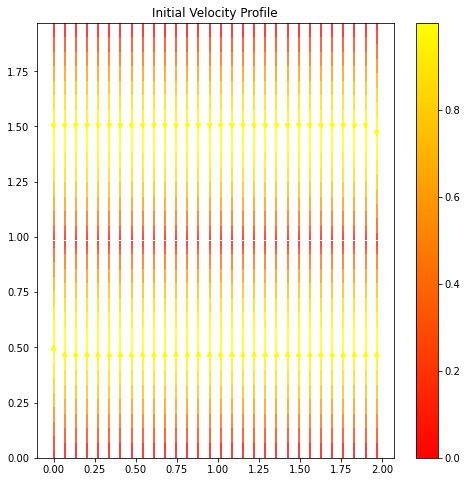

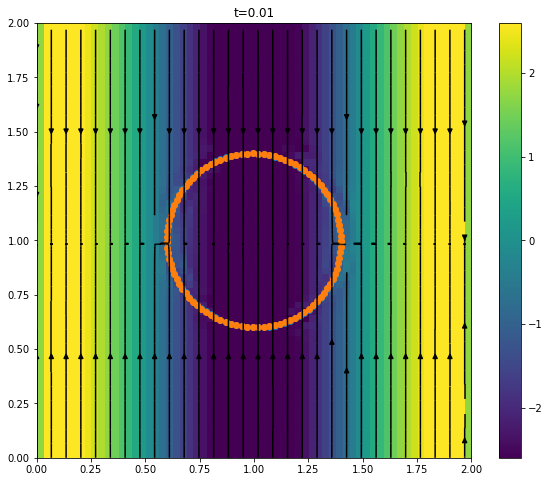

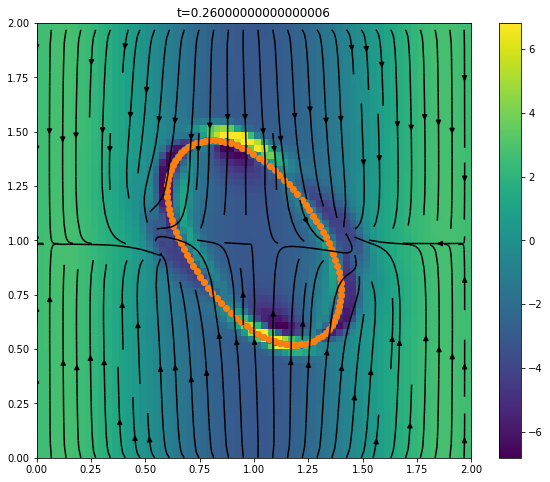

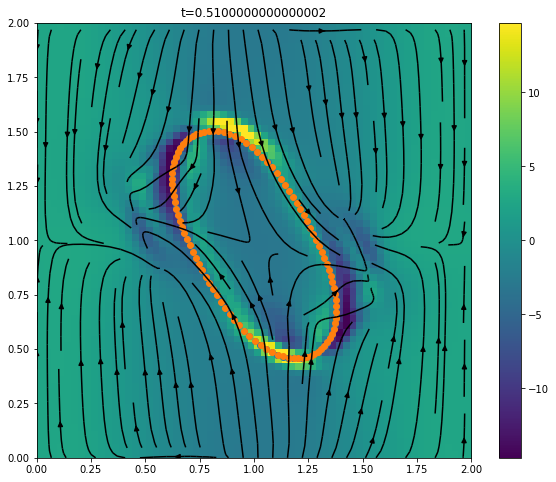

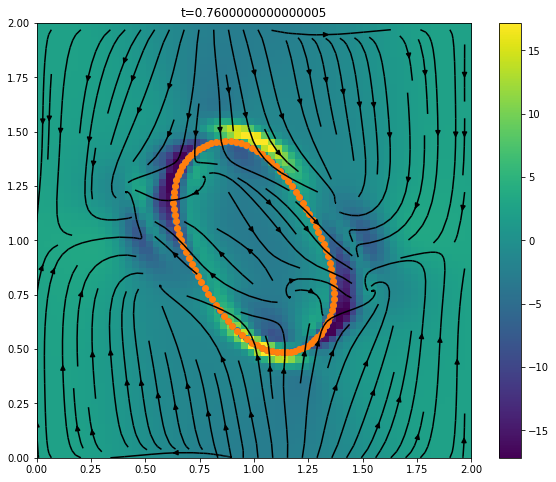

...

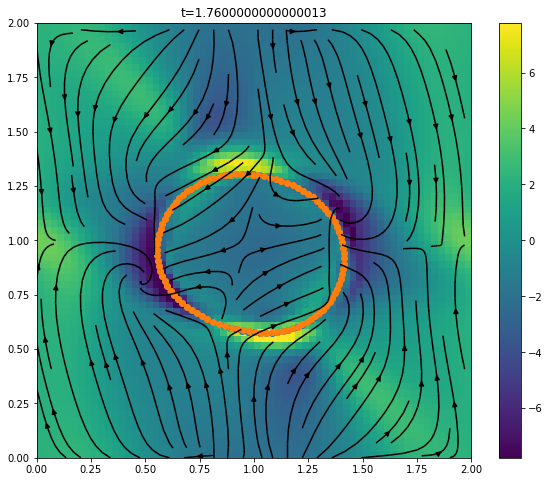

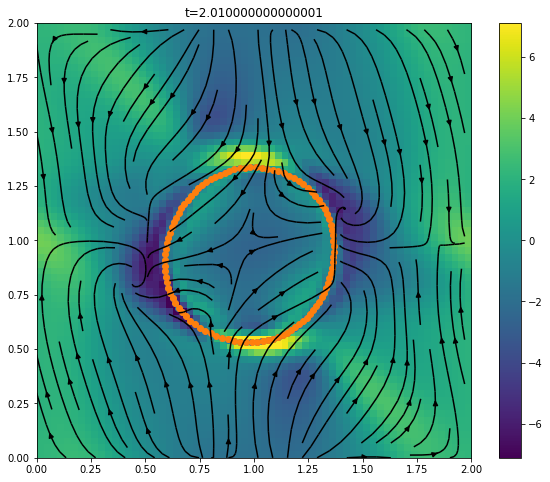

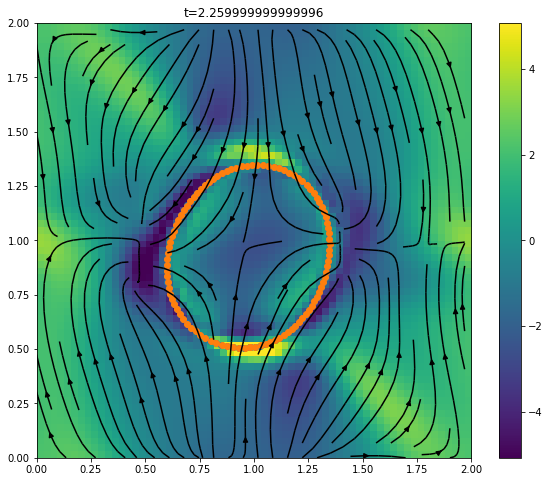

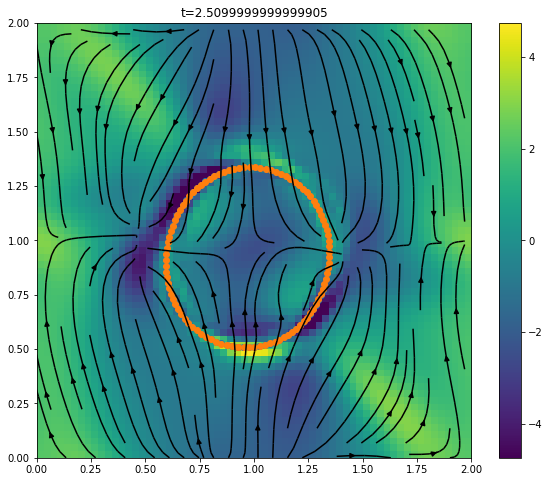

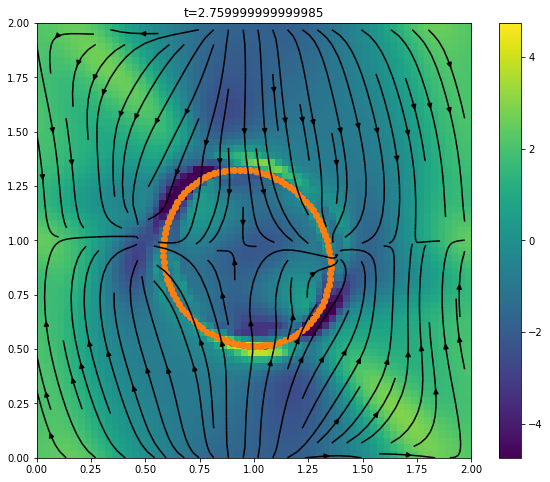

In [2]:
import numpy as np 
import matplotlib.pyplot as plt

from fluid import FLUID    #### Generic fluid solver
from ib2 import IB2        #### 2D Immersed Boundary object

# #### Explicitly iterate fluid and immersed solids
# def iterate(fluid, solids):
#     dt = fluid.dt
#     fluid.t += dt
    
#     ff = np.zeros(np.shape(fluid.u)) ## Force density on fluid
#     for solid in solids:
#         solid.XX=solid.X+(dt/2)*solid.interp(fluid.u,solid.X) # Euler step to midpoint
#         F = solid.Force(solid.XX)
#         ff += solid.vec_spread(F,solid.XX) # Force at midpoint
#     fluid.u,uu=fluid.fluid(fluid.u,ff) # Step Fluid Velocity
#     for solid in solids:
#         solid.X+=dt*solid.interp(uu,solid.XX) # full step using midpoint velocity            


#### Iterate fluids and immersed solids using built-in functions
def iterate(fluid, solids):
    dt = fluid.dt
    fluid.t += dt
    
    ff = 0.#np.zeros(np.shape(fluid.u)) ## Force density on fluid
    for solid in solids:
        solid.step_XX(fluid.u)
        ff += solid.ff # Force at midpoint
    uu=fluid.step_u(ff) # Step Fluid Velocity
    for solid in solids:
        solid.step_X(uu) # full step using midpoint velocity            

        
        
        
#### Set the boundary points of solid to a circle of specified radius (float) and position (1x2 float)
def CIRCLE(Nb, RAD, POS):  
    theta = np.linspace(0, 2*np.pi, Nb)
    return np.array(POS)[:, np.newaxis] + RAD*np.array([np.cos(theta), np.sin(theta)])


def PLANE_WAVE(N):
        u = np.zeros([2, N, N])
        u[1] += np.sin(np.linspace(0, 2*np.pi, N))[:, np.newaxis]
        return u
    
    
#### Initialization
fluid = FLUID(L=2.)
fluid.u = PLANE_WAVE(fluid.N)
plt.figure(figsize=(8, 8))
fluid.show_streamlines(cmap='autumn')
plt.title('Initial Velocity Profile')
plt.show()

circle = CIRCLE(100, 0.2, (0.5, 0.5))*fluid.L
solids = IB2(circle, fluid.N, fluid.h, fluid.dt)
solids = [solids]

for i in range(300):
    iterate(fluid, solids)
    if i%25==0:
        plt.figure(figsize=(10, 8))
        fluid.show_vorticity()
        fluid.show_streamlines()
        for solid in solids:
            solid.show_X()
            plt.scatter(solid.XX[0], solid.XX[1])
        plt.title('t={}'.format(fluid.t))
        plt.show()
        

Next, let's try two circles:

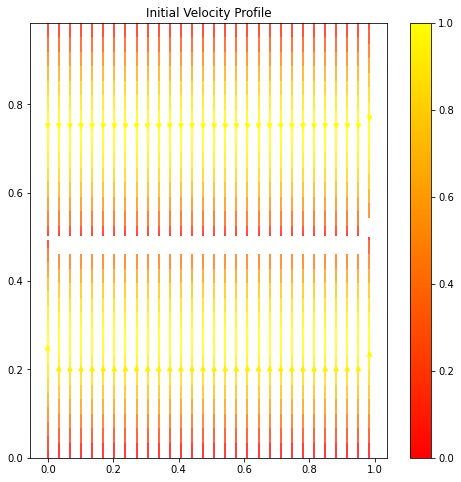

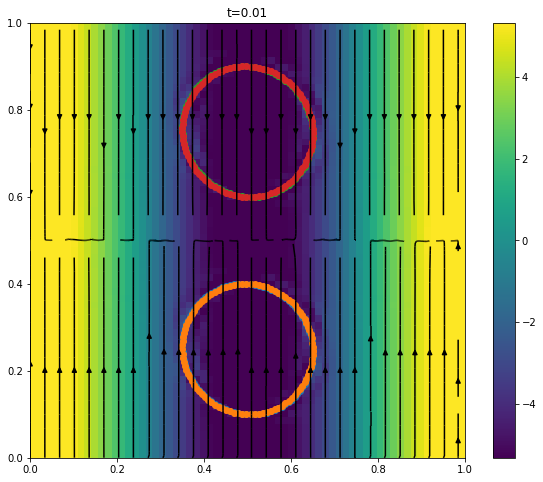

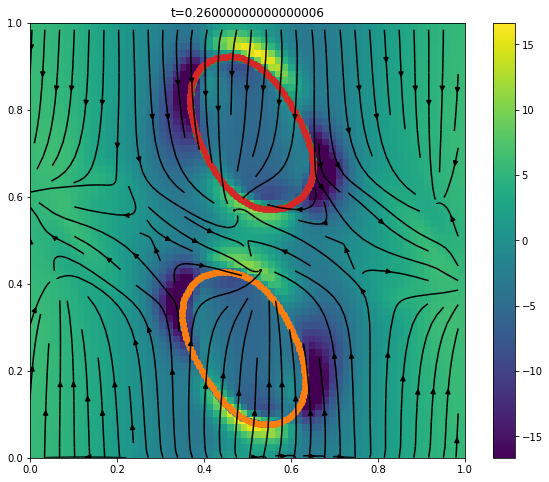

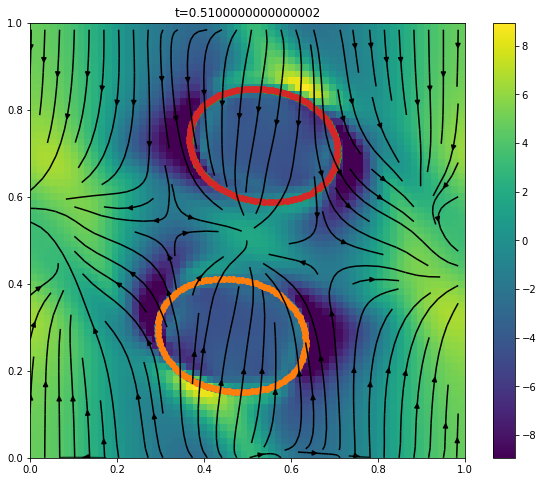

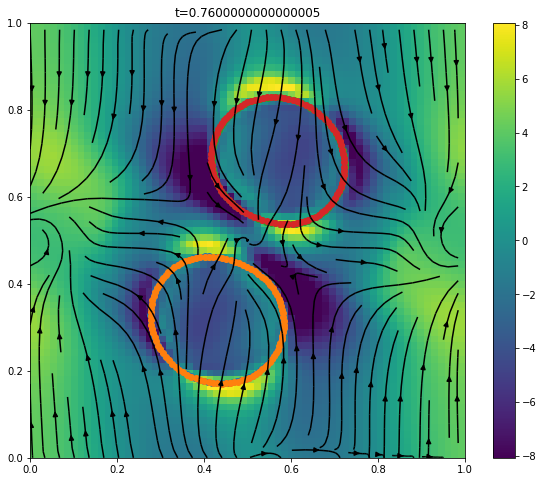

...

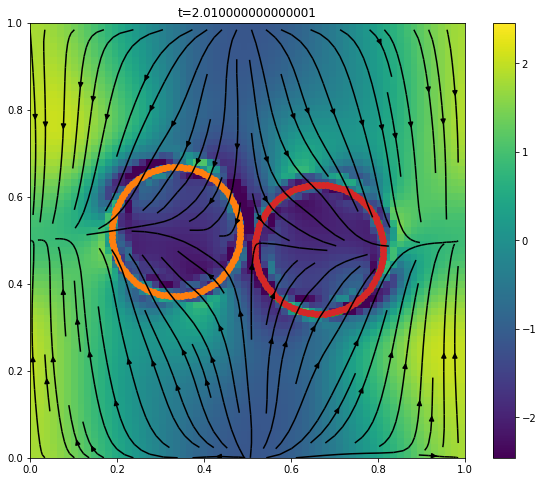

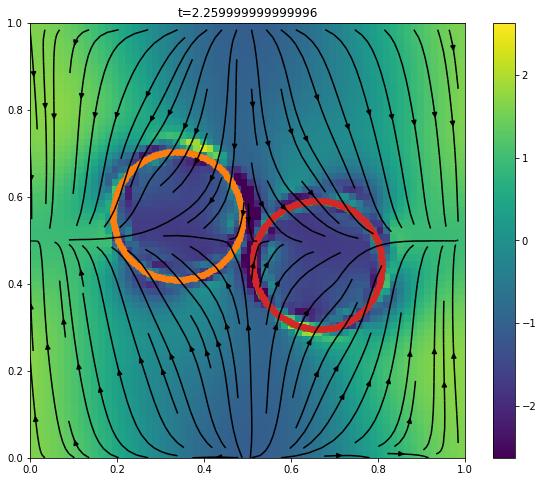

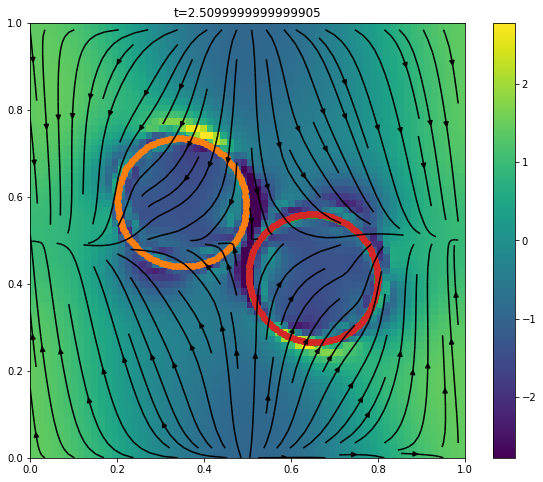

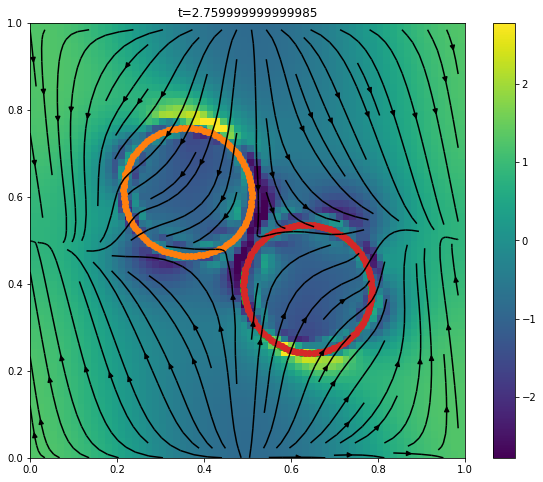

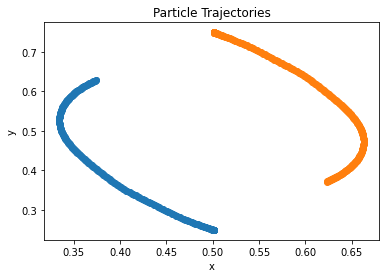

In [2]:
fluid = FLUID()
plt.figure(figsize=(8, 8))
fluid.show_streamlines(cmap='autumn')
plt.title('Initial Velocity Profile')
plt.show()

circles = [CIRCLE(100, 0.15, (0.5, 0.5+DY))*fluid.L for DY in [-0.25, 0.25]] 
solids = [IB2(circle, fluid.N, fluid.h, fluid.dt) for circle in circles]

# solids = TWO_CIRCLES(sim.N, sim.h, SEPARATION=.5)
# solids = [CIRCLE(100, sim.N, sim.h, R=.15, R0=(.5, .5))]
# solids = [CIRCLE(100, sim.N, sim.h, R=.25, R0=(.5, .5))]
# for i in range(200):
#     iterate(sim, solids, ext)

    
#### Run the experiment
X1 = []
X2 = []
for i in range(300):
    iterate(fluid, solids)
    if i%25==0:
        plt.figure(figsize=(10, 8))
        fluid.show_vorticity()
        fluid.show_streamlines()
        for solid in solids:
            solid.show_X()
            plt.scatter(solid.XX[0], solid.XX[1])
        plt.title('t={}'.format(fluid.t))
        plt.show()
    X1.append(np.sum(solids[0].X, axis=1)/solids[0].Nb)
    X2.append(np.sum(solids[1].X, axis=1)/solids[1].Nb)

#### Results
X1 = np.array(X1)
X2 = np.array(X2)
plt.scatter(X1[:,0], X1[:,1])
plt.scatter(X2[:,0], X2[:,1])
plt.xlabel('x')
plt.ylabel('y')
plt.title('Particle Trajectories')
plt.show()



In [ ]:
fig, ax = plt.subplots()

x = np.arange(0, 2*np.pi, 0.01)
line, = ax.plot(x, np.sin(x))


def animate(i):
    line.set_ydata(np.sin(x + i / 50))  # update the data.
    return line,


ani = animation.FuncAnimation(
    fig, animate, interval=20, blit=True, save_count=50)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

plt.show()



# Solid Circle

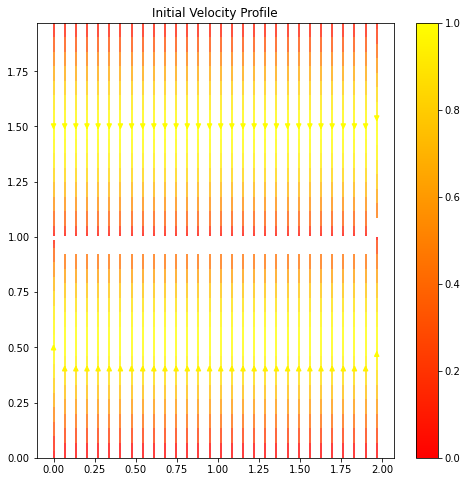

[1.004 1.   ]


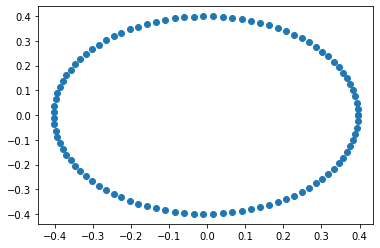

Omega
[0. 0.]
ax
[0. 0.]


/home/jackie/Desktop/Immersed Boundary Method/ib2.py:53: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  U[0,k]=np.sum(w*u[0][ii]);
/home/jackie/Desktop/Immersed Boundary Method/ib2.py:54: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  U[1,k]=np.sum(w*u[1][ii]);
/home/jackie/Desktop/Immersed Boundary Method/ib2.py:85: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will resu

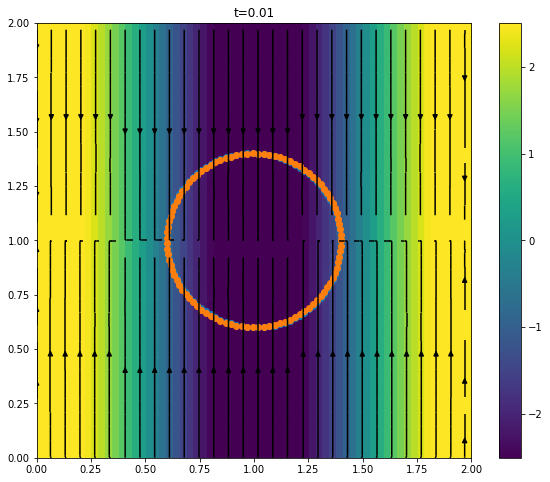

[[ 1.00004103e+00 -4.18527371e-05]
 [ 4.10296899e-05  9.99958146e-01]]
Omega
[-0.0041855  -0.00410275]
ax
[-0.71413085 -0.70001224]


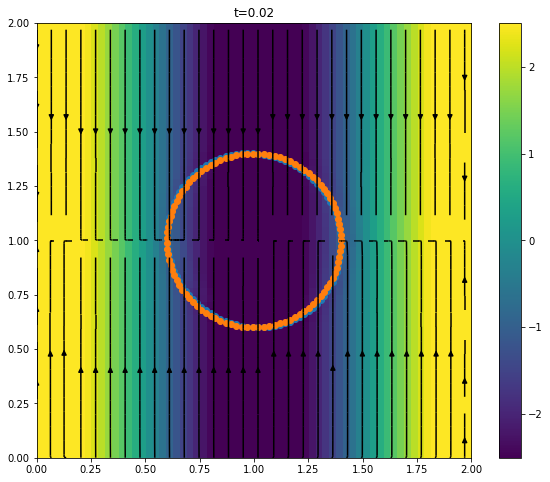

[[ 1.00020529e+00 -2.09504952e-04]
 [ 2.05315168e-04  9.99790466e-01]]
Omega
[-0.020955   -0.02052708]
ax
[-0.71436312 -0.6997752 ]


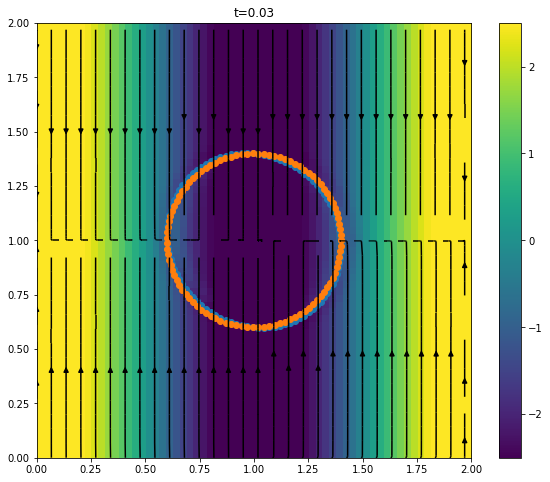

[[ 1.00061645e+00 -6.29837670e-04]
 [ 6.16651513e-04  9.99369960e-01]]
Omega
[-0.06301954 -0.06163003]
ax
[-0.71494473 -0.69918097]


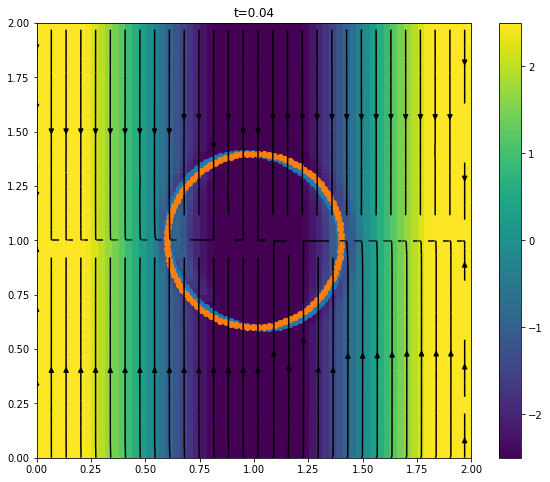

[[ 1.00152167 -0.00155869]
 [ 0.00152271  0.99844027]]
Omega
[-0.15607226 -0.15207191]
ax
[-0.71622613 -0.69786828]


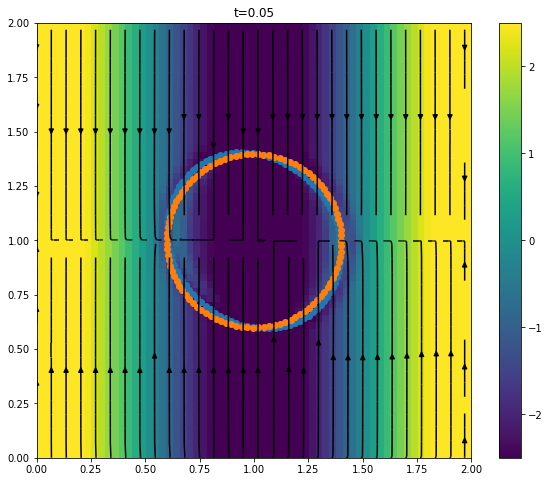

[[ 1.00341235 -0.00351423]
 [ 0.0034171   0.99648102]]
Omega
[-0.35241091 -0.34074405]
ax
[-0.71890665 -0.69510663]


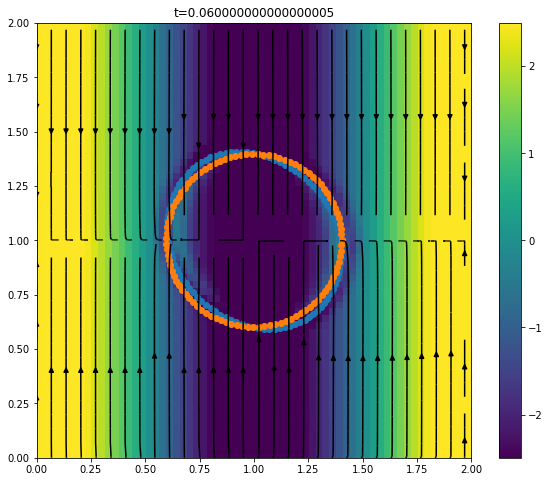

[[ 1.00725444 -0.00755431]
 [ 0.0072748   0.99242533]]
Omega
[-0.75984922 -0.72317585]
ax
[-0.72437121 -0.68941015]


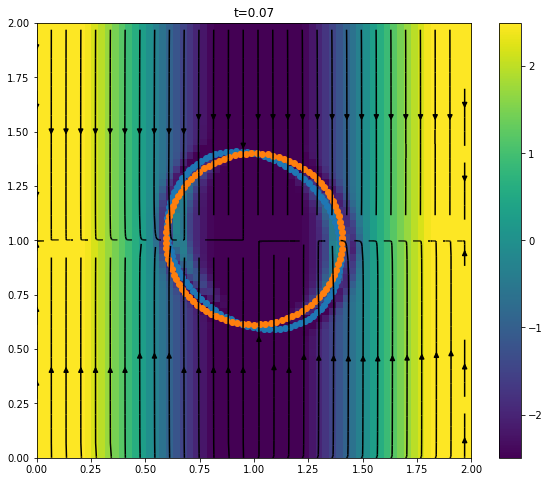

[[ 1.01489922 -0.01586967]
 [ 0.01498395  0.98404561]]
Omega
[-1.60586089 -1.48008712]
ax
[-0.73531581 -0.67772462]


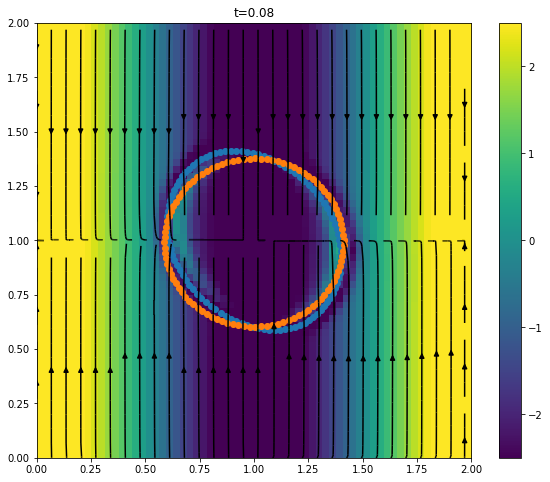

[[ 1.02968583 -0.03310707]
 [ 0.03003361  0.96654514]]
Omega
[-3.38954998 -2.92775958]
ax
[-0.75677651 -0.6536737 ]


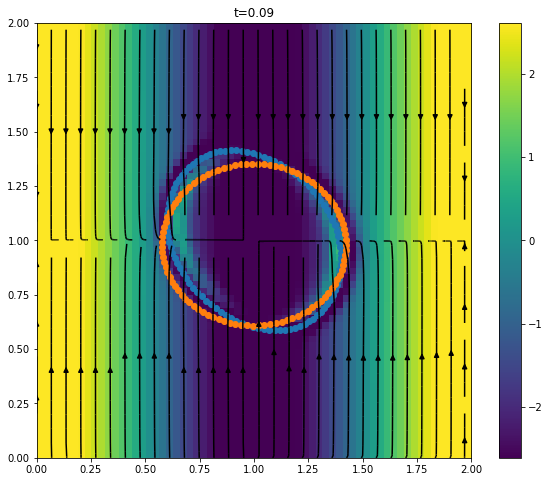

[[ 1.0566623  -0.06944199]
 [ 0.05808326  0.92913705]]
Omega
[-7.26742301 -5.50461224]
ax
[-0.79714554 -0.60378721]


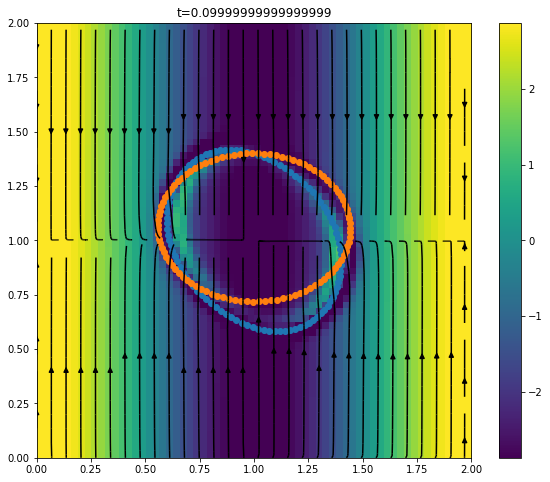

[[ 1.09844051 -0.14738802]
 [ 0.10427444  0.84677806]]
Omega
[-16.01745355  -9.26910515]
ax
[-0.86552368 -0.50086801]


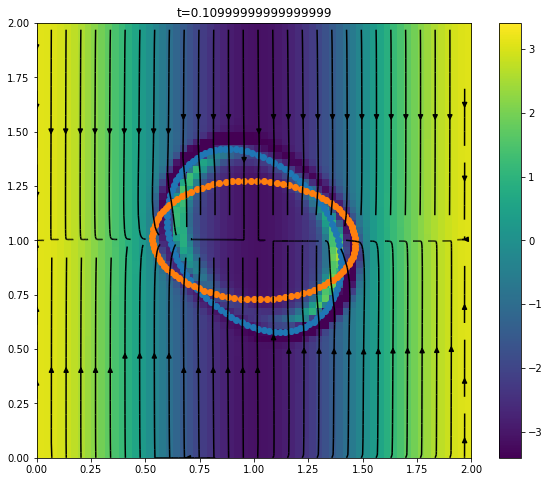

[[ 1.12624459 -0.30866327]
 [ 0.15059922  0.6669821 ]]
Omega
[-35.19417293 -11.291874  ]
ax
[-0.95219031 -0.30550549]


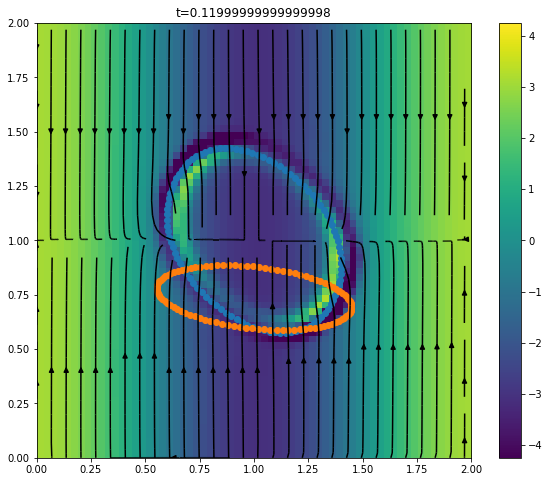

[[ 0.98125131 -0.53986735]
 [ 0.07700465  0.36437931]]
Omega
[-60.22542468  -1.00084301]
ax
[-0.99986194 -0.01661599]


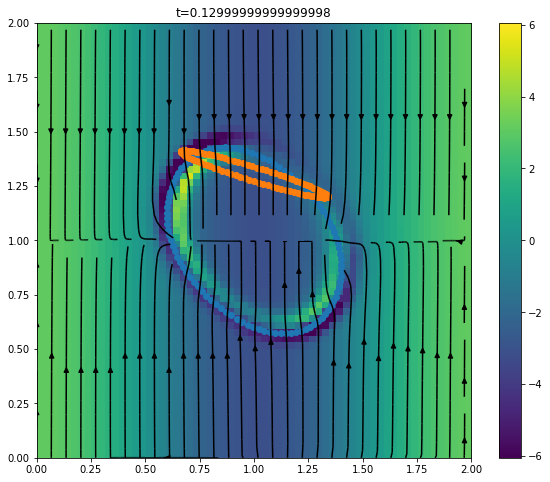

[[ 0.64164562 -0.55170223]
 [-0.14112821  0.2310716 ]]
Omega
[-52.79826025  15.2949639 ]
ax
[-0.96050955  0.27824703]


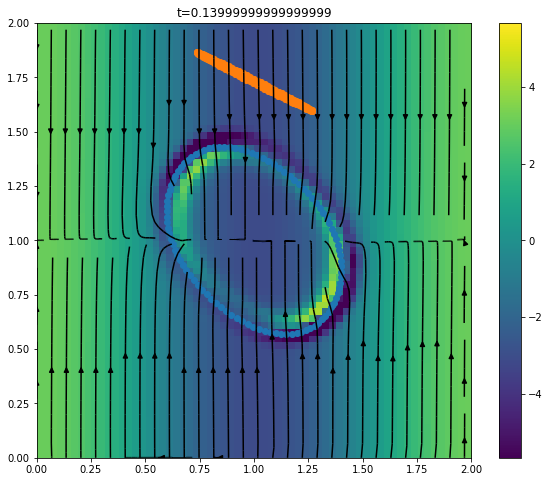

[[ 0.48168336 -0.45529371]
 [-0.22464817  0.25103782]]
Omega
[-45.93755196  23.08026568]
ax
[-0.89355805  0.44894768]


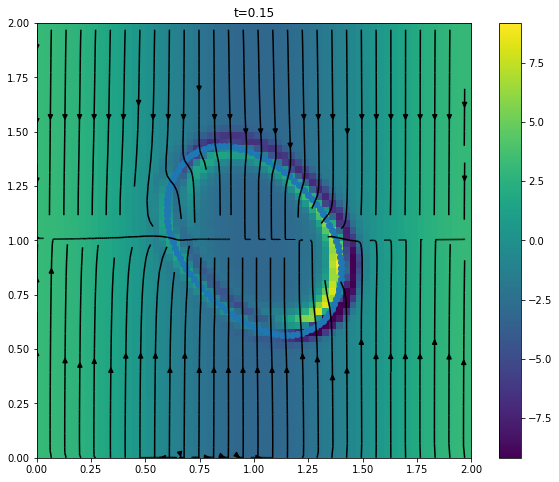

[[ 0.38473792 -0.3753687 ]
 [-0.26497481  0.27434403]]
Omega
[-35.58884159  25.18043916]
ax
[-0.81633081  0.57758464]


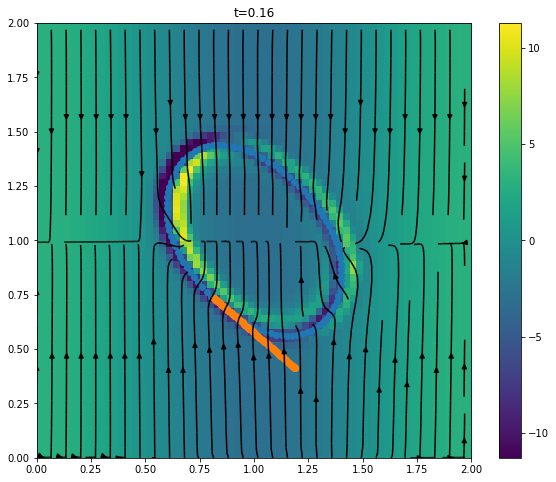

[[ 0.33177435 -0.32725891]
 [-0.28291537  0.28743081]]
Omega
[-24.78501671  21.41432896]
ax
[-0.75668575  0.65377876]


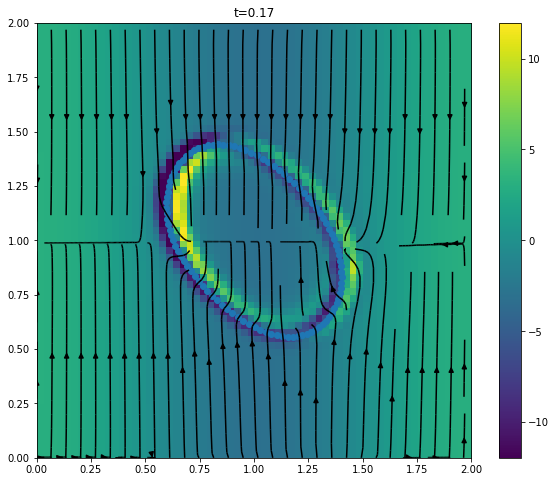

[[ 0.30818435 -0.30528292]
 [-0.28969336  0.29259479]]
Omega
[-16.23823395  15.38367345]
ax
[-0.72595082  0.68774661]


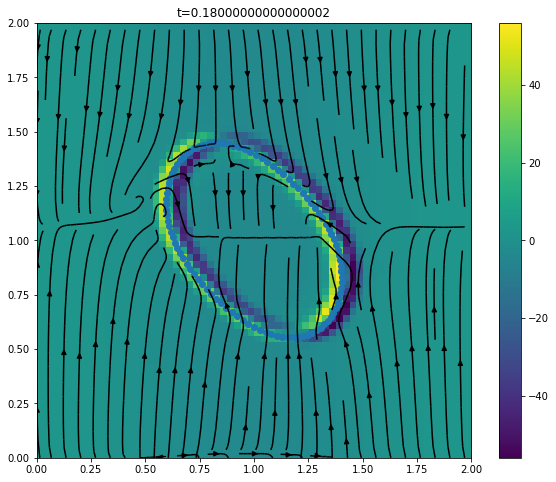

[[ 0.29953563 -0.29726655]
 [-0.29190666  0.29417574]]
Omega
[-10.89525718  10.66419117]
ax
[-0.71464424  0.69948811]


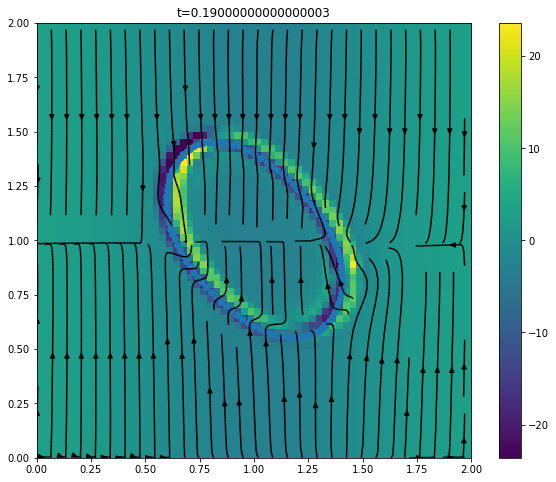

[[ 0.29669588 -0.2947104 ]
 [-0.29256816  0.29455365]]
Omega
[-8.68486032  8.56817825]
ax
[-0.71187266  0.70230857]


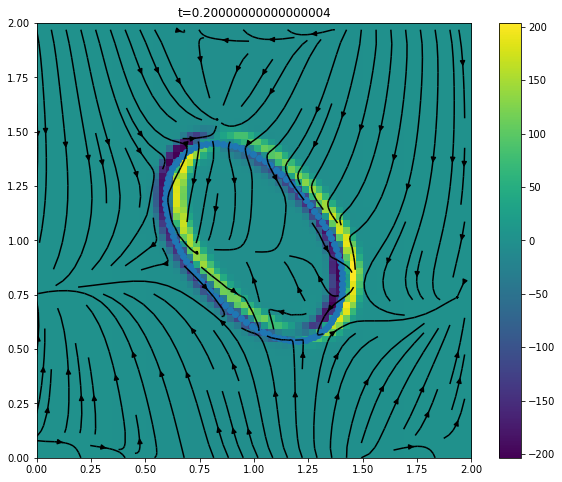

[[ 0.29606267 -0.29419994]
 [-0.29265492  0.29451764]]
Omega
[-12.54198075  12.38184496]
ax
[-0.71163526  0.70254911]


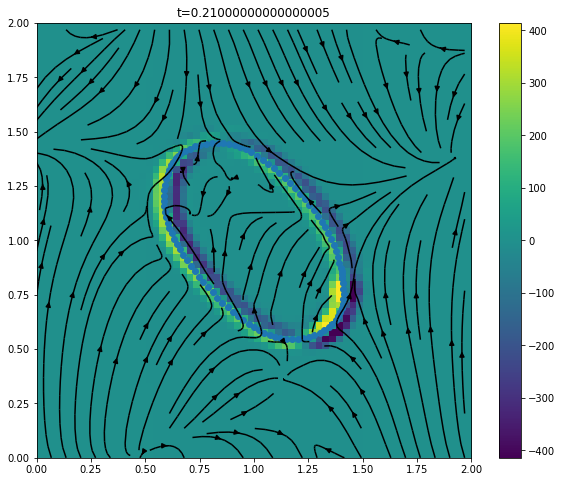

[[ 0.29827322 -0.2960226 ]
 [-0.28323922  0.28548984]]
Omega
[-206.06077565  196.912693  ]
ax
[-0.72297286  0.69087643]


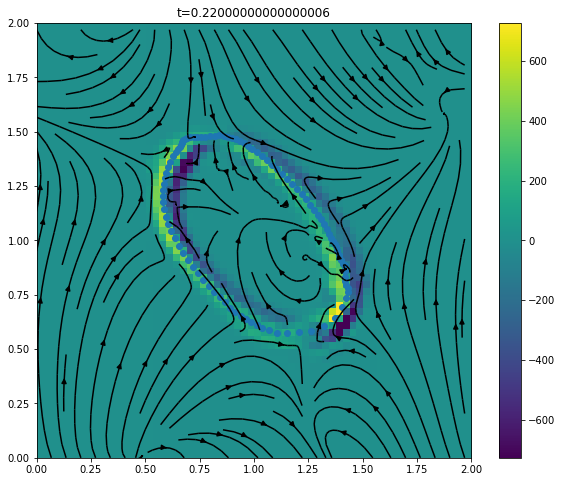

[[ 0.3361024  -0.33384012]
 [-0.24276557  0.24502786]]
Omega
[-3297.18218727  2400.05089353]
ax
[-0.80849105  0.58850848]


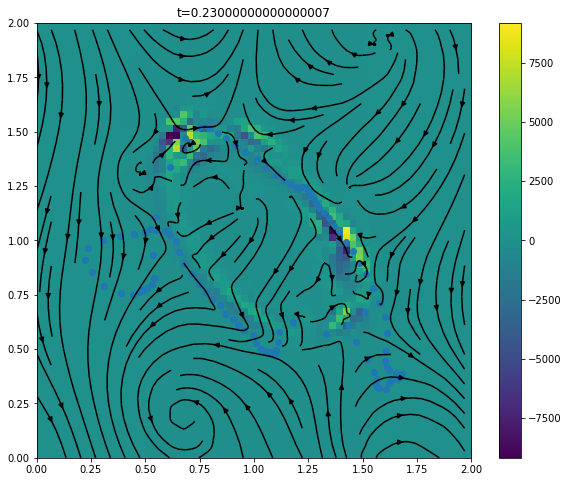

[[-0.54483826  0.53635305]
 [ 0.01365713 -0.02214234]]
Omega
[-60842.11995184   2001.66404983]
ax
[-0.99945926  0.03288152]


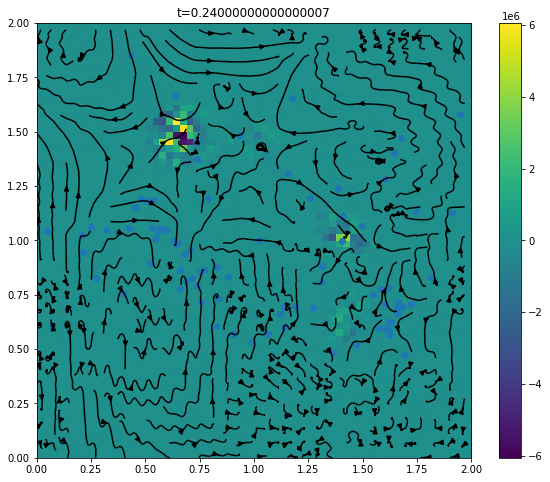

[[ 1.46104799 -1.4293209 ]
 [ 0.90464153 -0.87291445]]
Omega
[-1437704.21421836  -884320.40014322]
ax
[-0.85176954 -0.52391665]


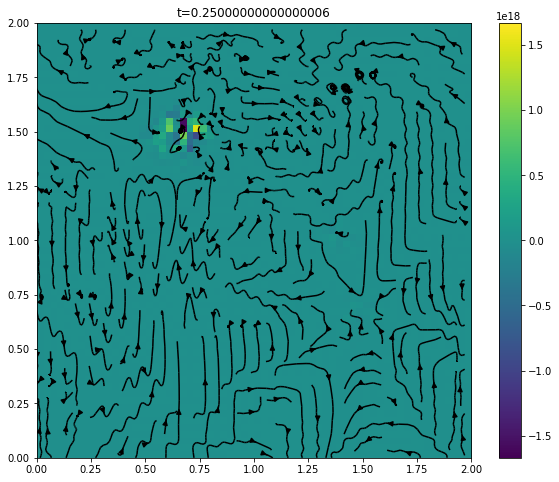

[[-2.49890528  2.42392946]
 [-2.23018708  2.15521127]]
Omega
[-9570299.66332575 -8525903.27381627]
ax
[-0.74667394 -0.66519022]


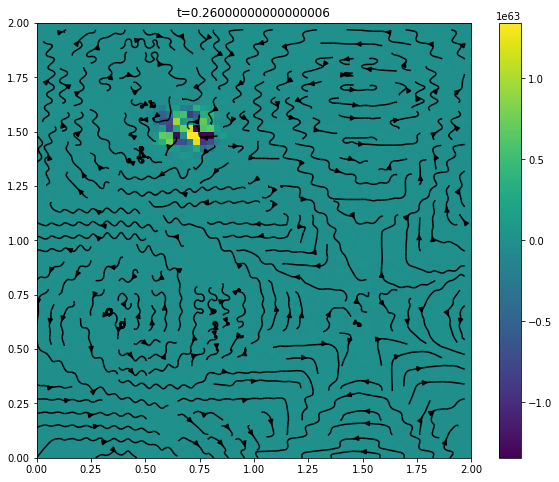

[[-3.28788168  3.17727453]
 [-3.31604629  3.20543914]]
Omega
[1.49947826e+17 1.51253681e+17]
ax
[0.70403451 0.71016576]


/home/jackie/Desktop/Immersed Boundary Method/ib2.py:29: RuntimeWarning: invalid value encountered in sqrt
  q=np.sqrt(1+4*r*(1-r))
/home/jackie/Desktop/Immersed Boundary Method/ib2.py:46: RuntimeWarning: overflow encountered in long_scalars
  i1 = np.arange(i[0,k]-1, i[0,k]+3)%N
/home/jackie/Desktop/Immersed Boundary Method/ib2.py:47: RuntimeWarning: overflow encountered in long_scalars
  i2 = np.arange(i[1,k]-1, i[1,k]+3)%N
/home/jackie/Desktop/Immersed Boundary Method/ib2.py:78: RuntimeWarning: overflow encountered in long_scalars
  i1 = np.arange(i[0,k]-1, i[0,k]+3)%N
/home/jackie/Desktop/Immersed Boundary Method/ib2.py:79: RuntimeWarning: overflow encountered in long_scalars
  i2 = np.arange(i[1,k]-1, i[1,k]+3)%N


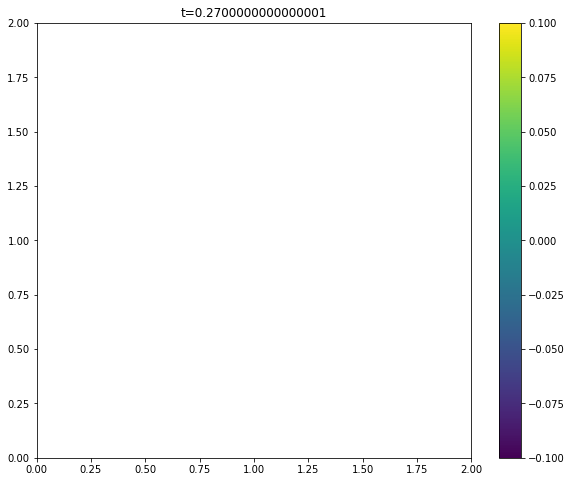

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


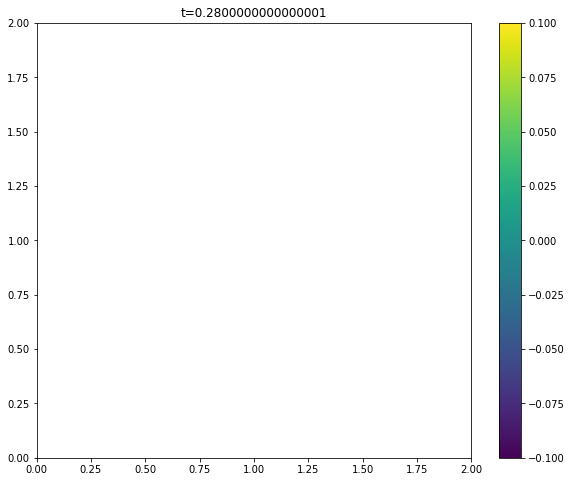

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


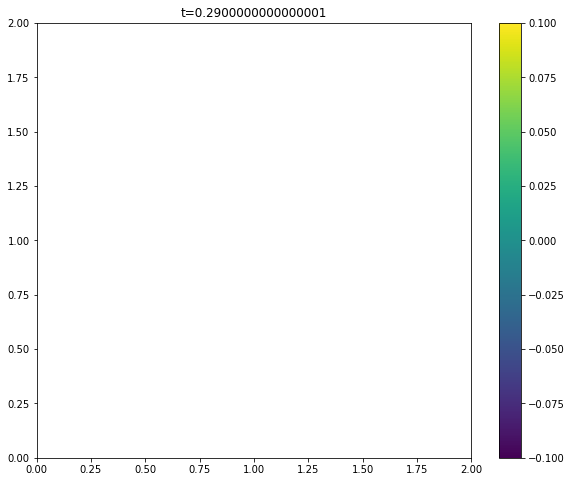

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


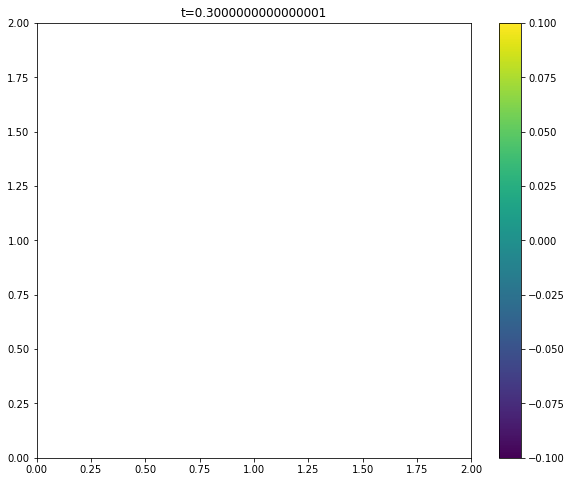

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


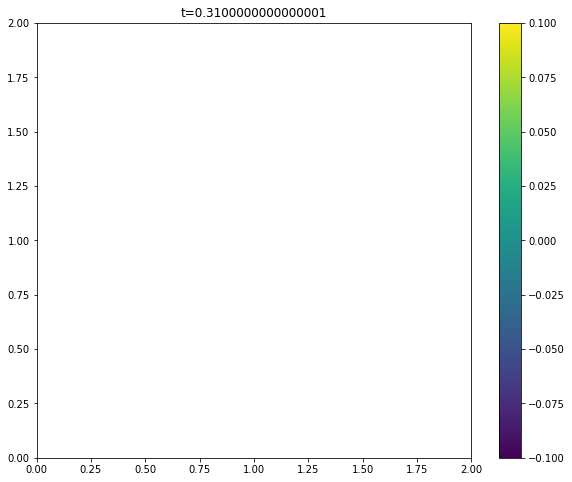

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


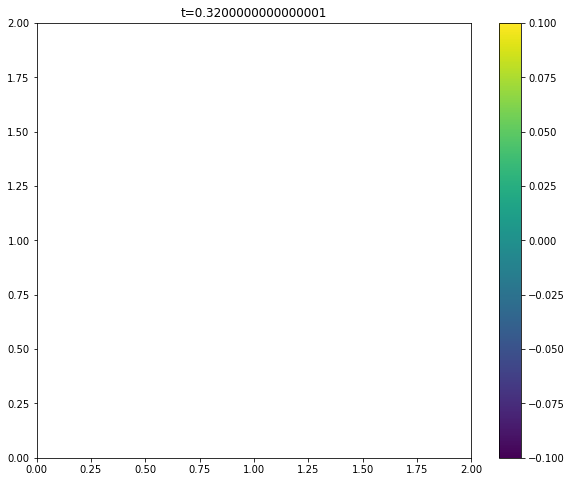

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


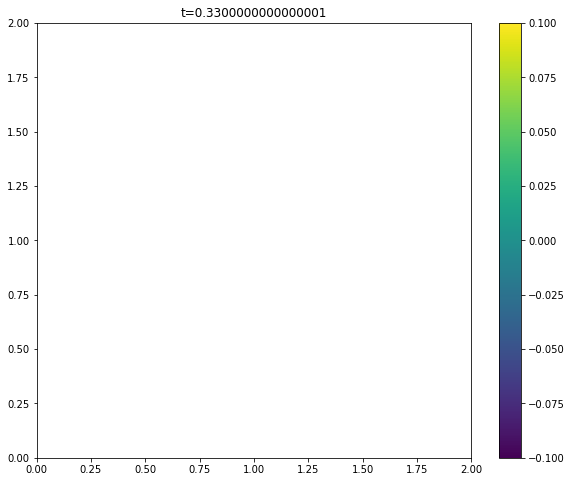

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


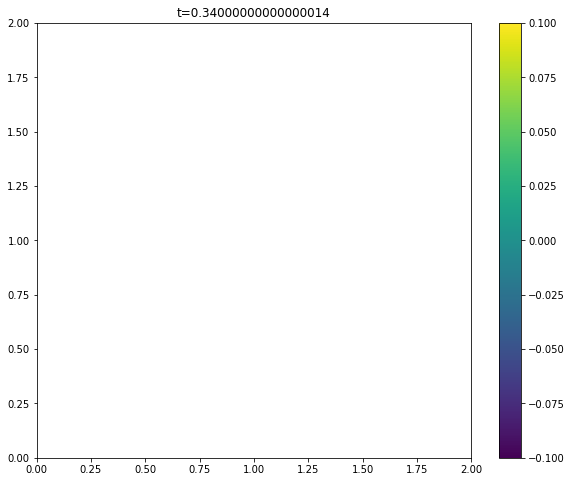

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


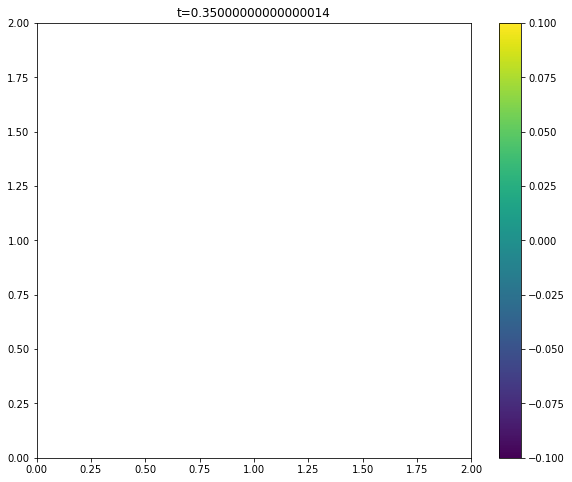

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


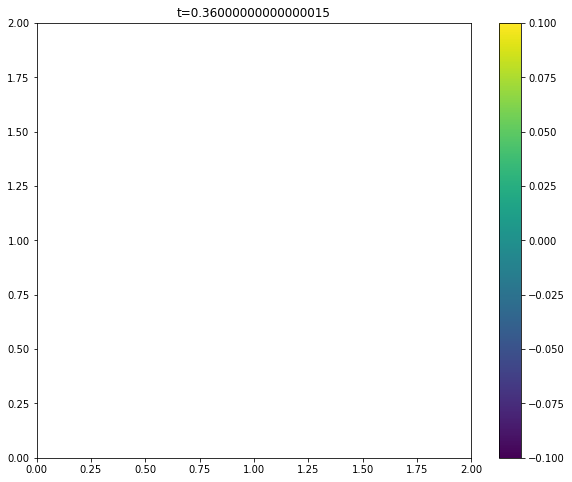

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


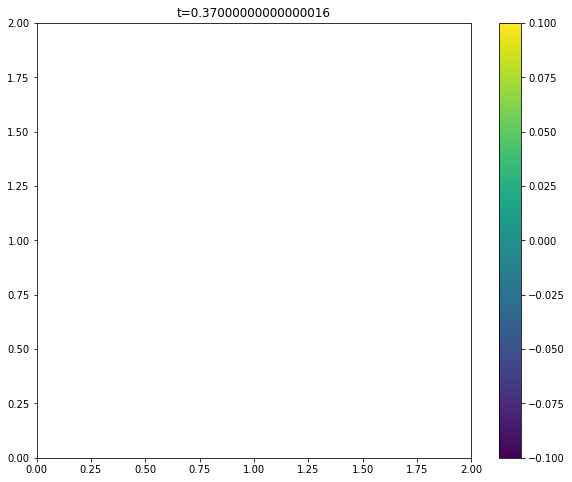

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


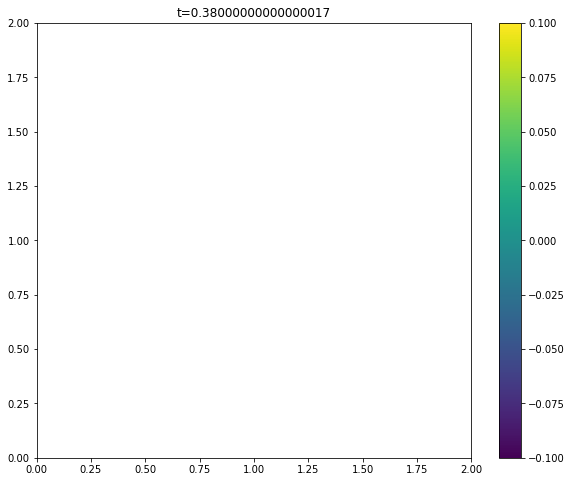

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


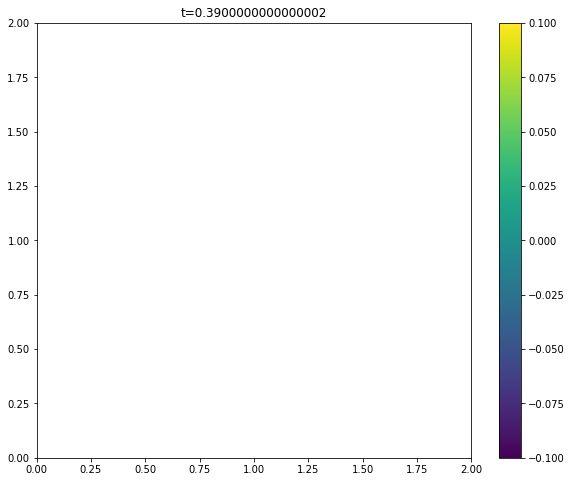

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


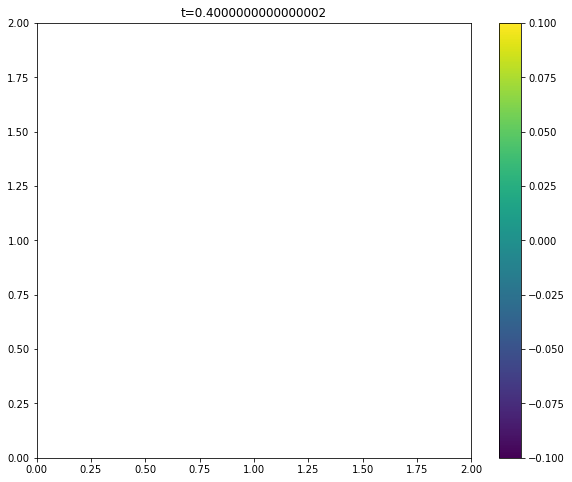

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


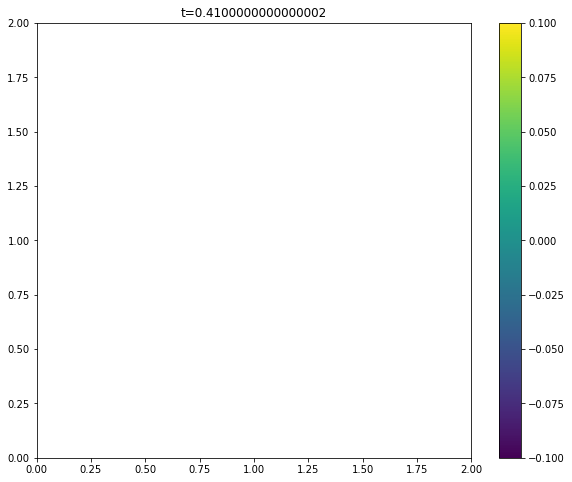

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


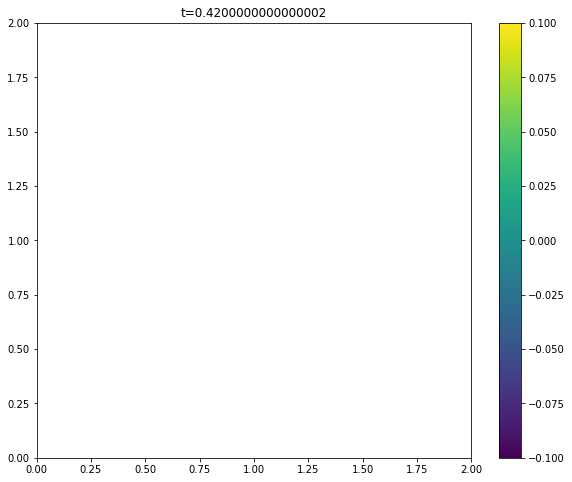

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


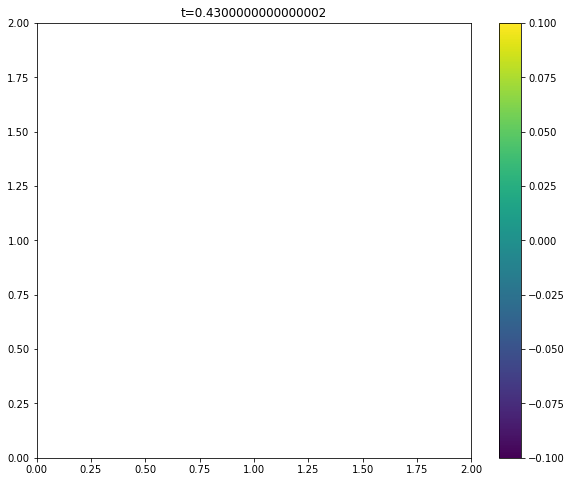

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


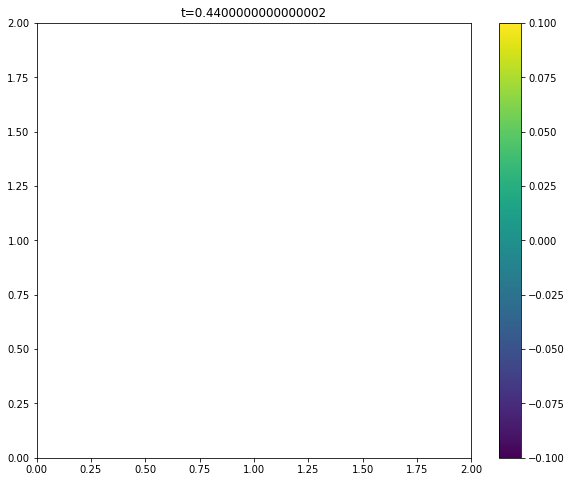

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


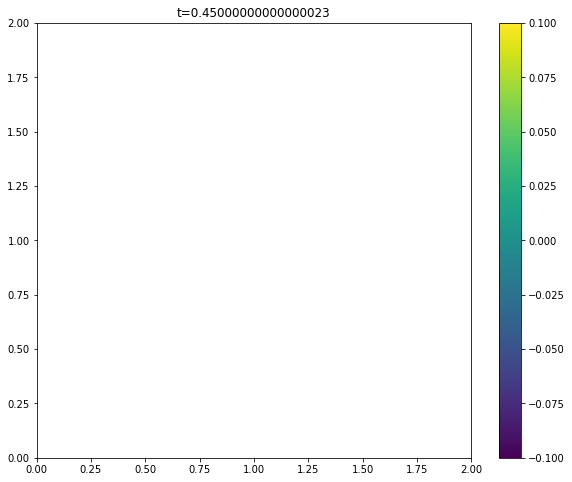

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


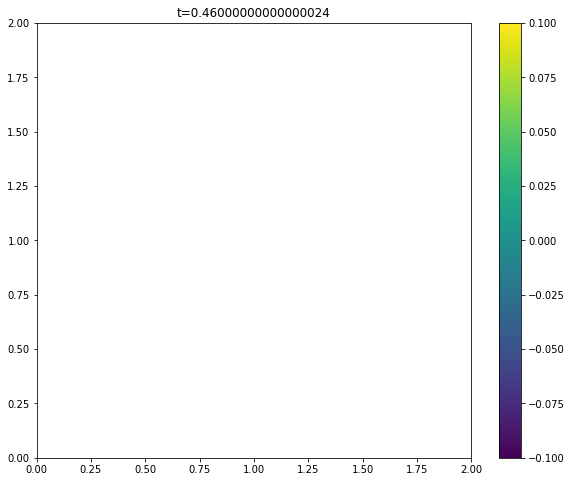

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


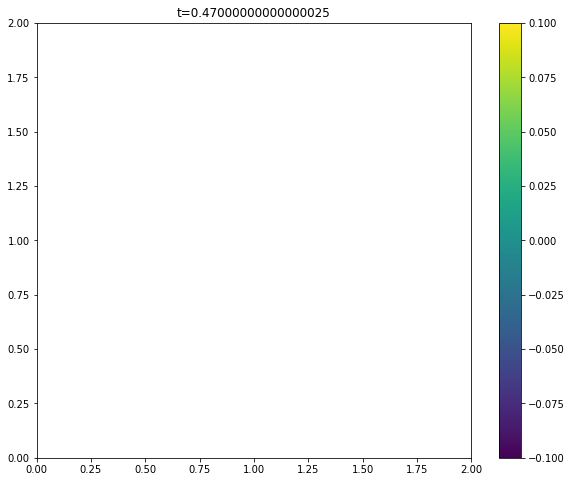

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


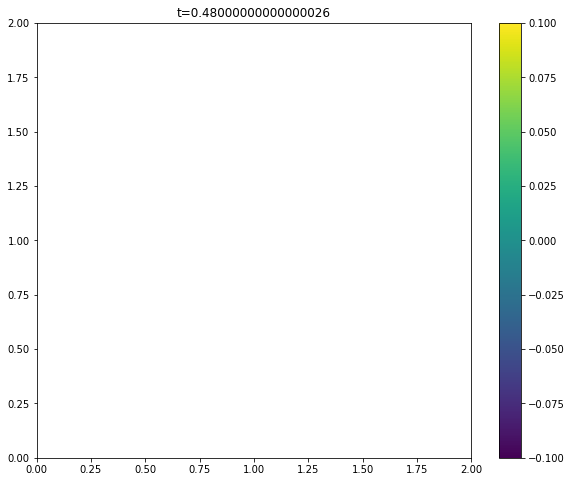

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


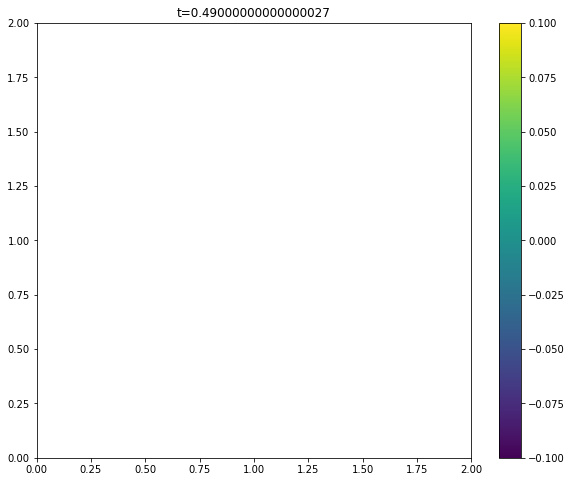

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


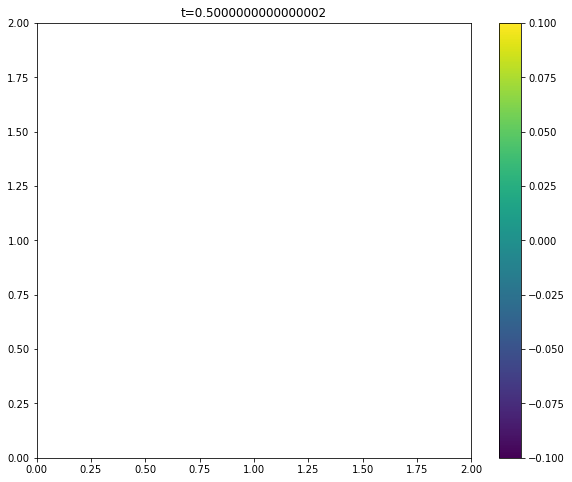

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


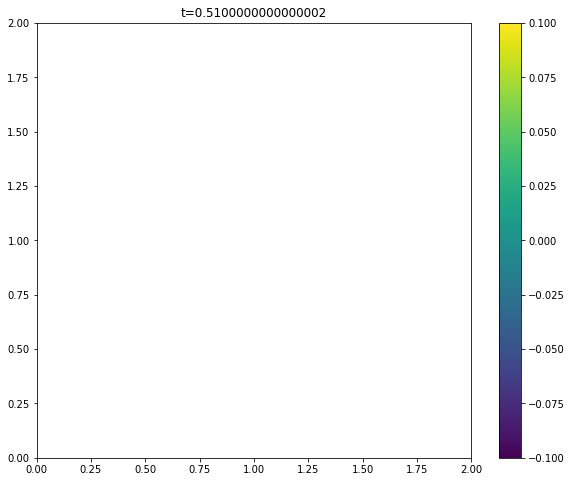

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


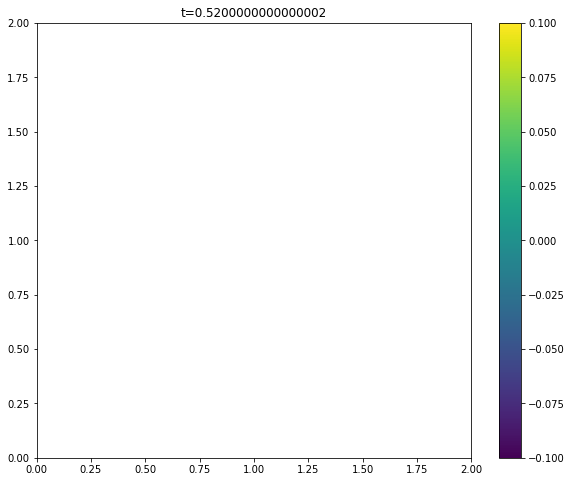

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


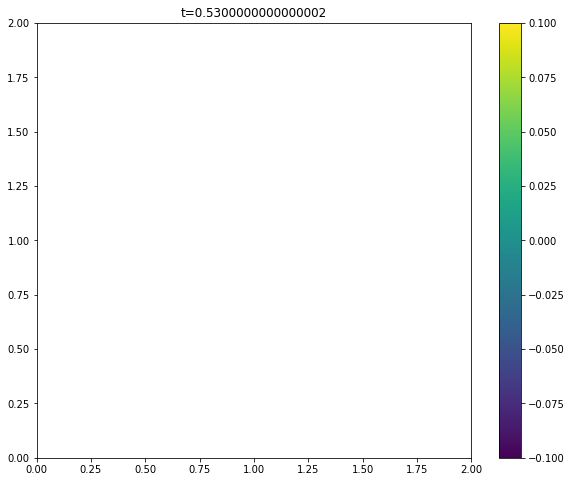

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


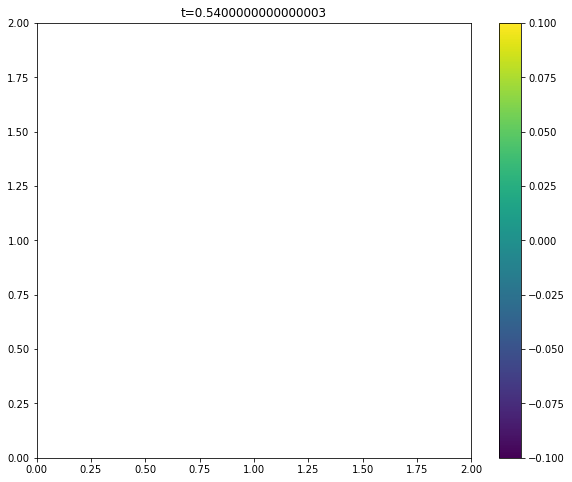

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


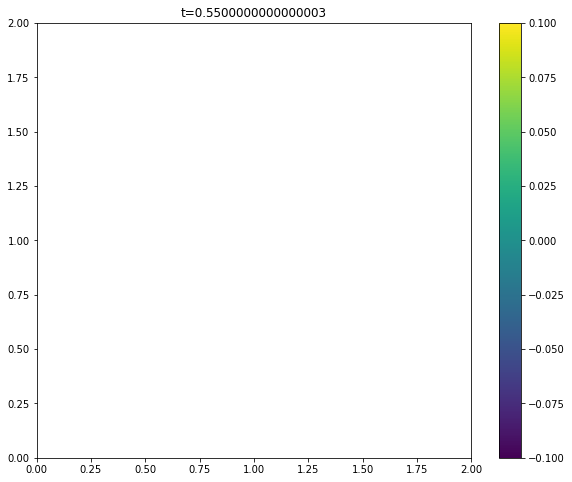

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


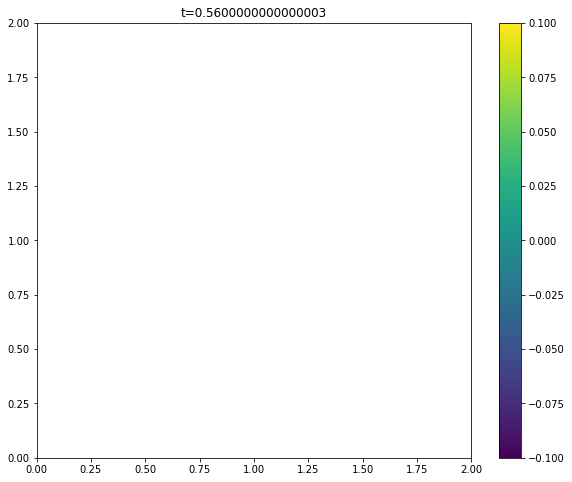

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


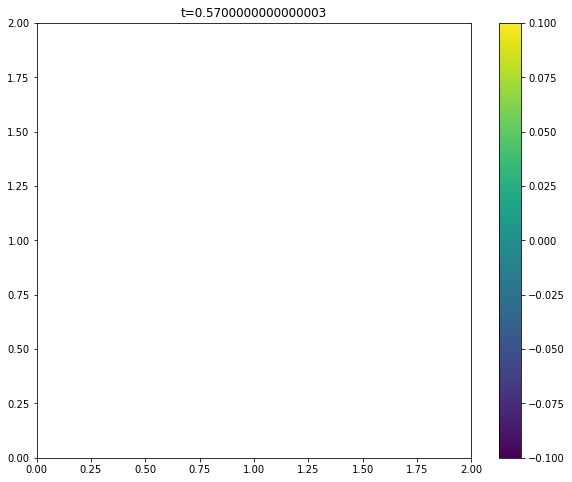

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


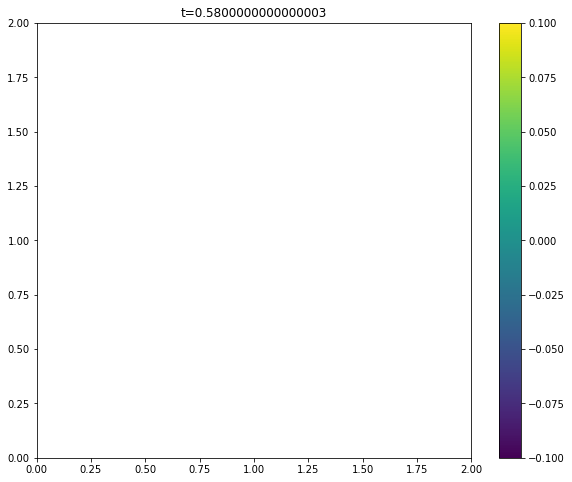

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


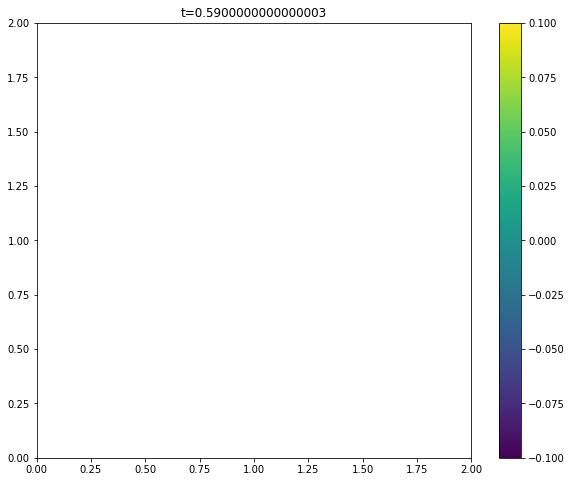

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


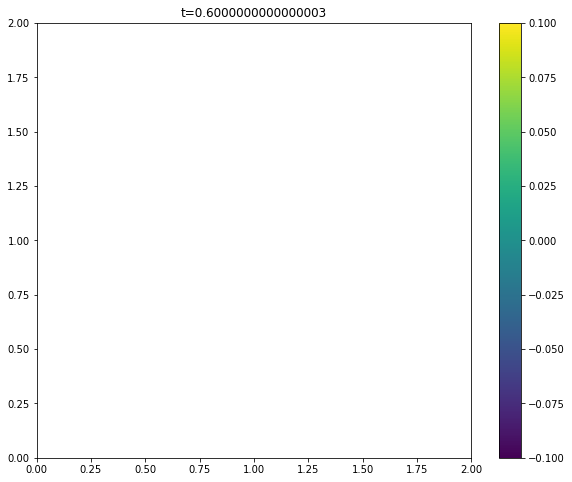

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


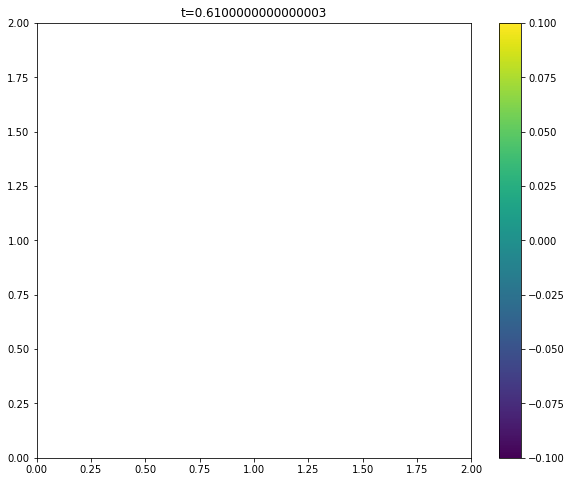

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


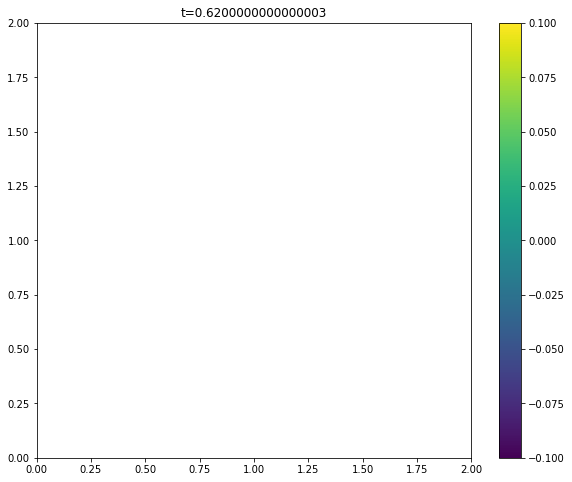

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


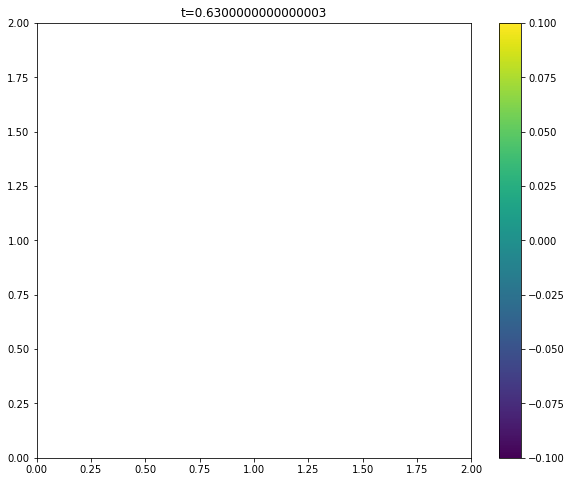

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


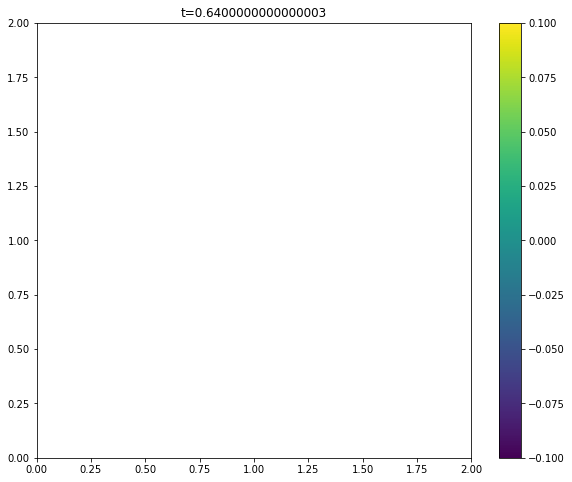

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


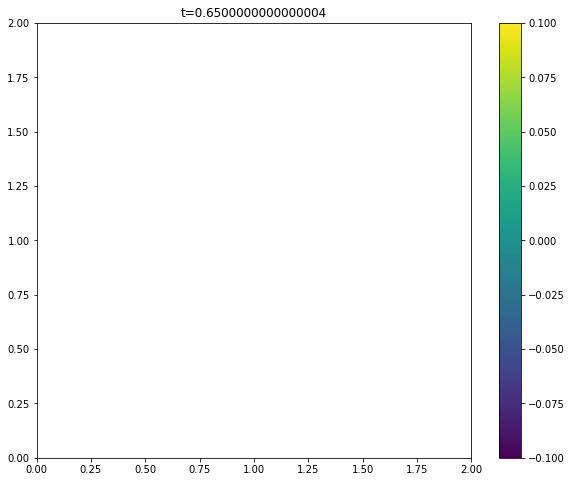

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


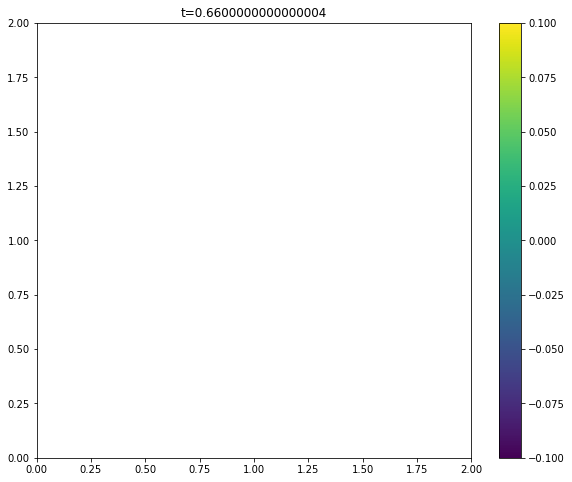

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


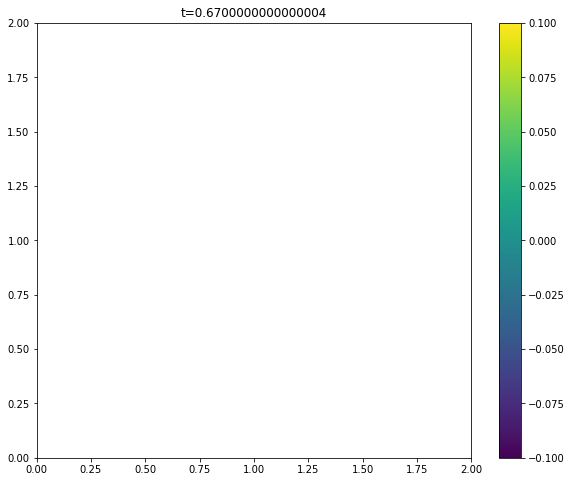

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


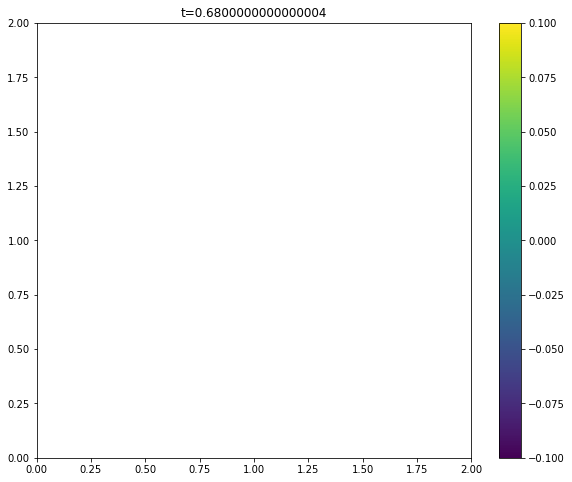

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


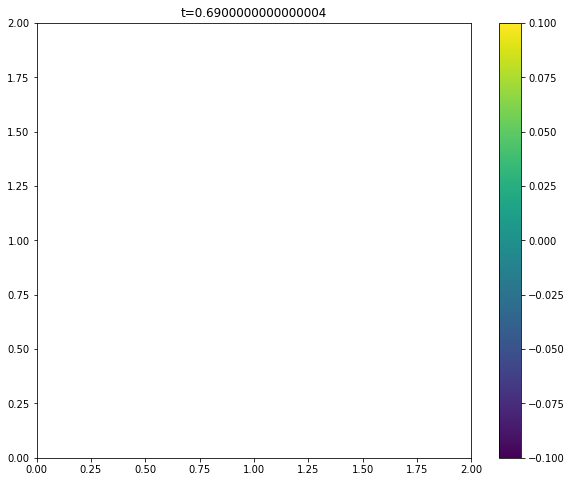

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


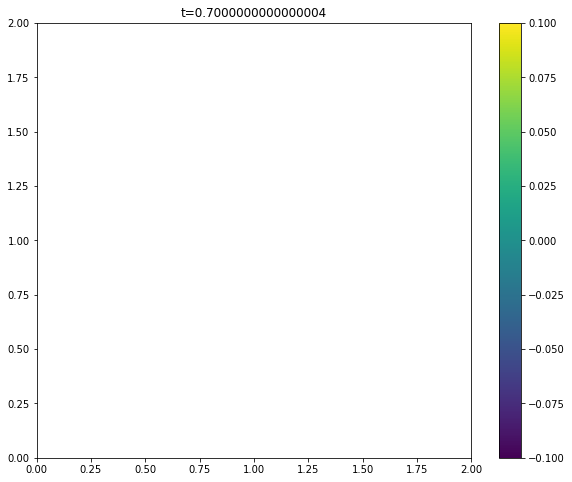

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


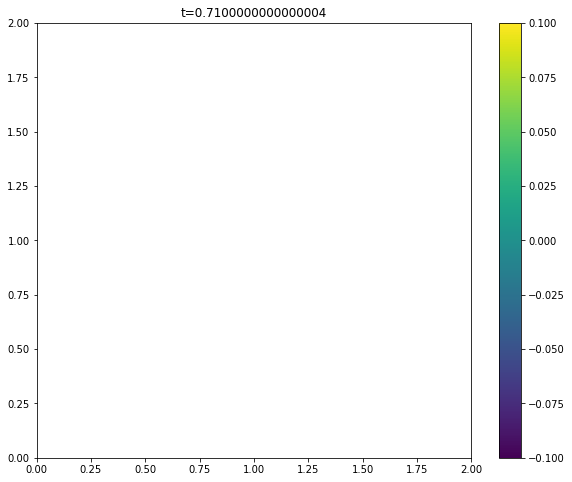

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


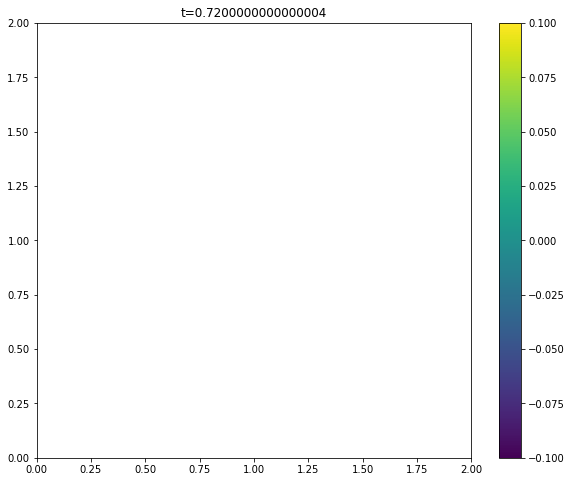

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


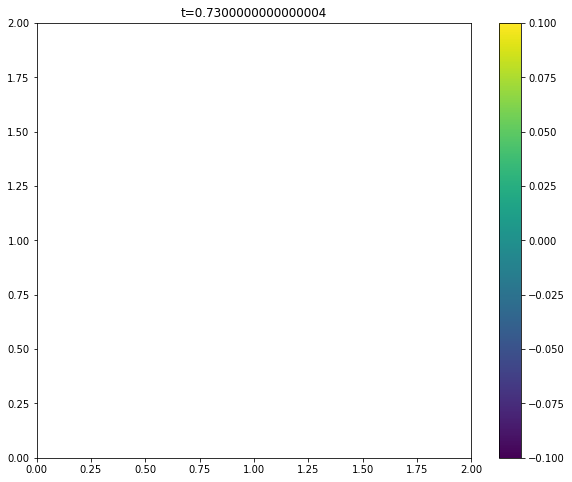

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


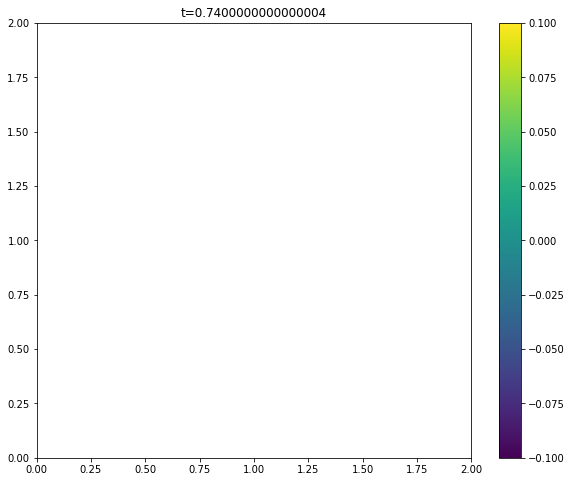

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


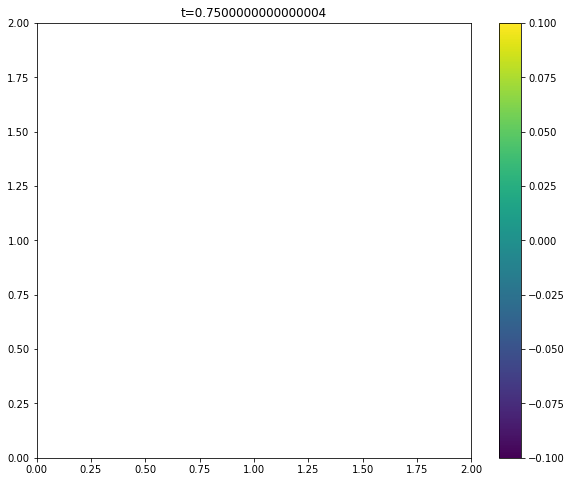

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


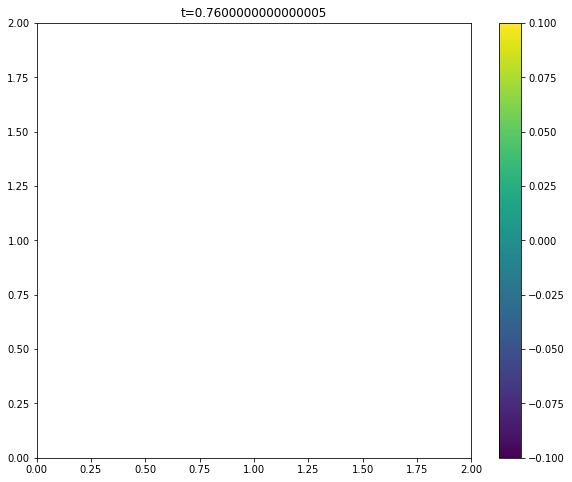

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


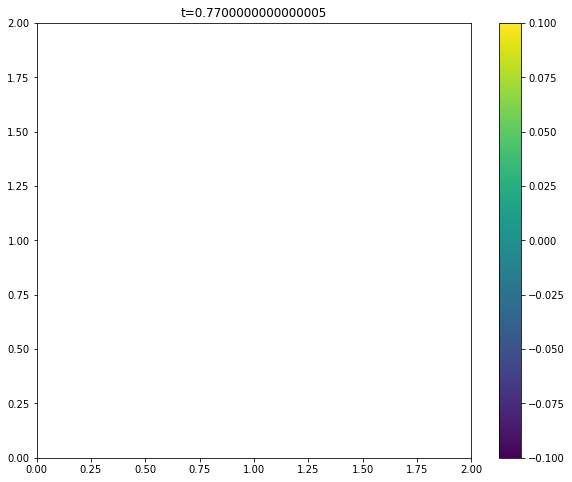

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


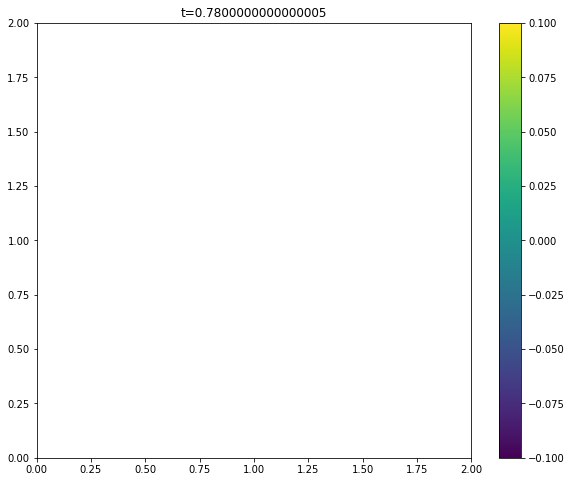

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


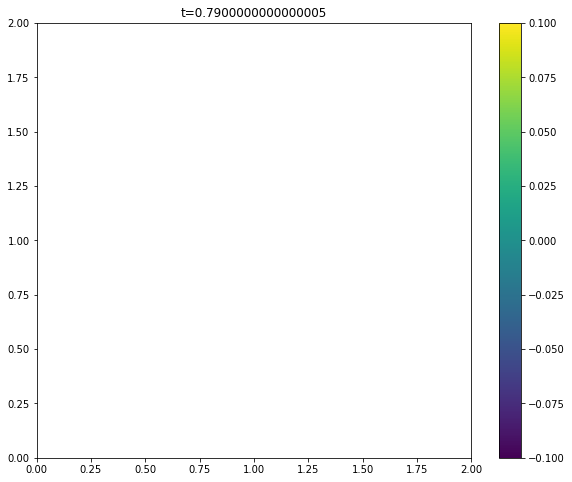

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


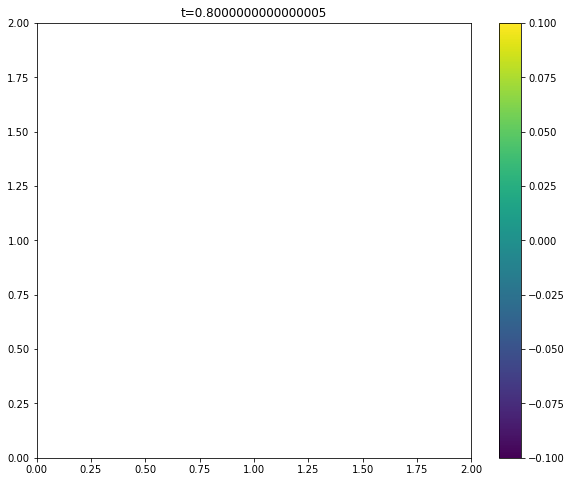

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


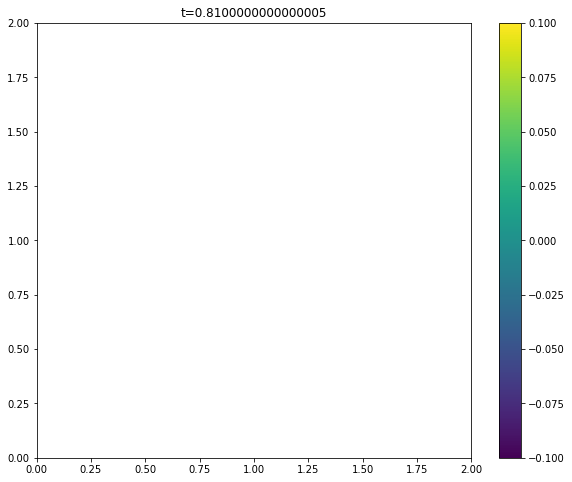

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


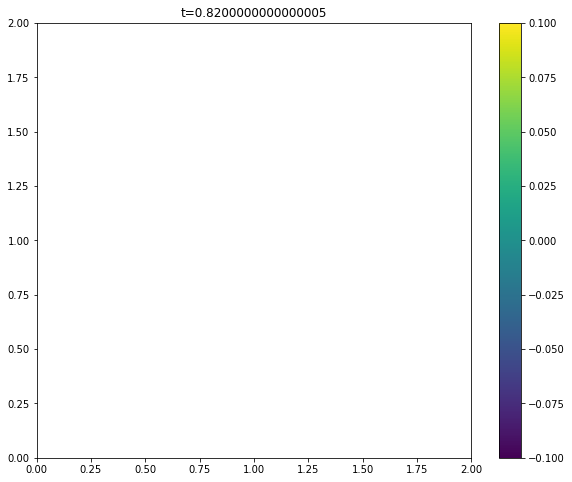

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


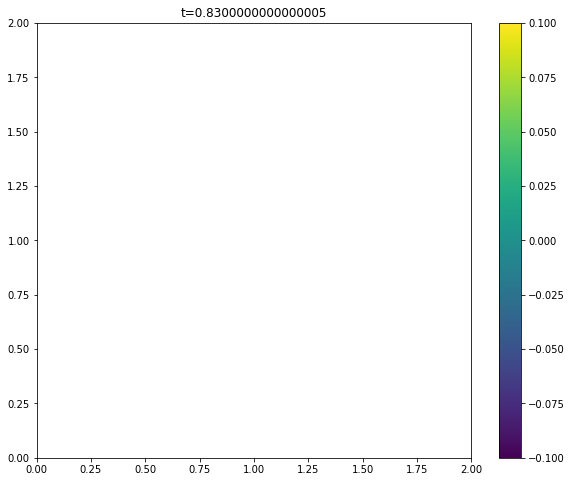

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


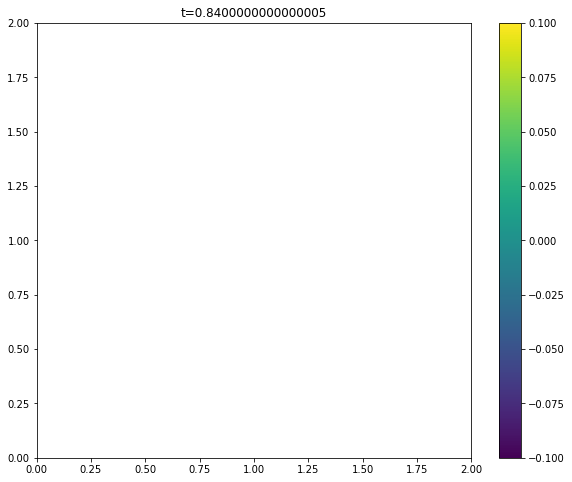

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


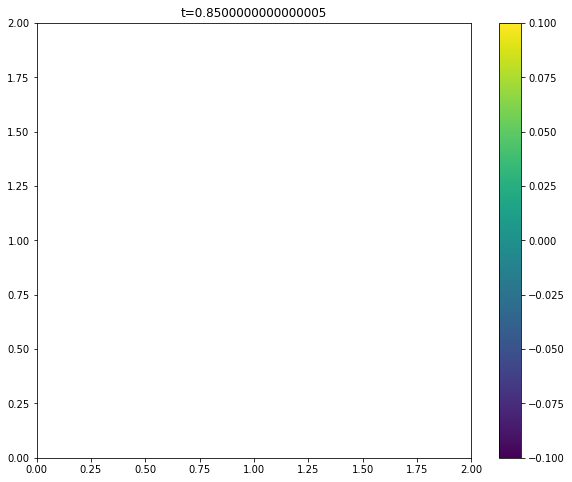

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


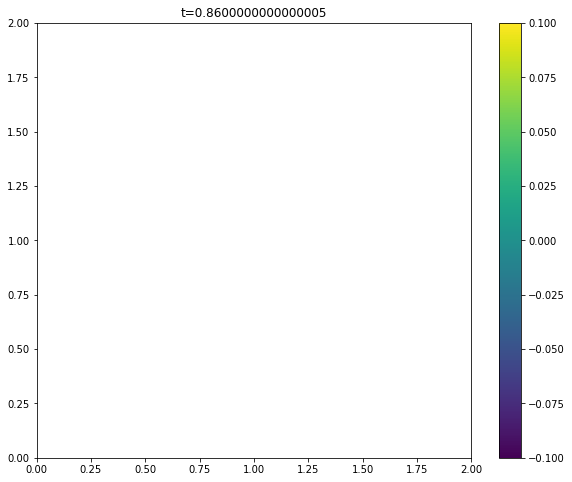

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


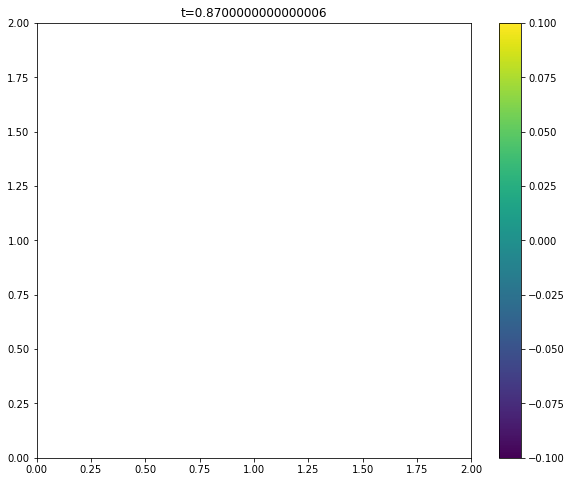

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


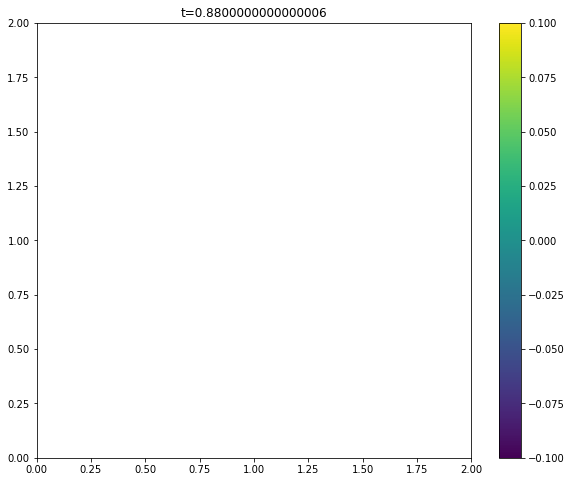

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


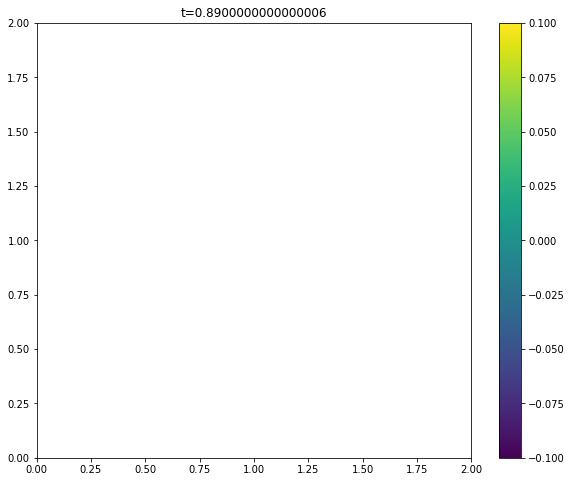

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


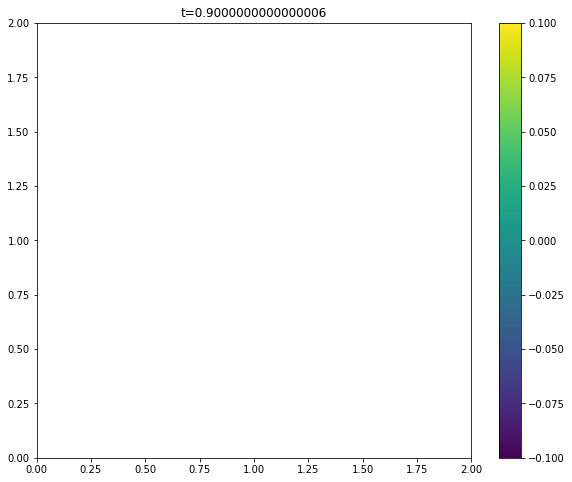

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


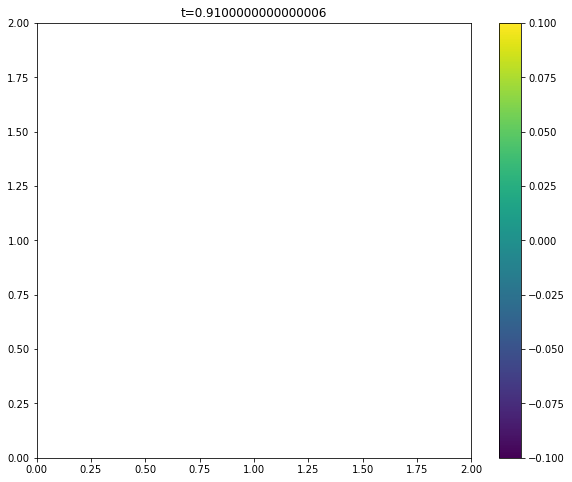

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


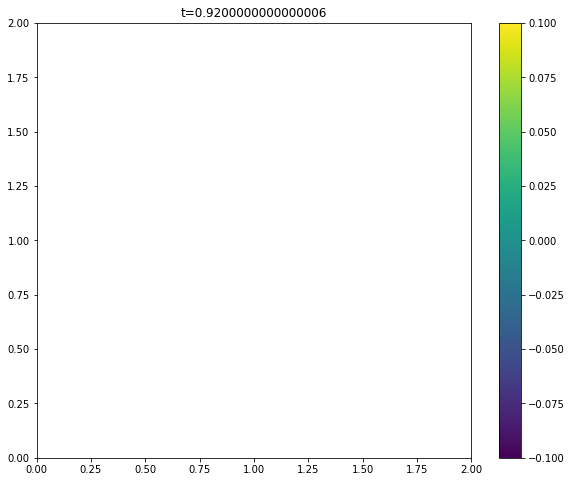

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


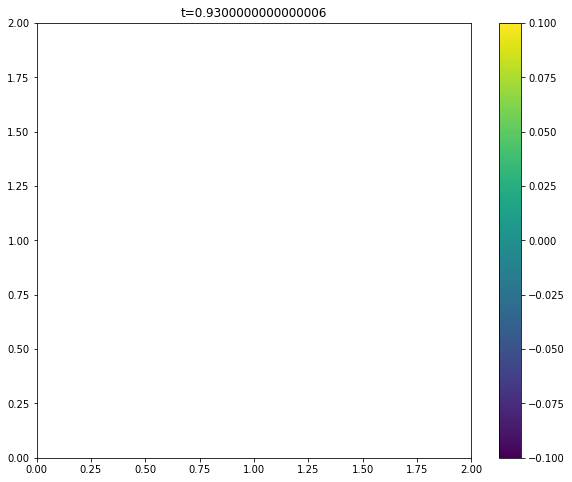

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


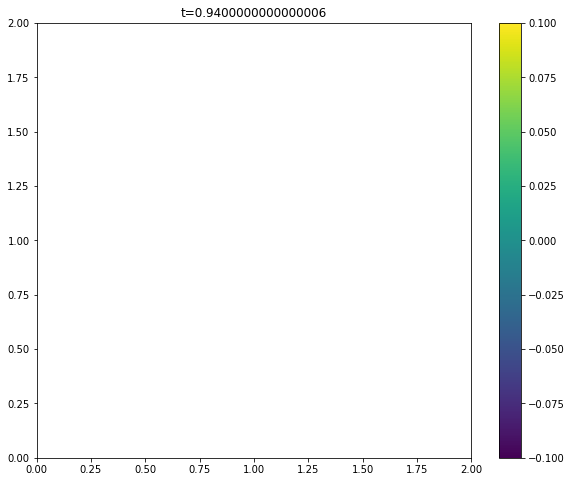

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


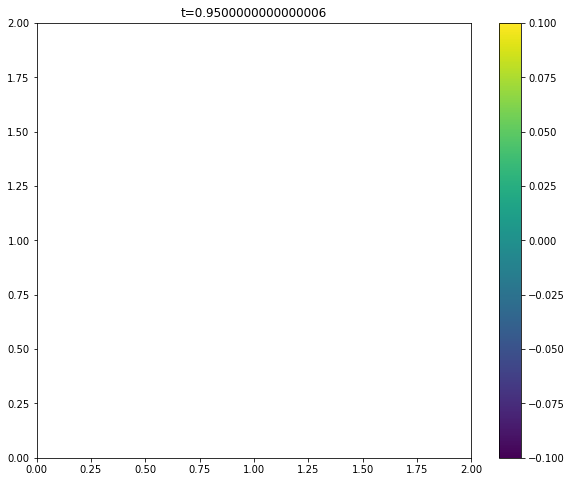

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


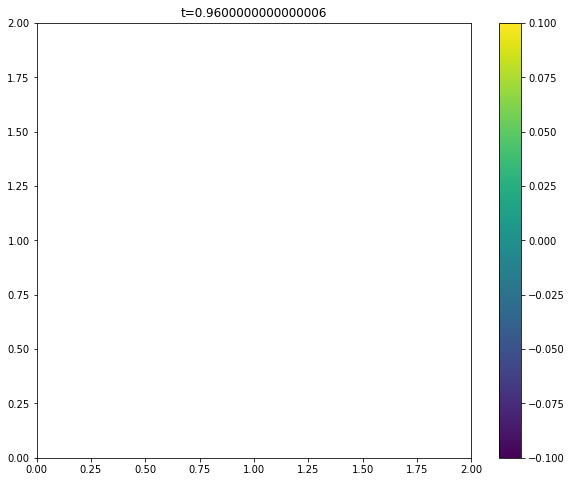

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


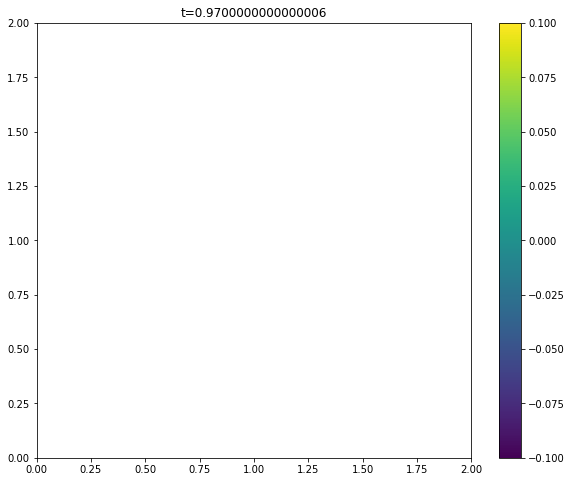

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


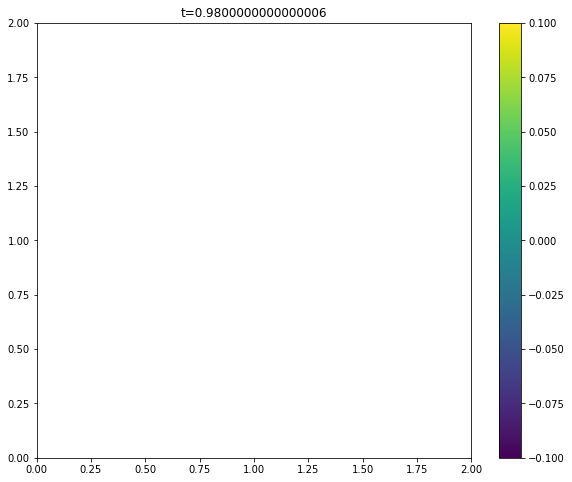

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


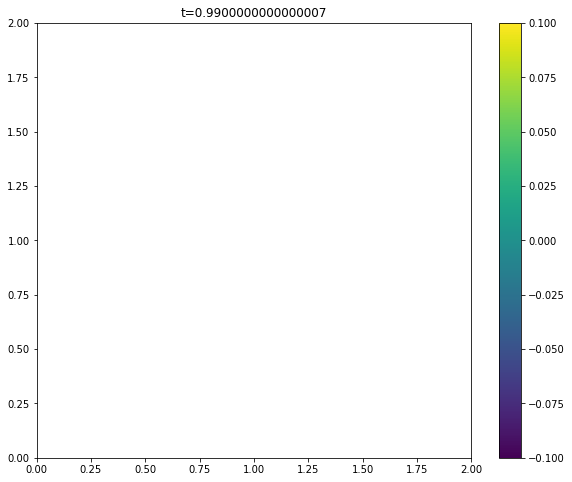

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


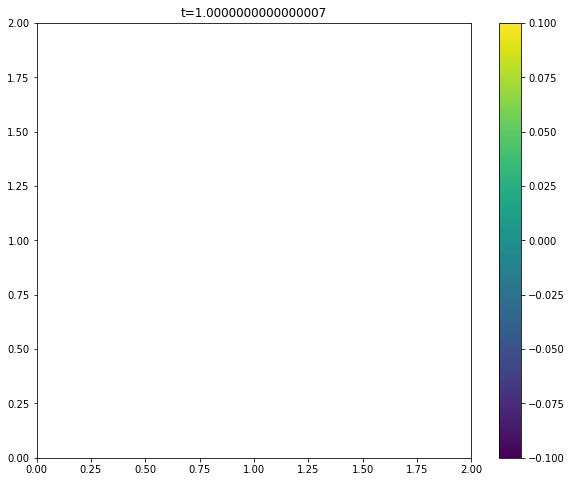

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


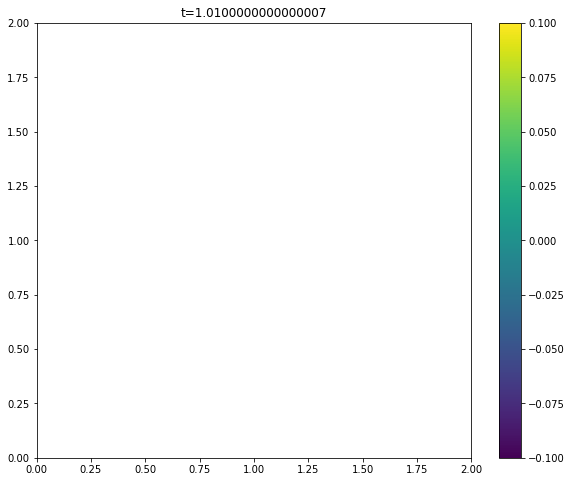

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


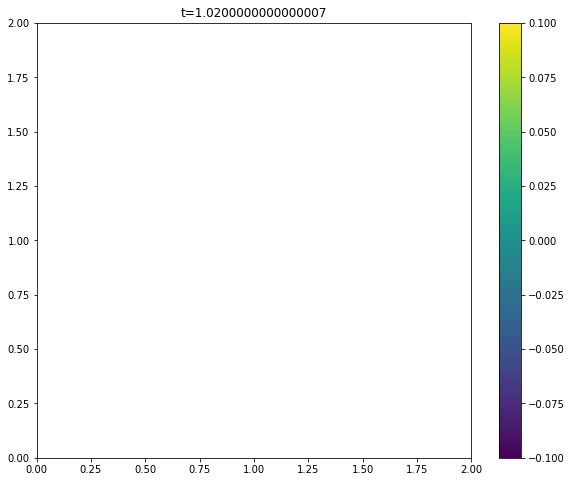

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


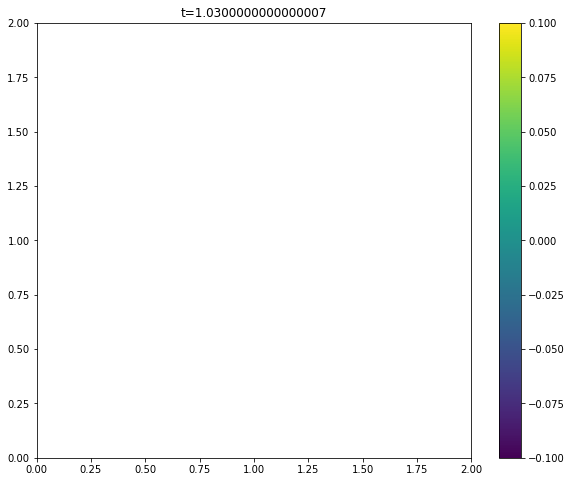

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


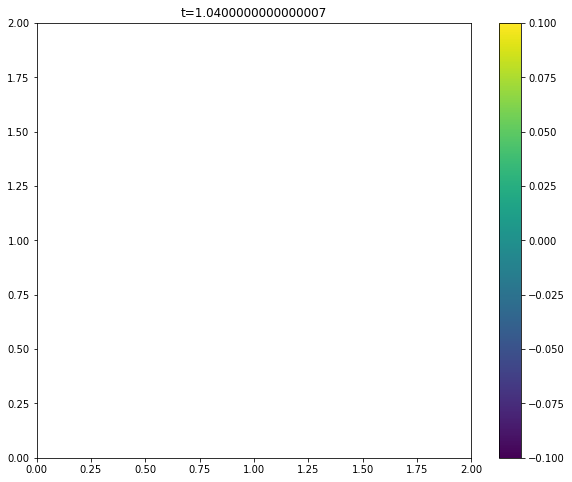

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


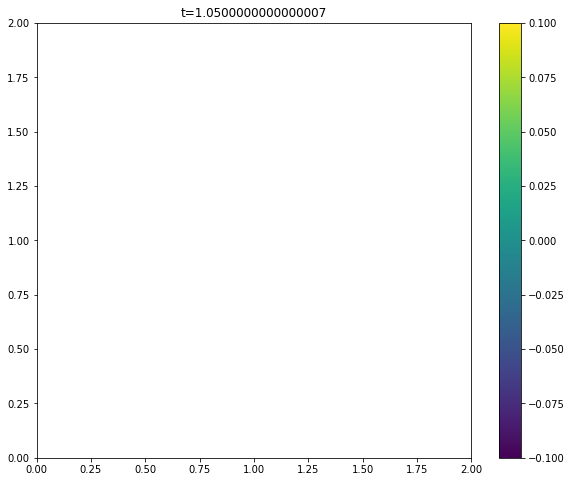

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


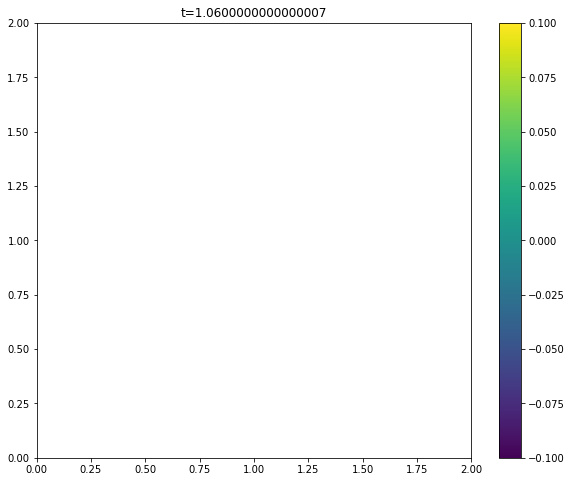

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


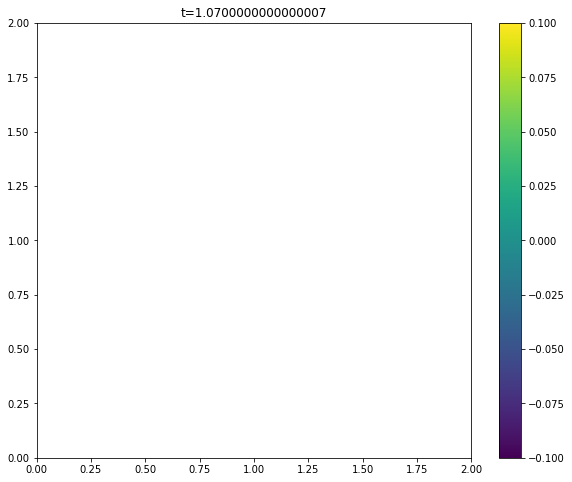

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


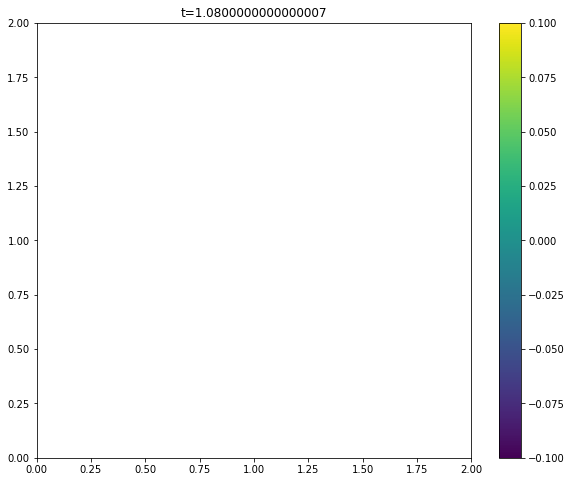

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


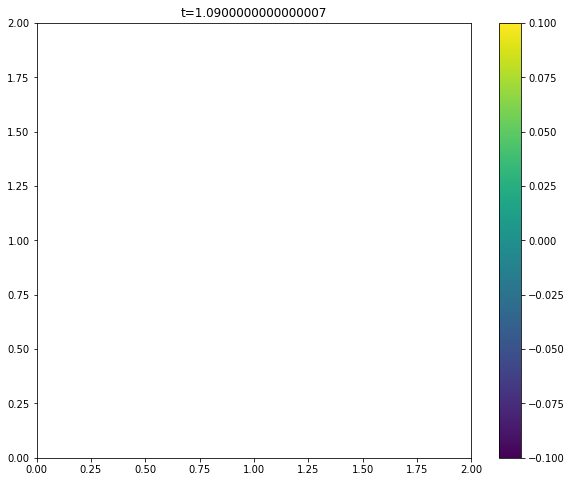

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


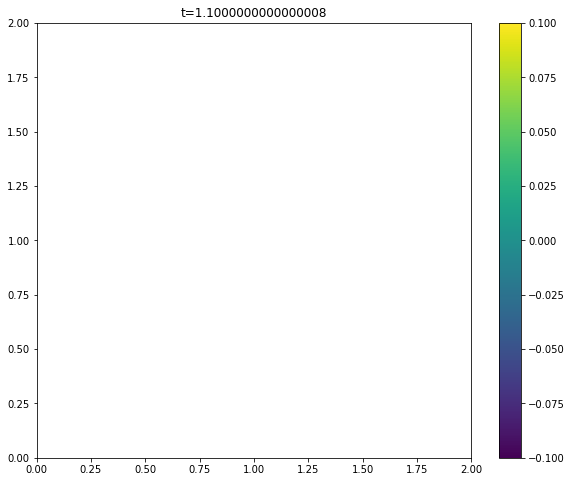

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


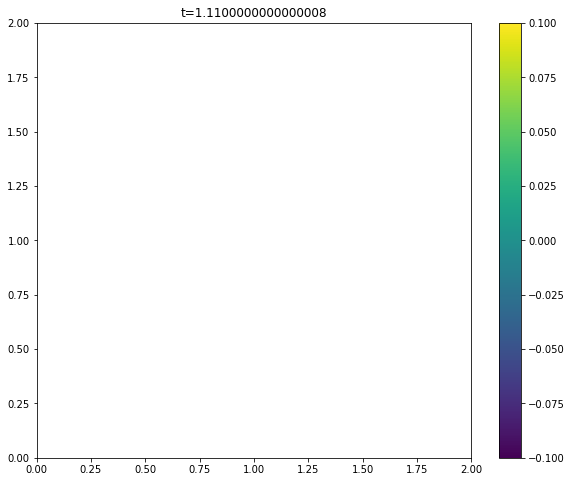

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


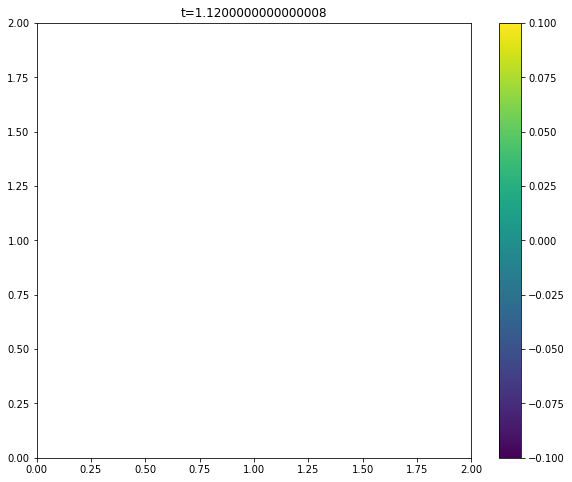

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


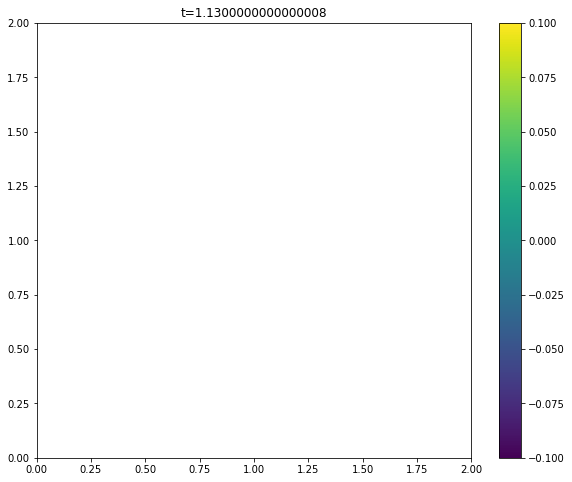

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


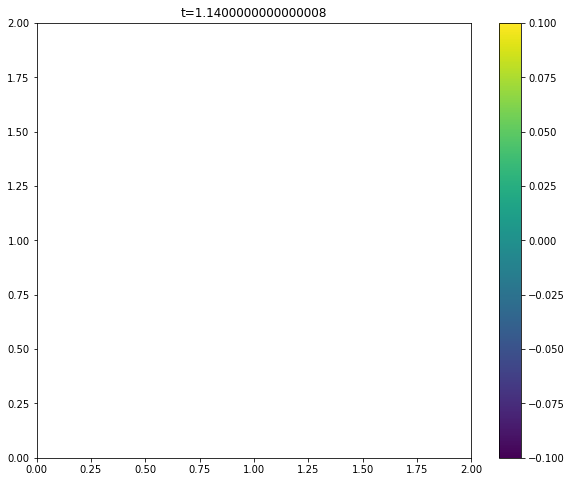

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


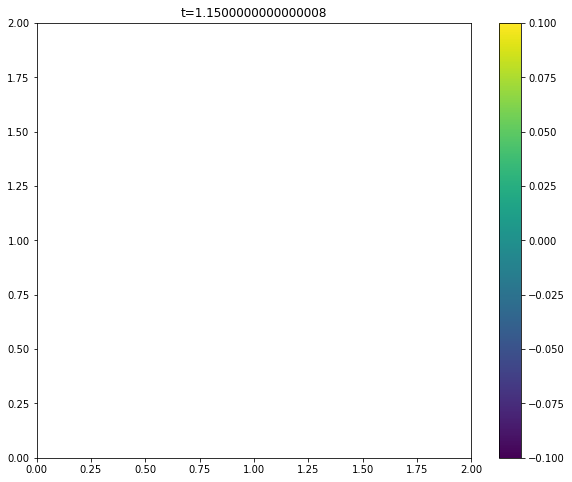

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


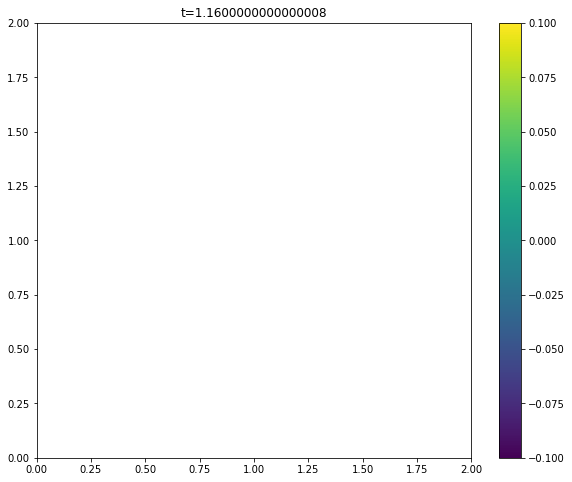

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


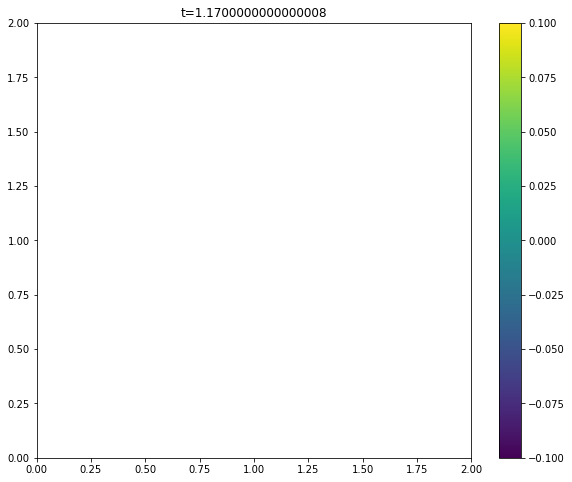

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


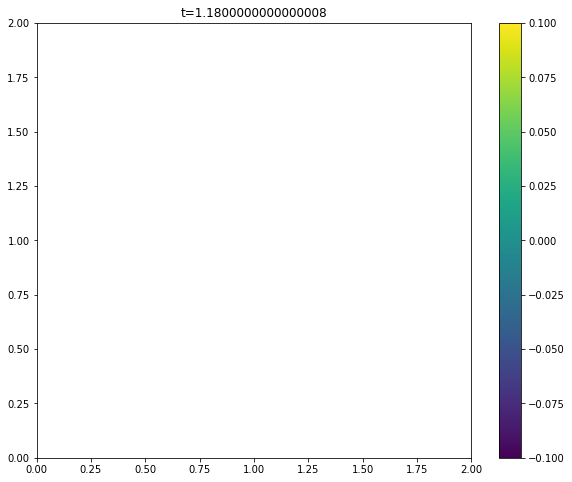

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


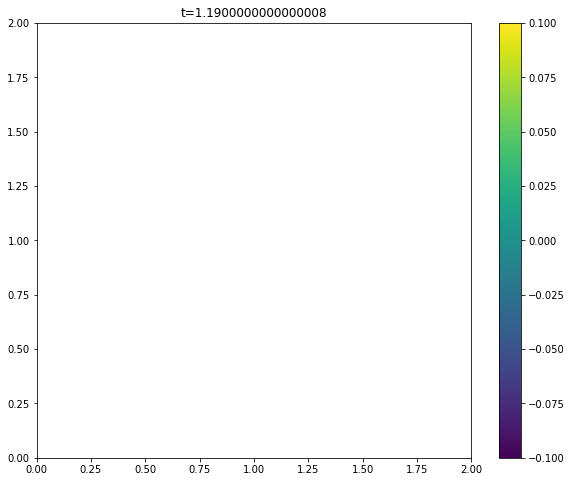

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


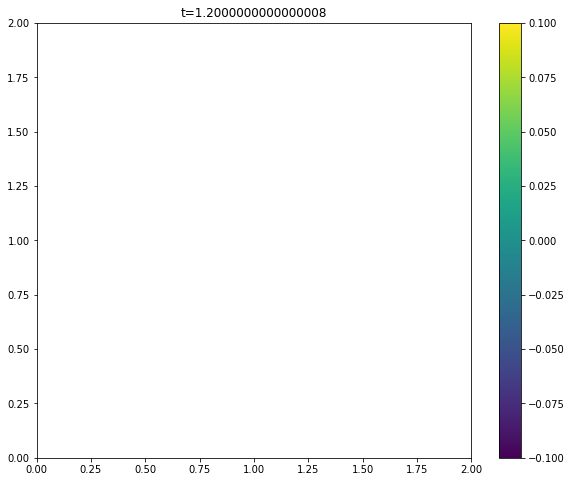

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


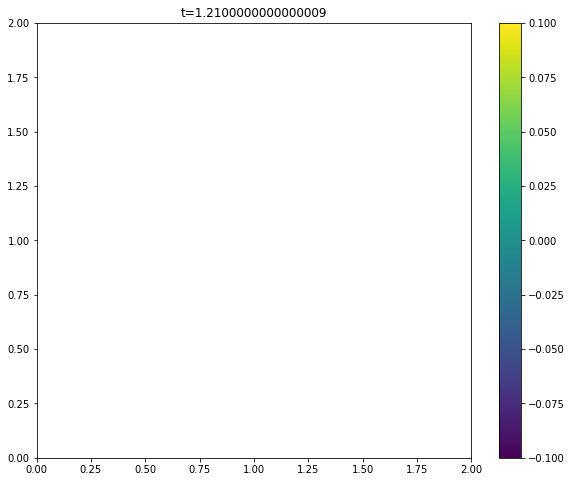

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


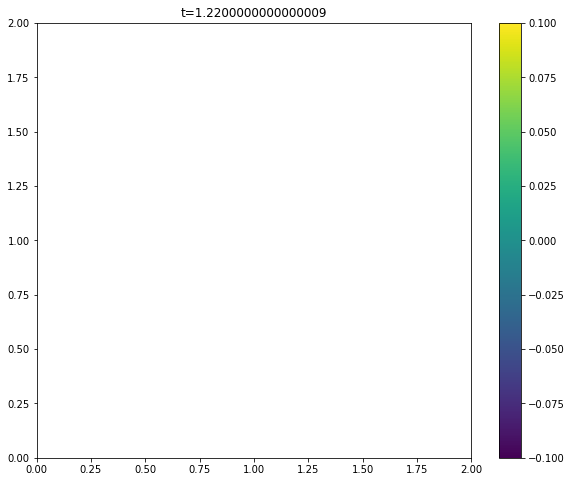

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


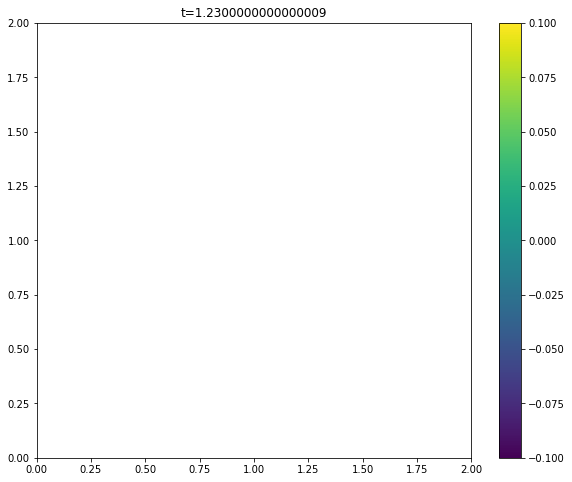

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


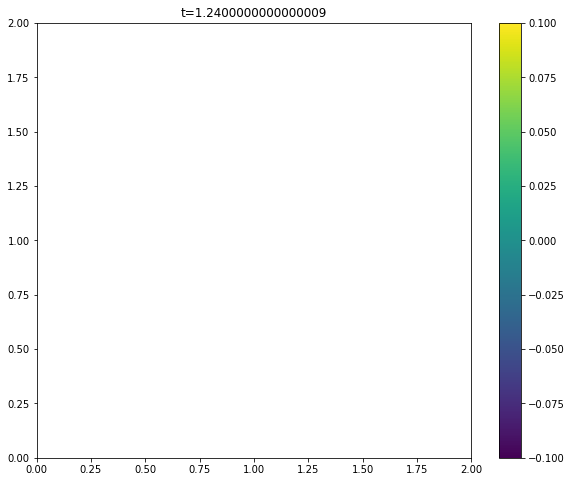

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


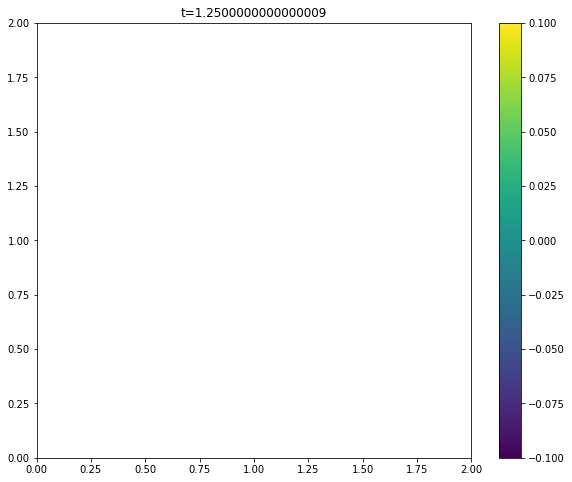

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


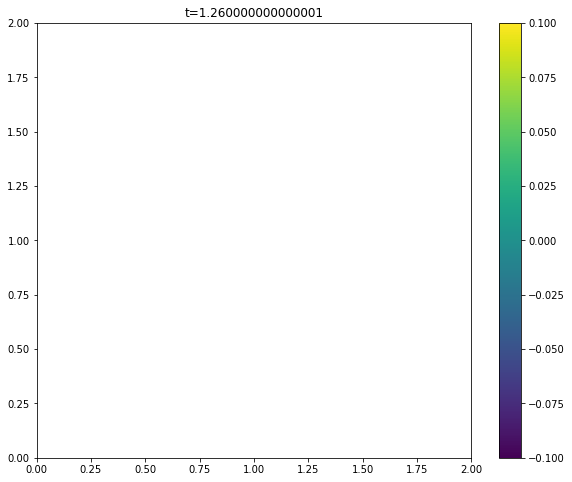

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


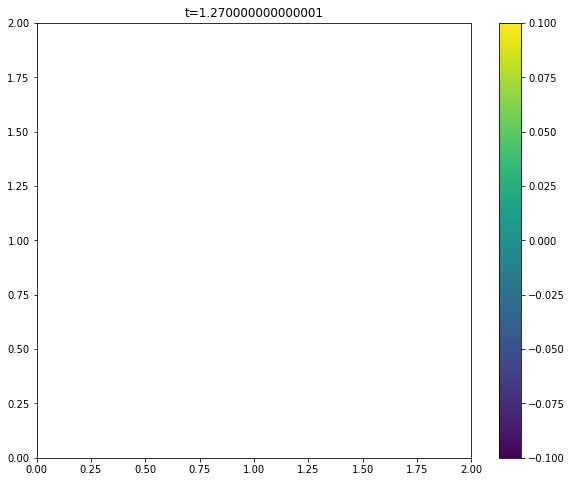

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


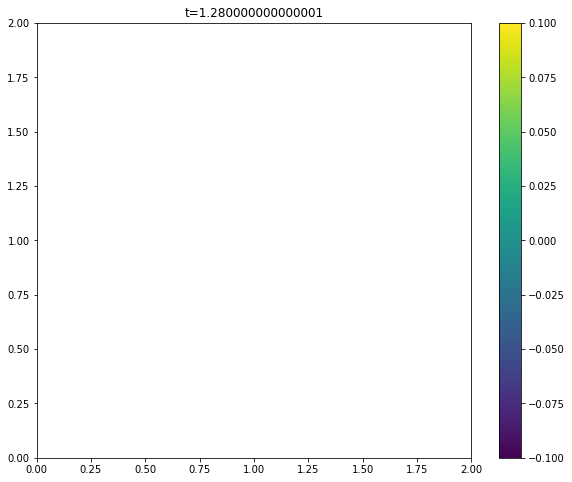

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


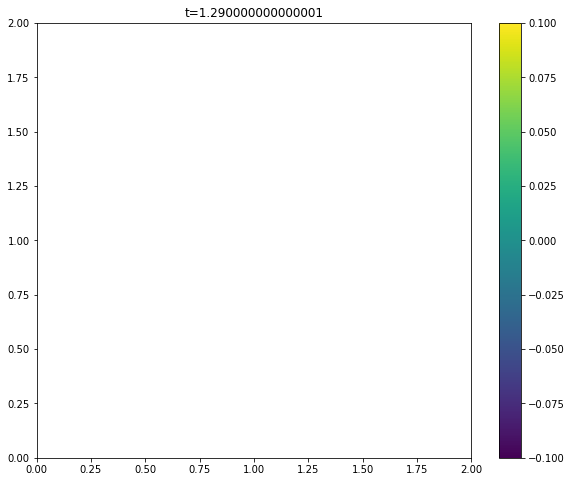

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


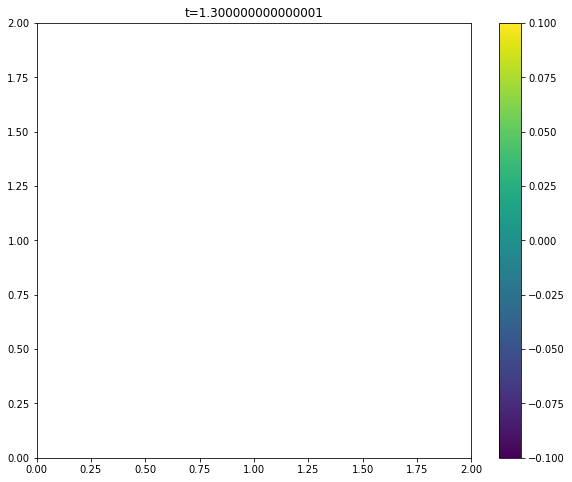

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


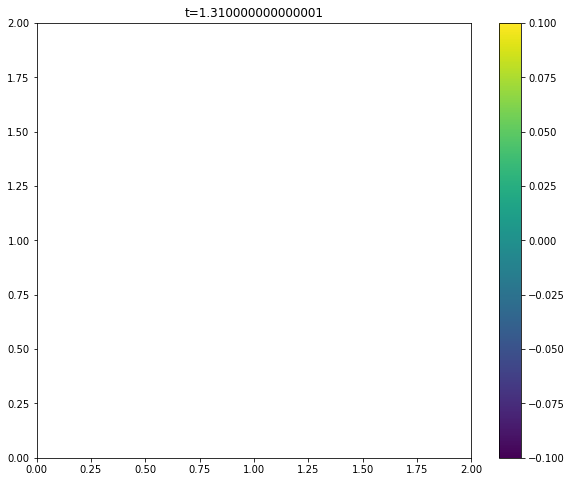

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


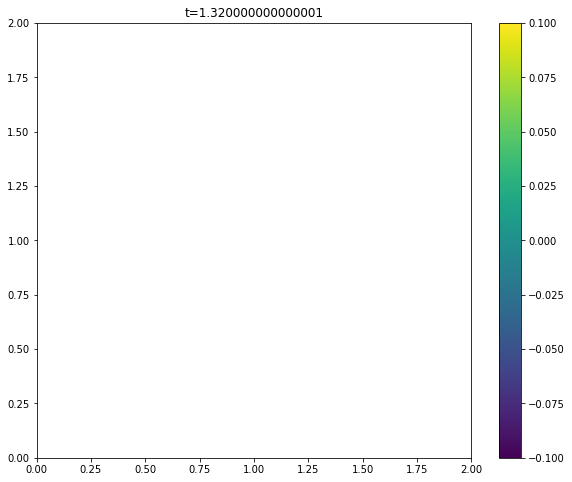

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


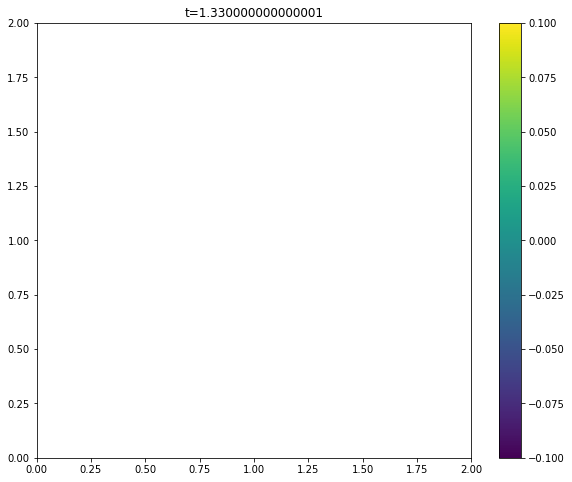

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


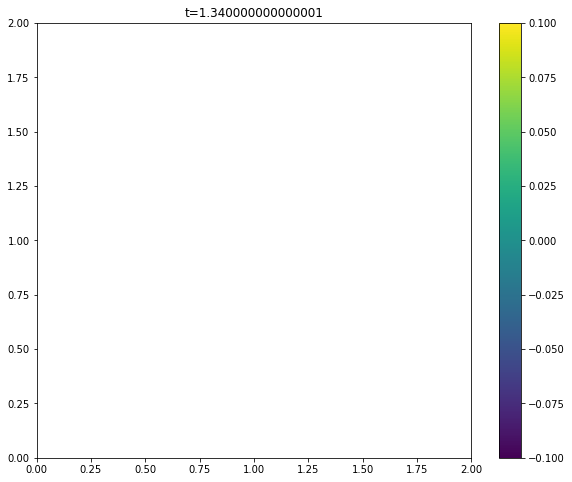

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


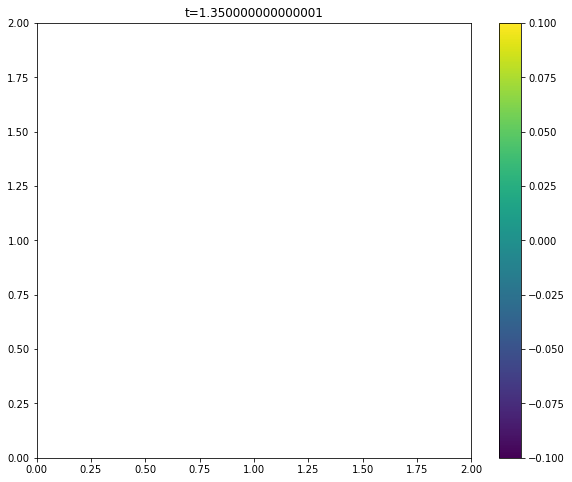

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


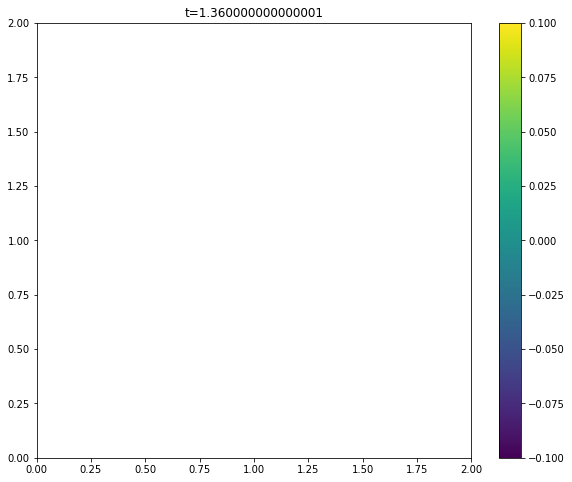

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


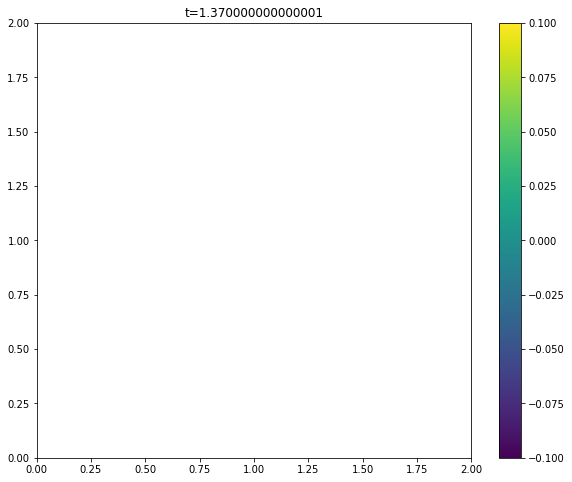

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


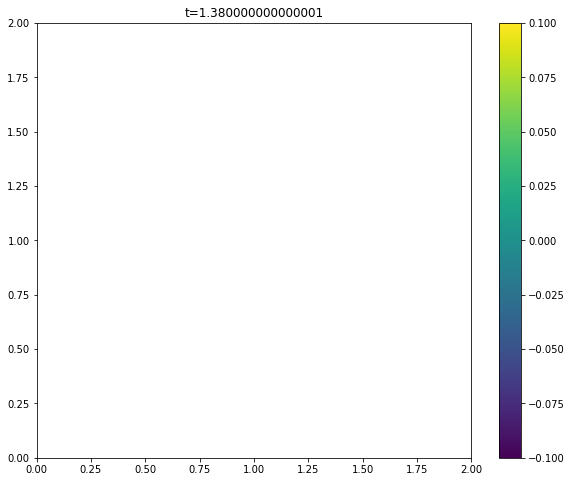

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


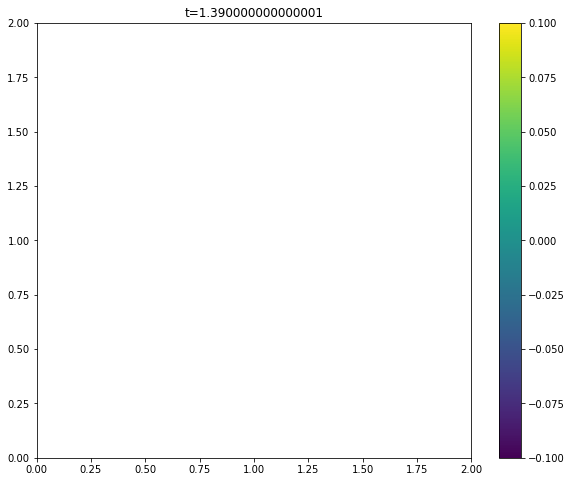

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


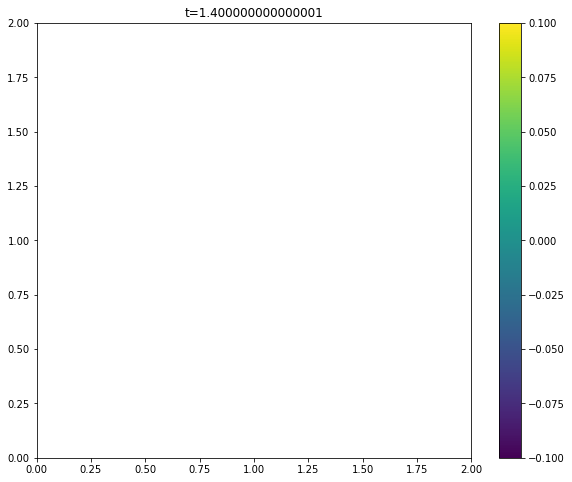

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


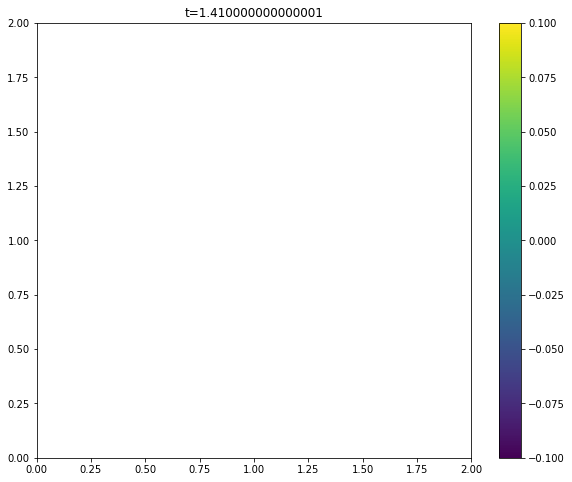

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


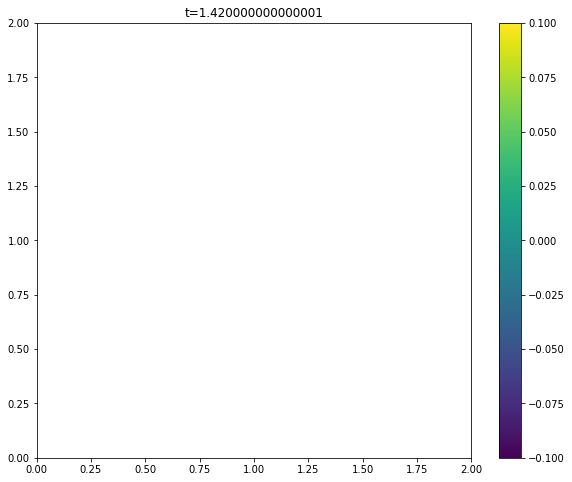

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


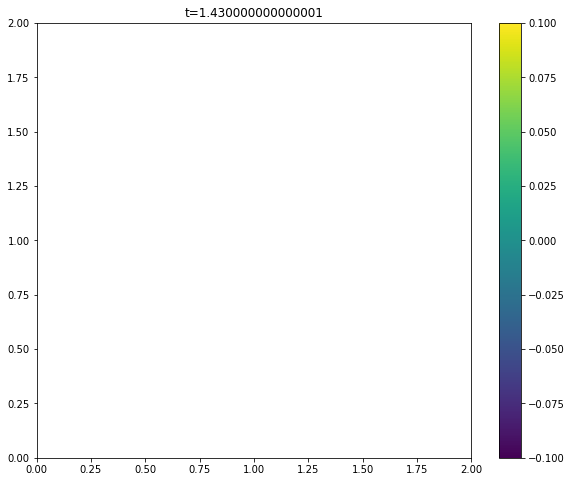

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


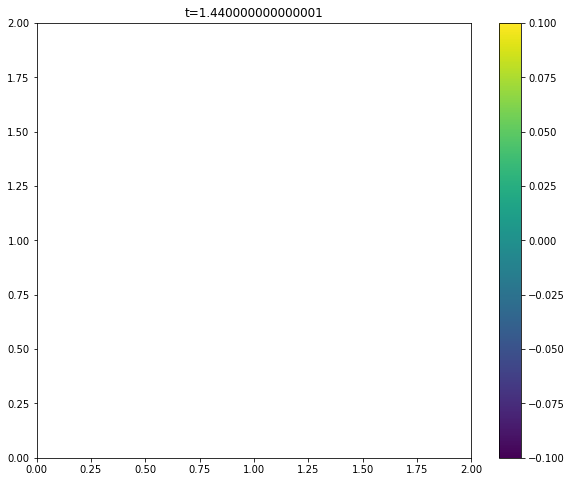

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


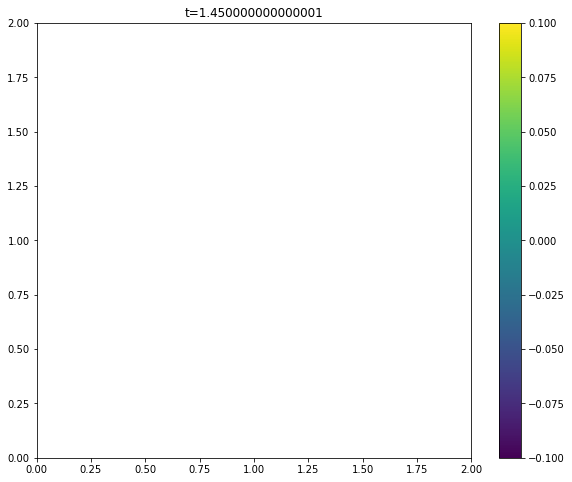

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


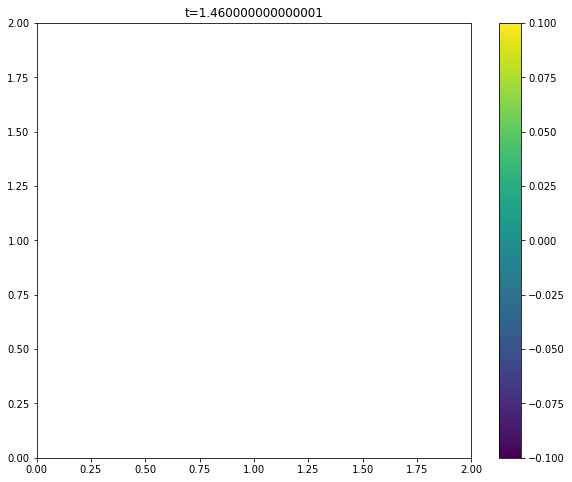

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


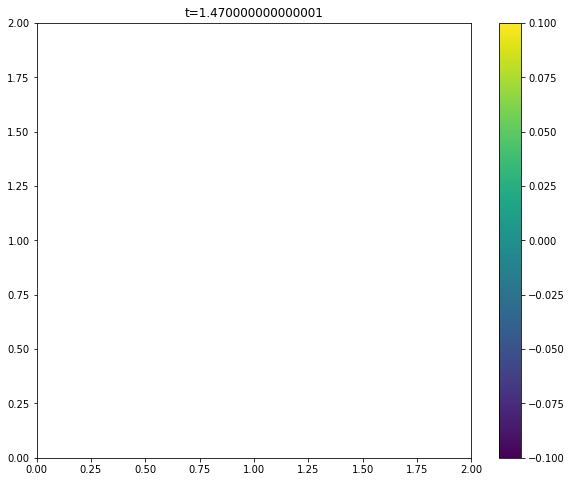

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


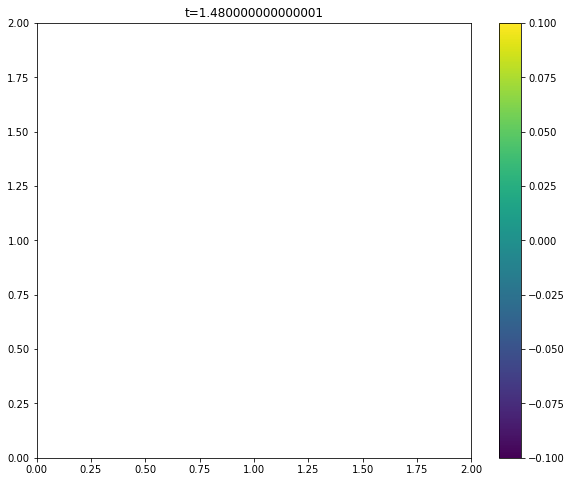

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


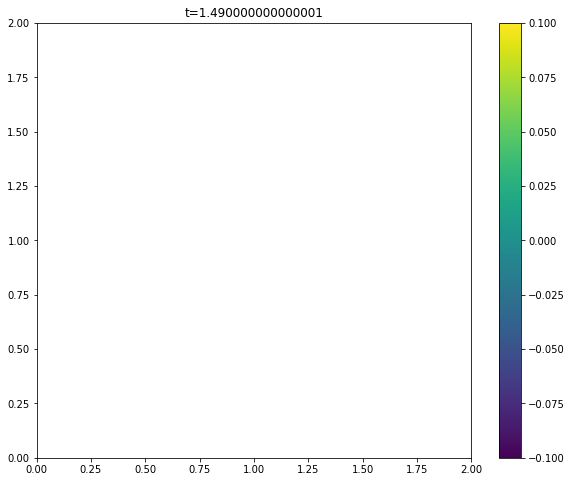

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


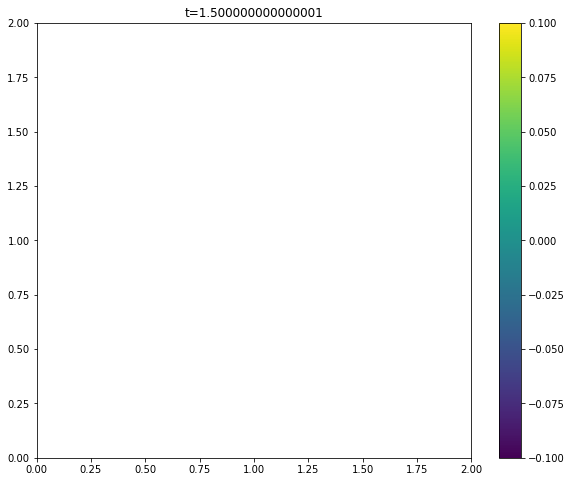

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


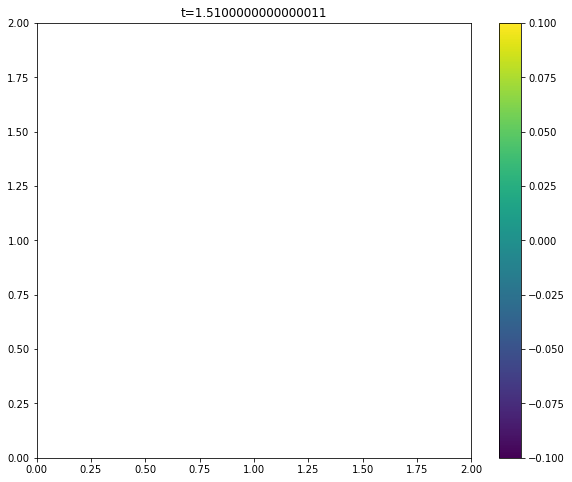

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


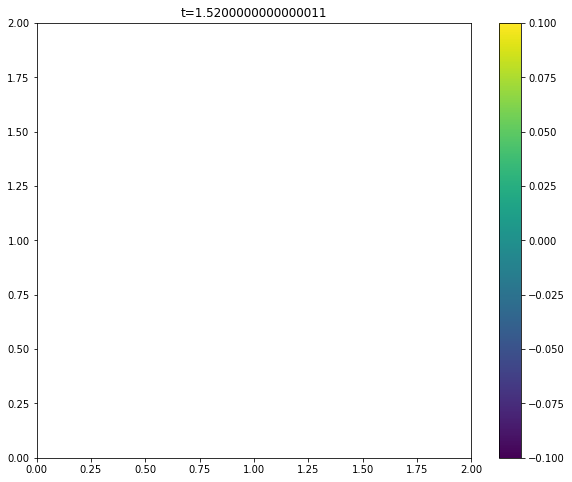

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


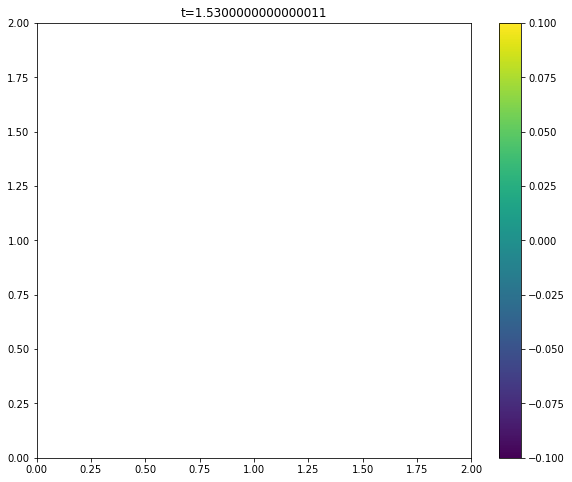

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


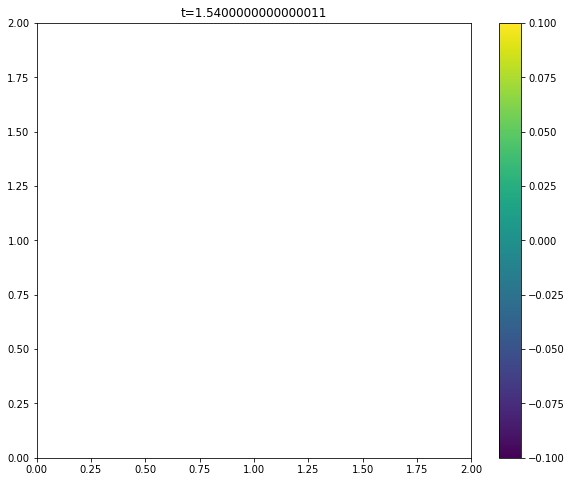

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


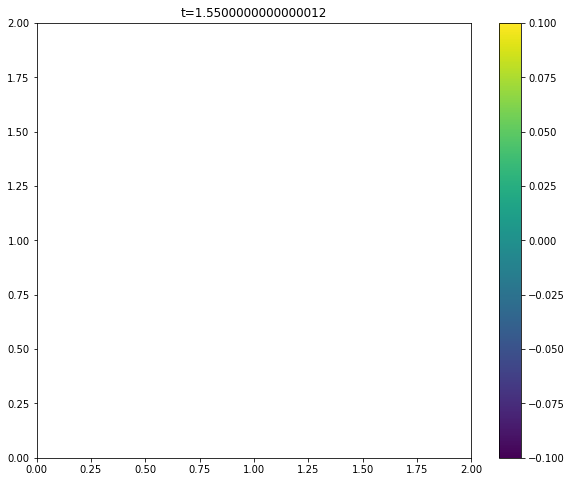

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


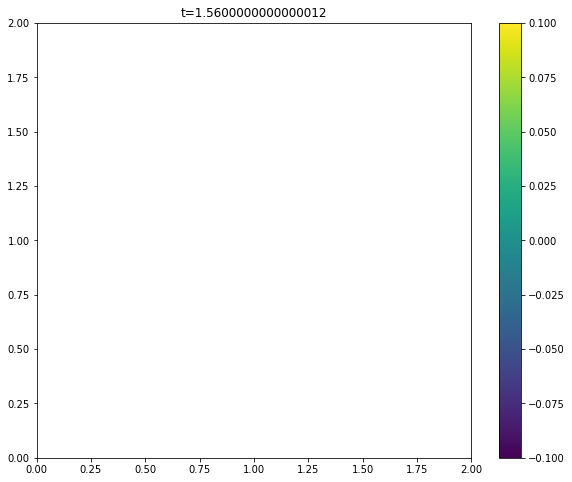

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


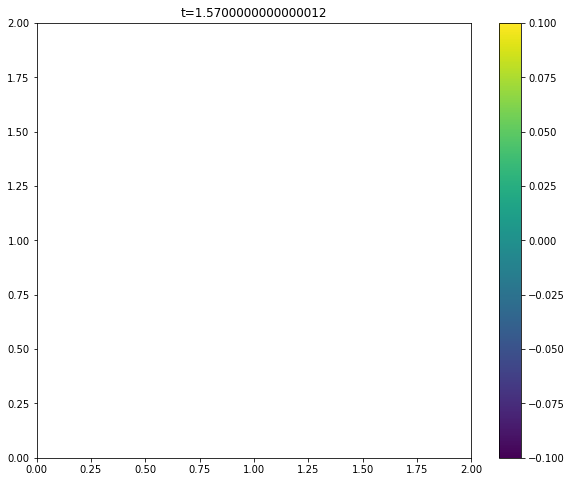

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


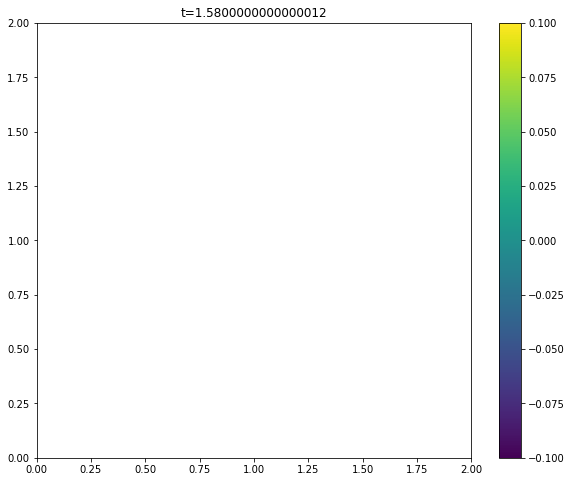

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


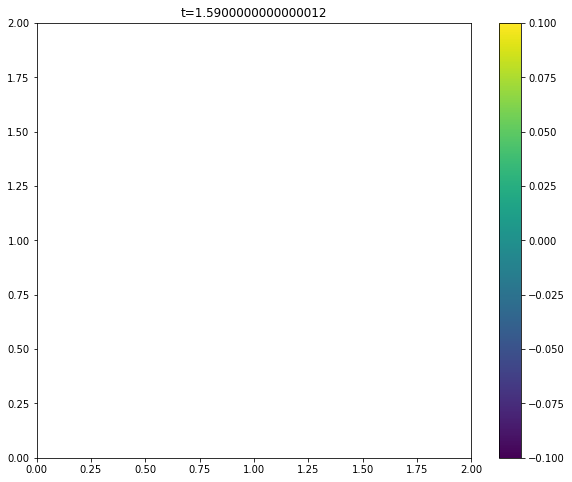

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


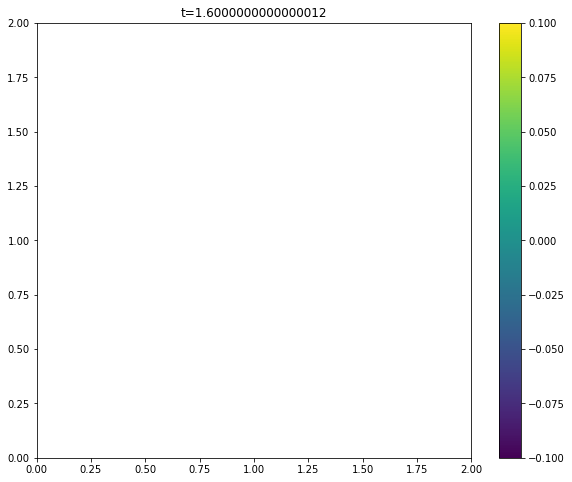

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


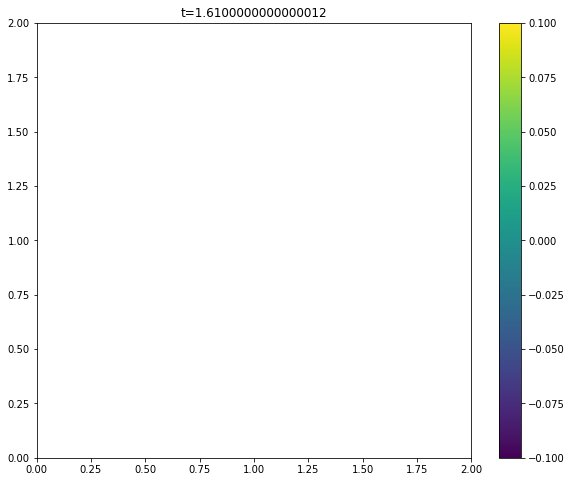

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


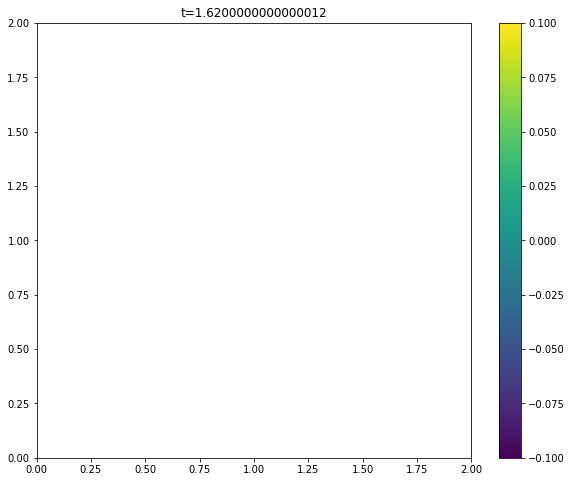

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


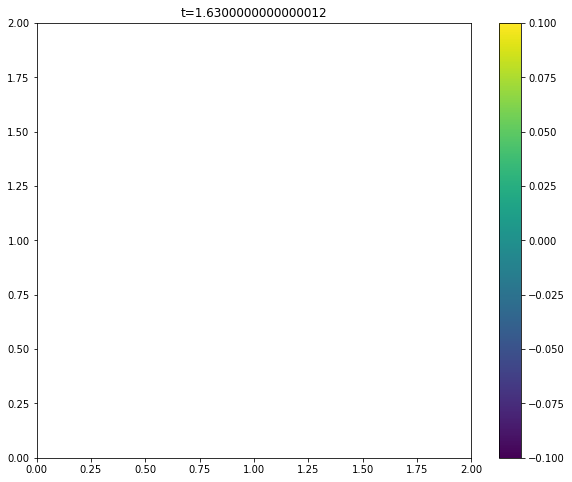

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


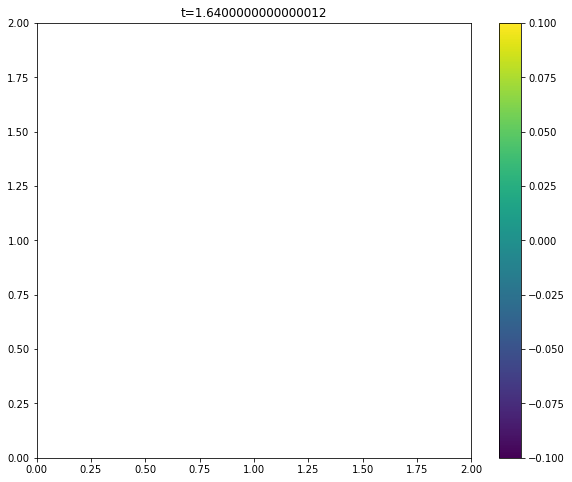

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


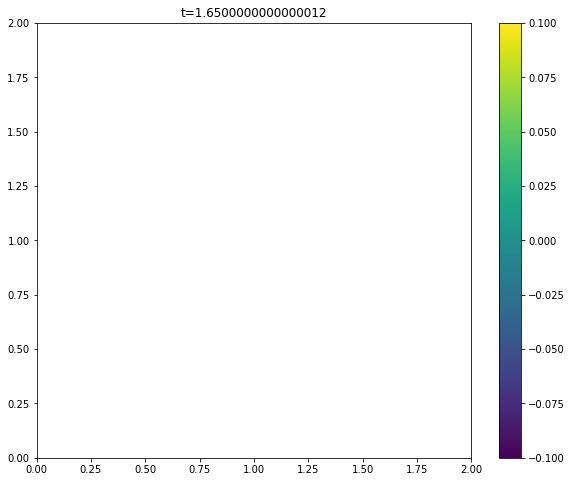

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


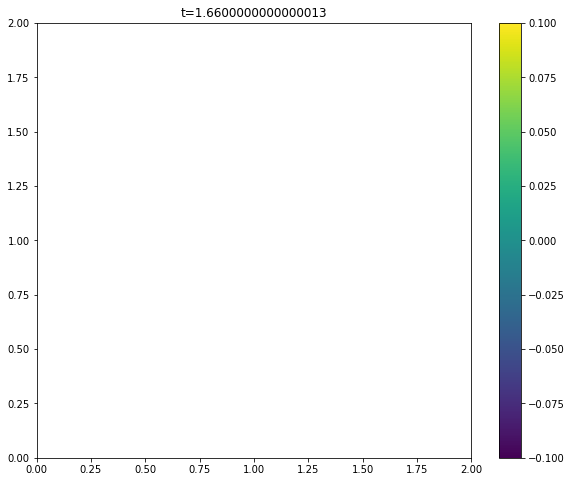

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


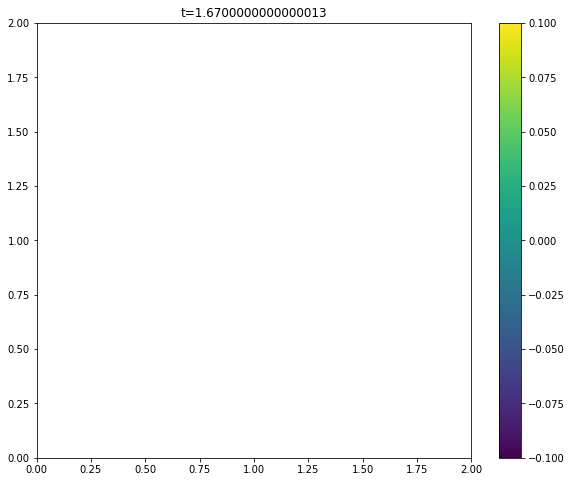

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


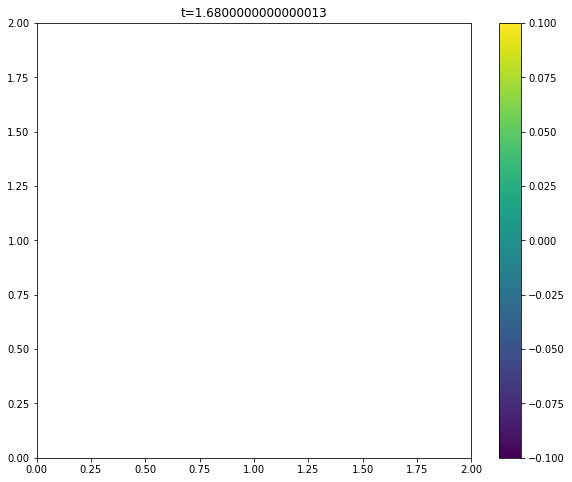

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


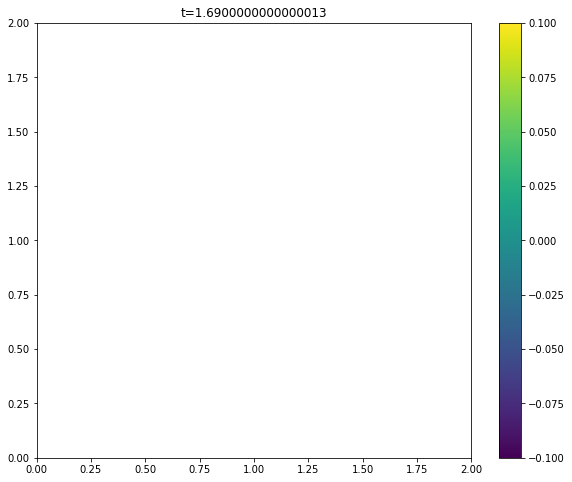

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


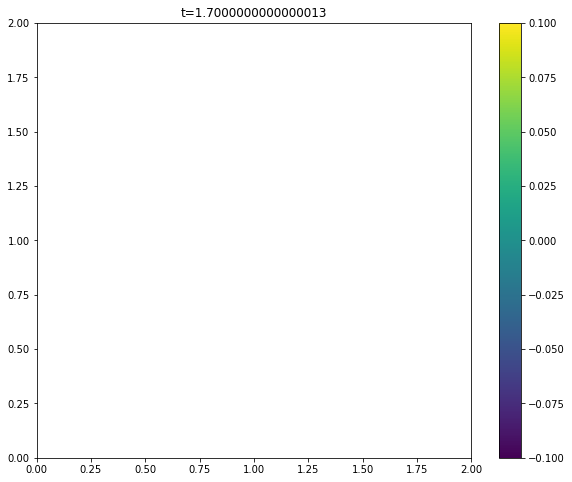

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


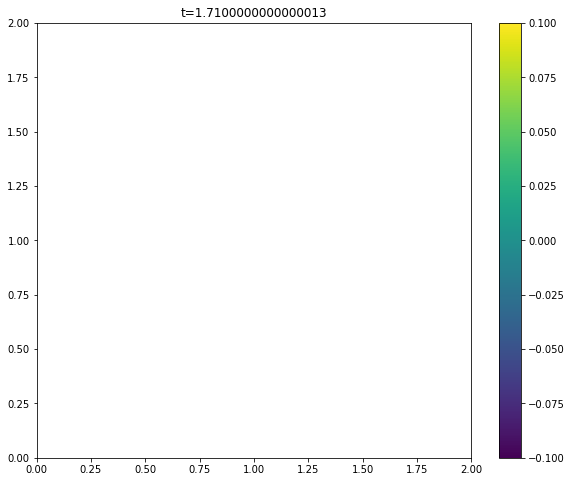

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


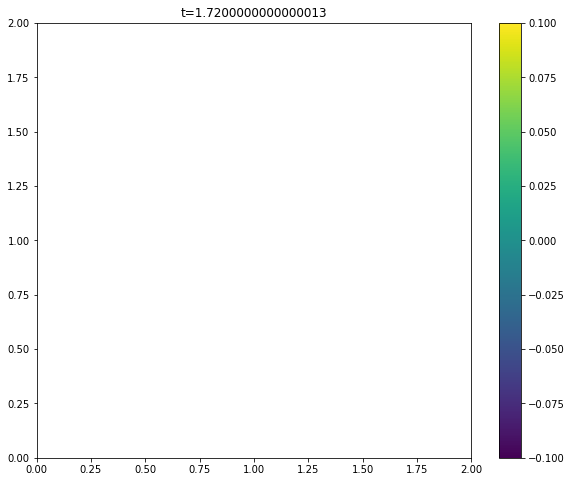

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


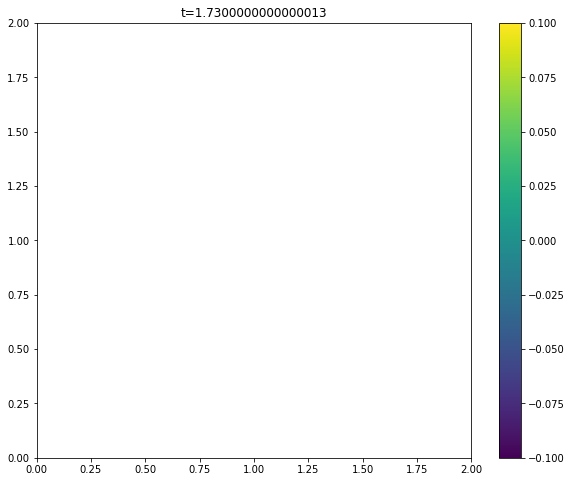

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


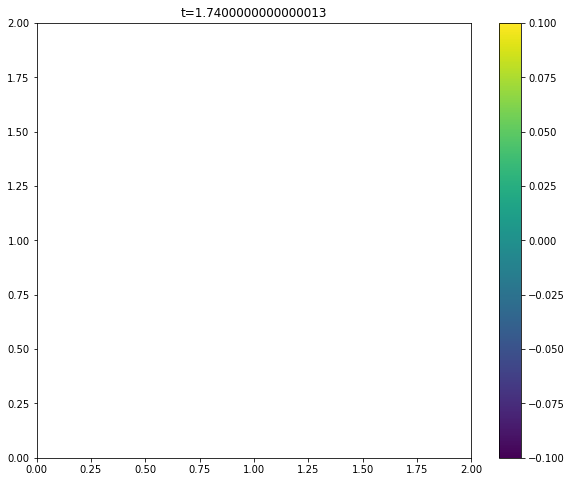

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


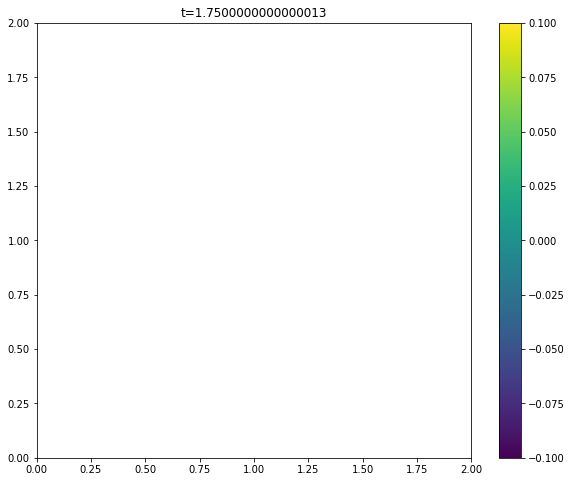

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


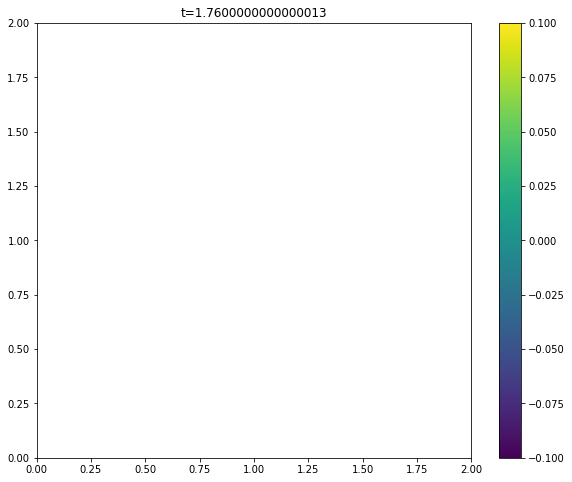

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


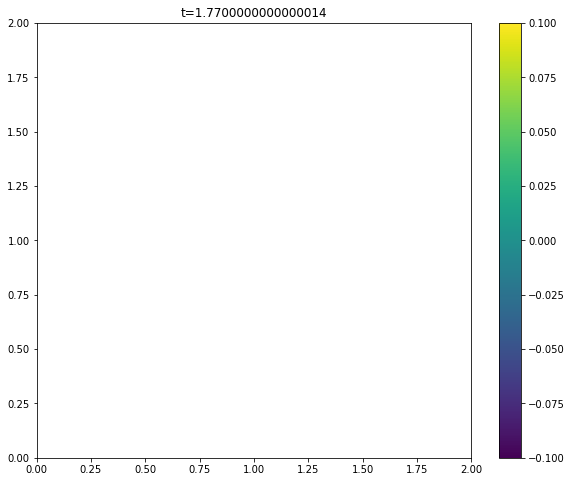

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


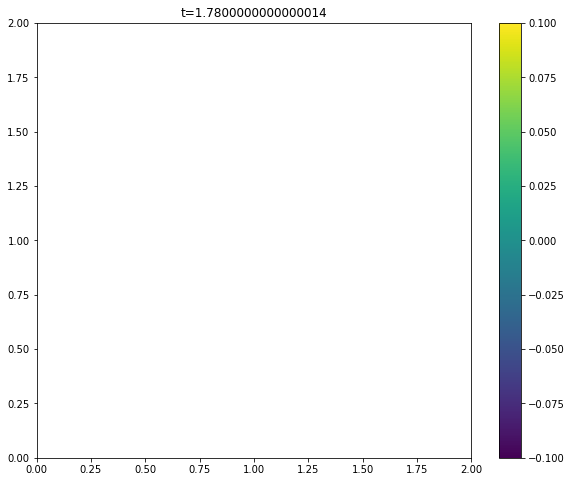

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


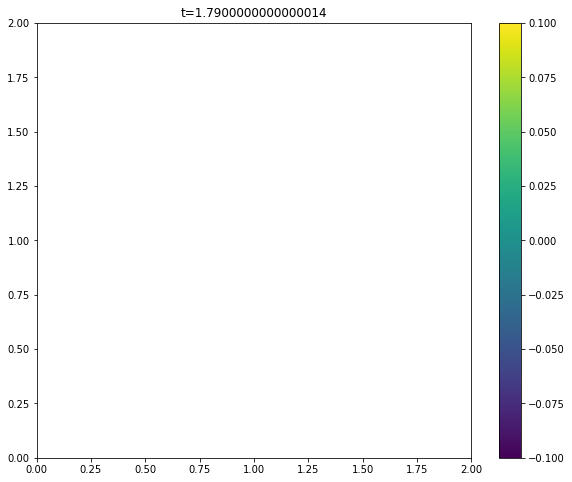

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


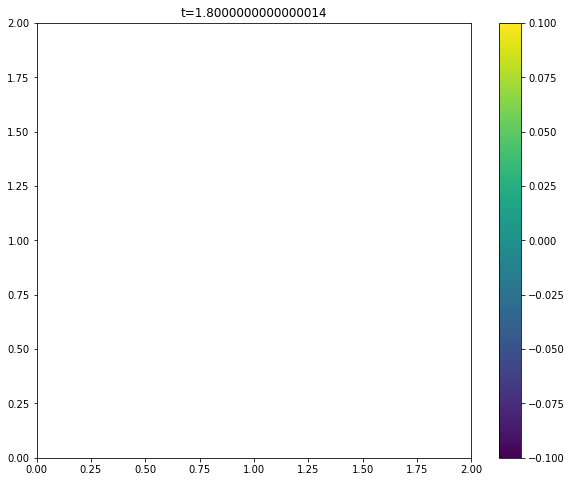

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


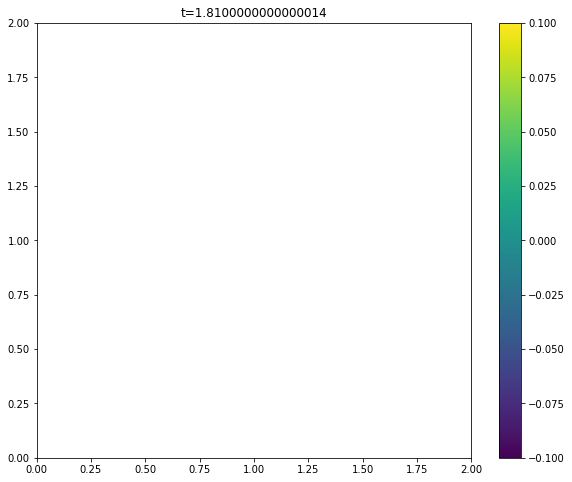

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


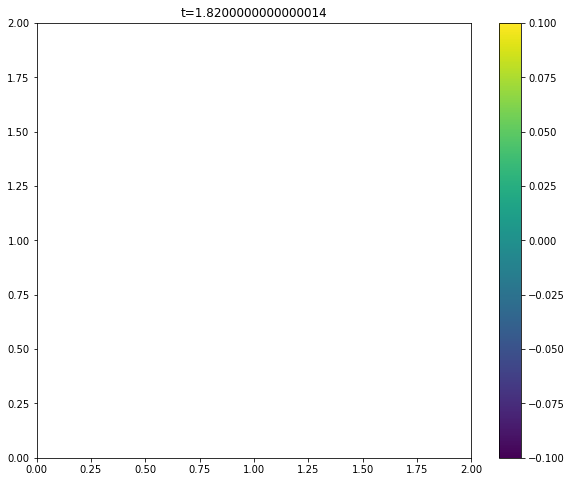

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


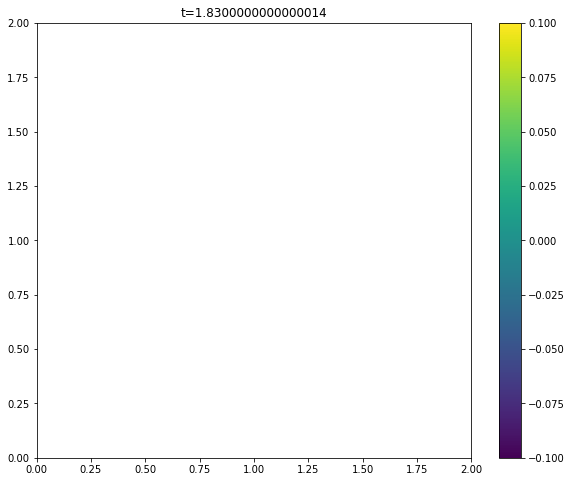

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


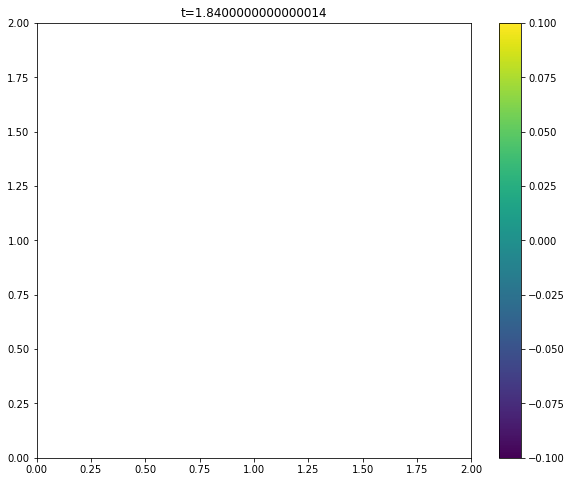

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


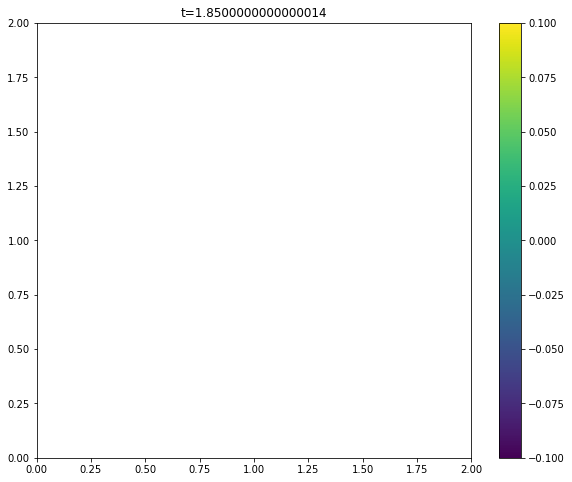

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


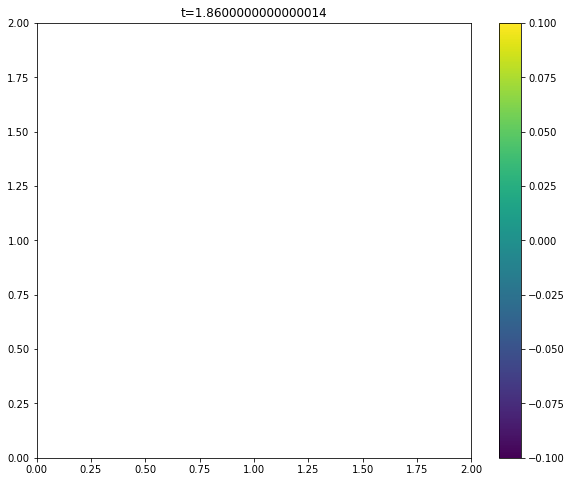

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


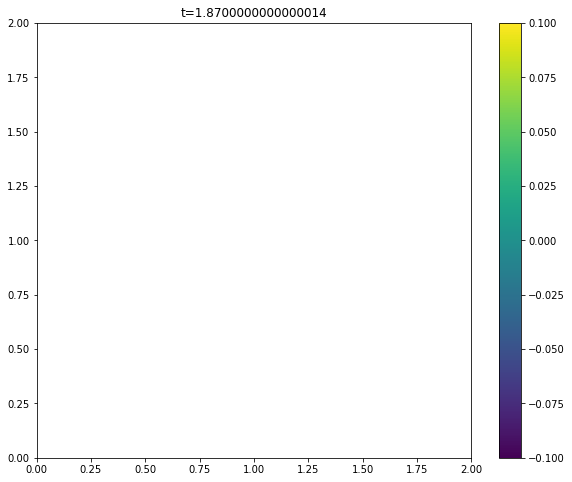

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


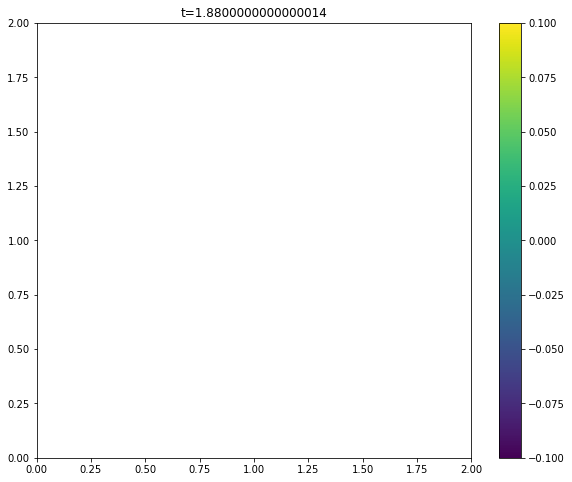

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


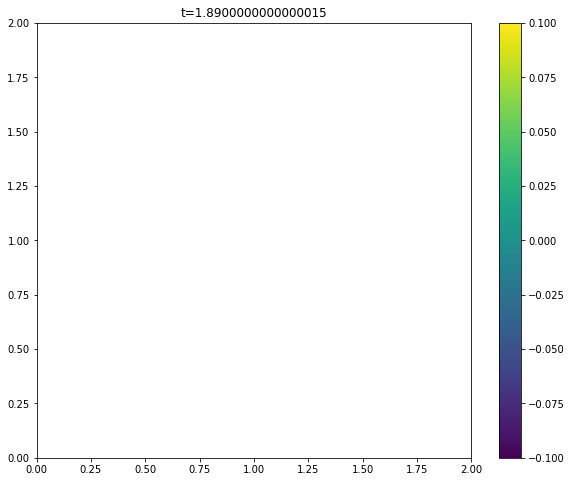

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


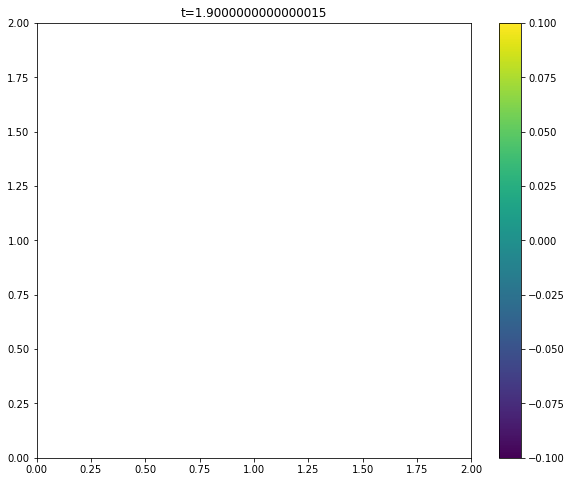

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


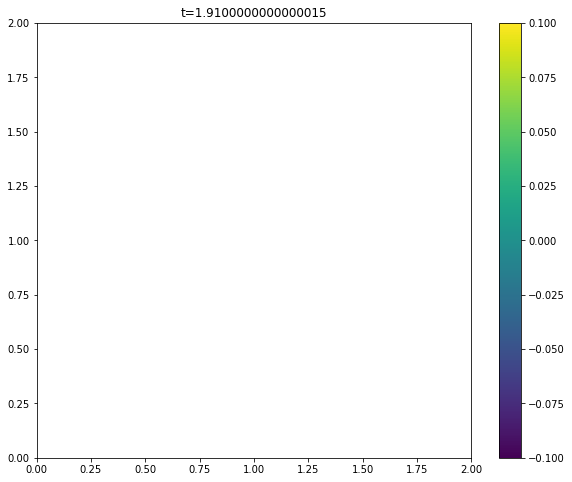

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


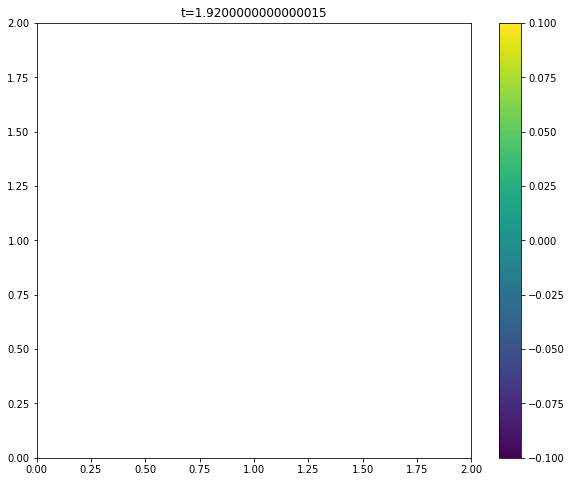

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


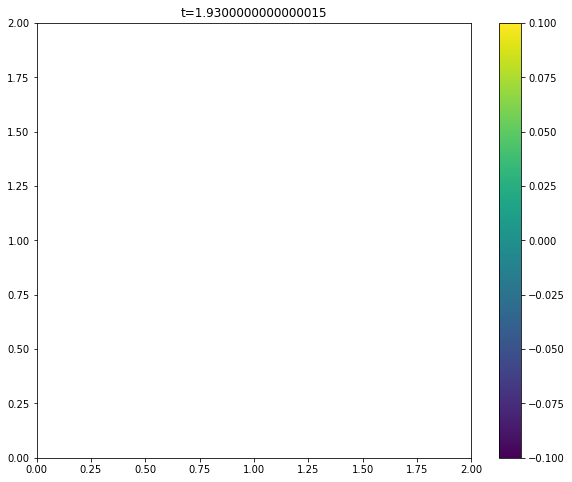

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


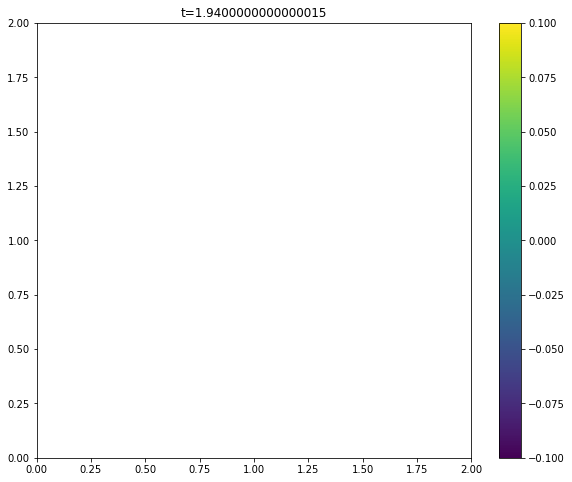

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


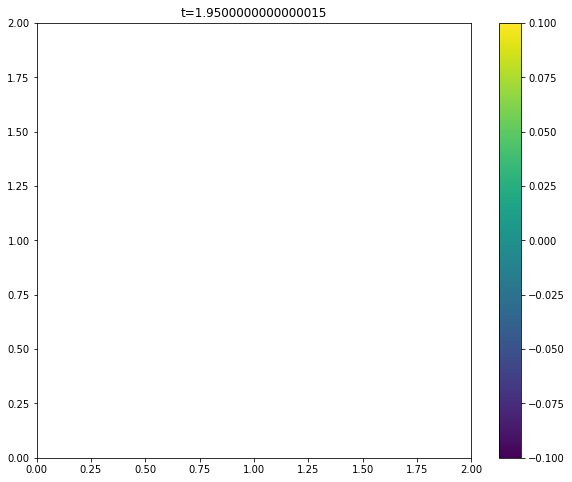

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


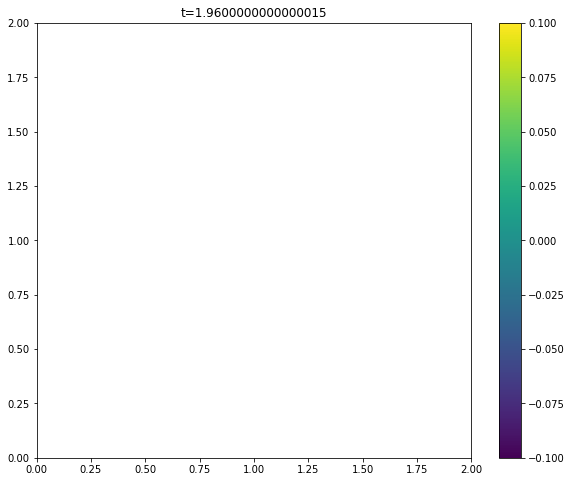

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


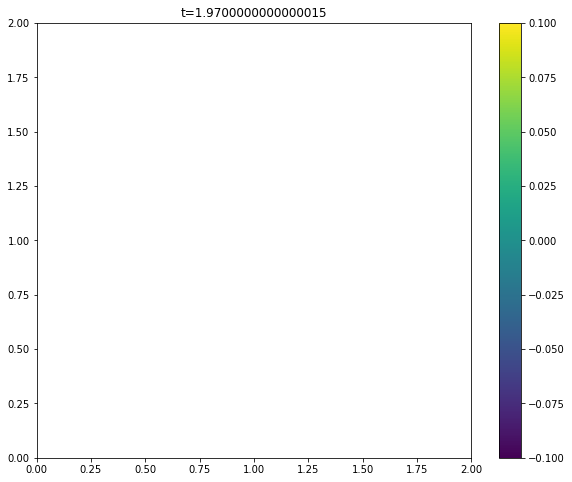

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


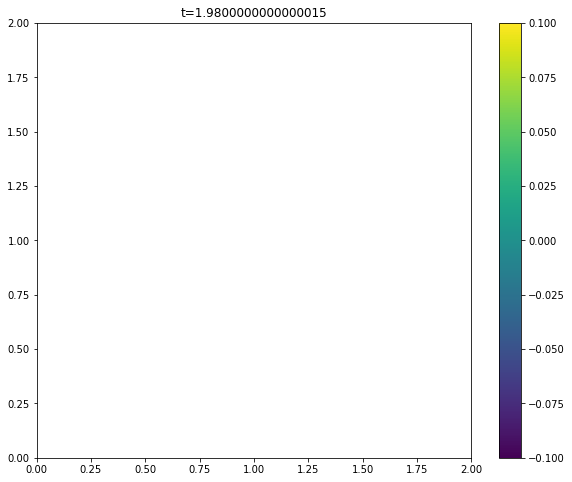

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


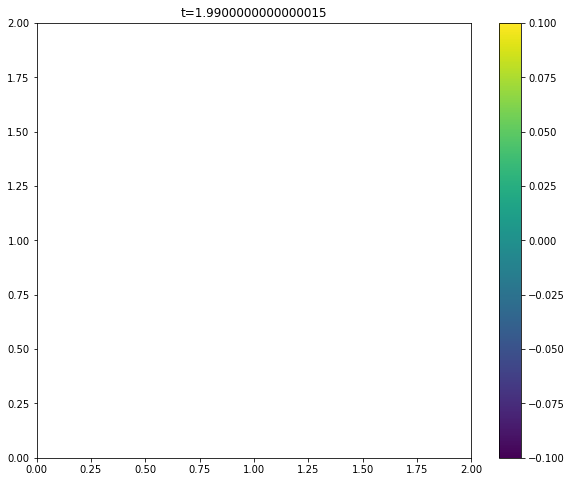

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


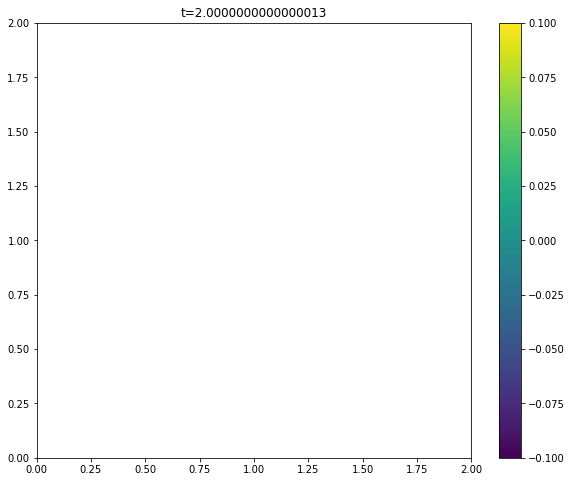

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


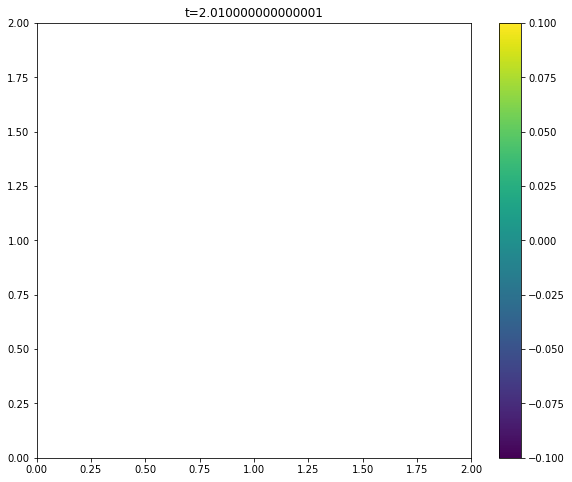

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


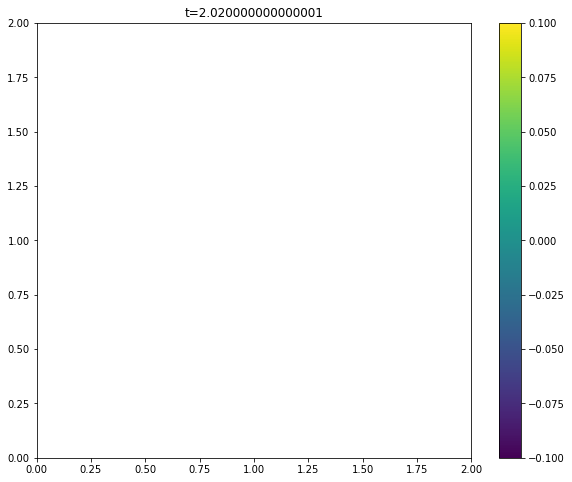

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


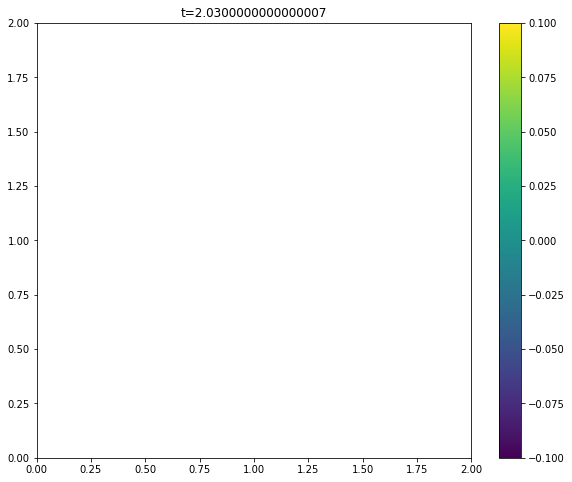

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


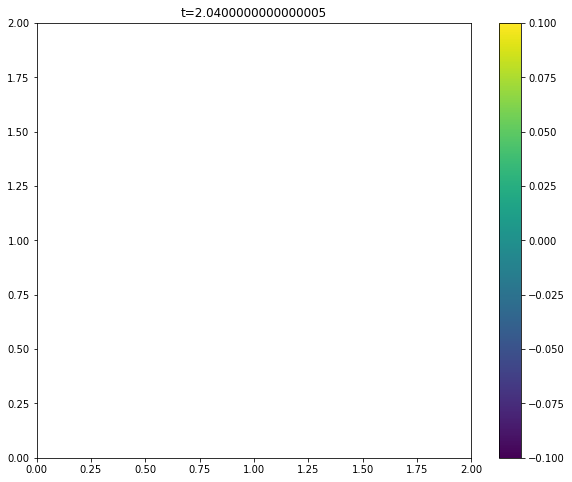

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


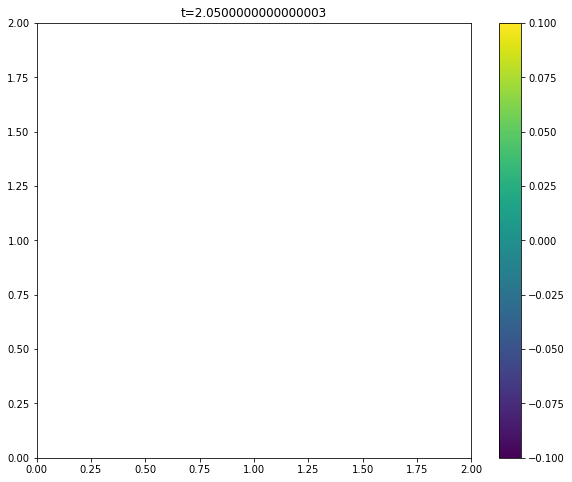

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


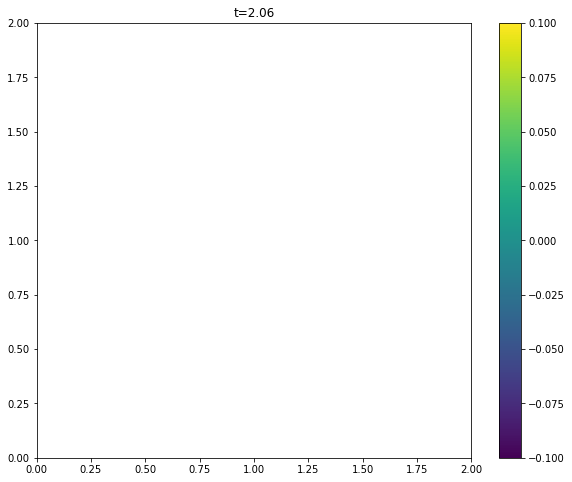

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


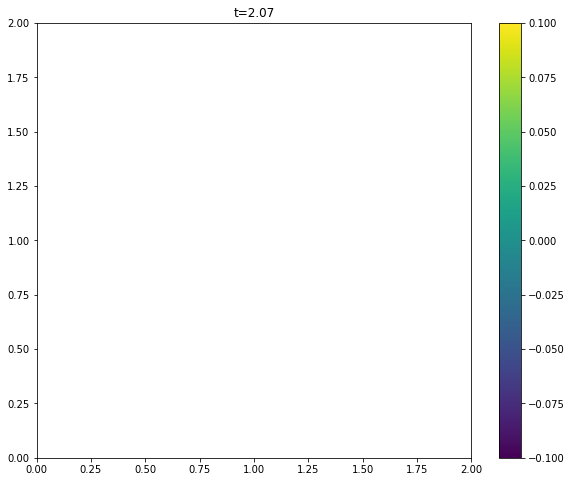

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


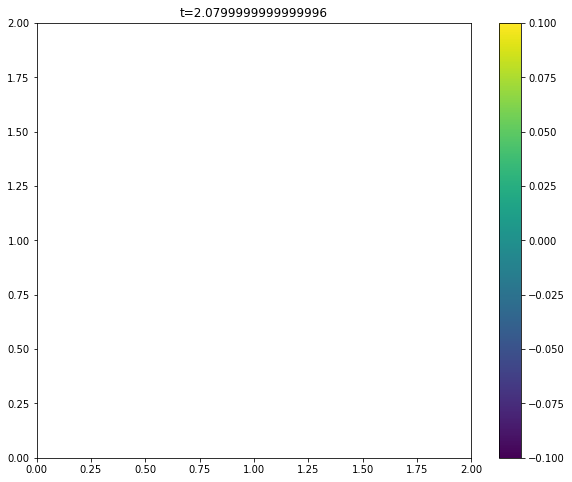

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


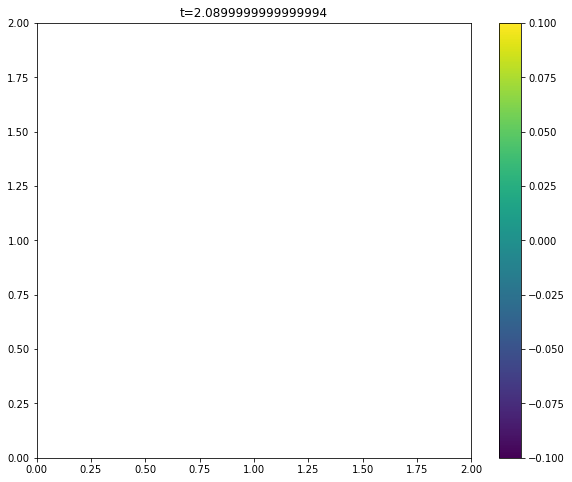

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


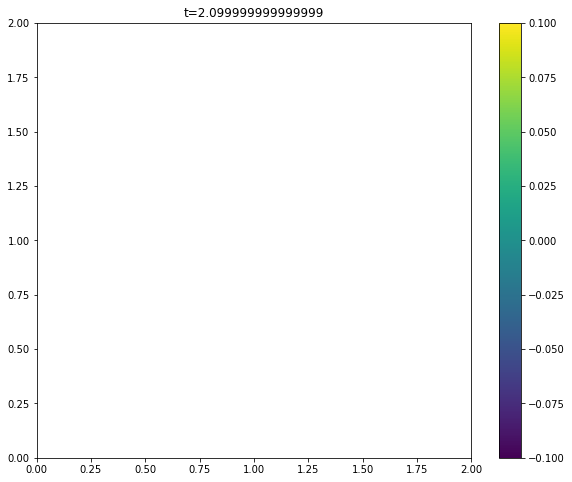

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


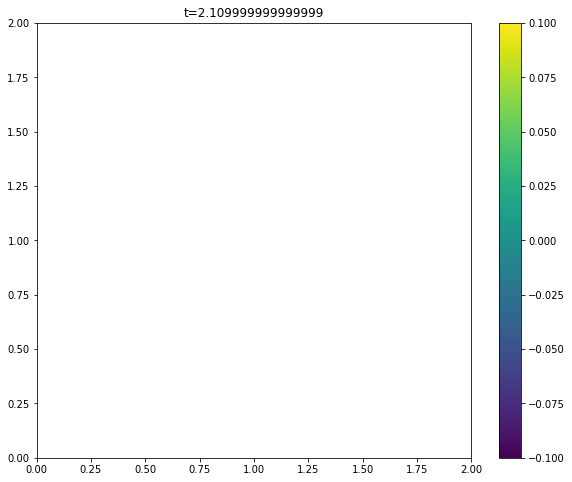

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


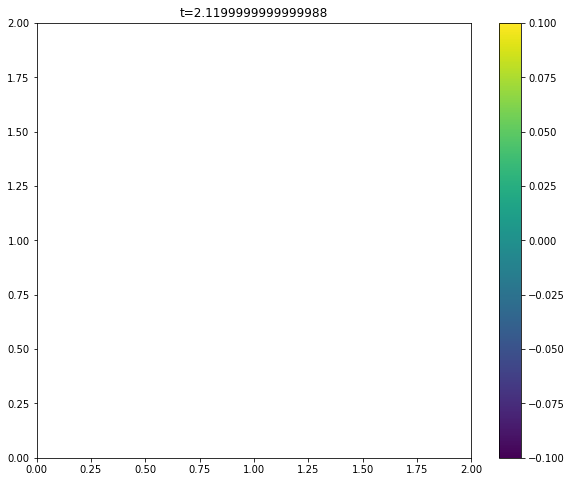

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


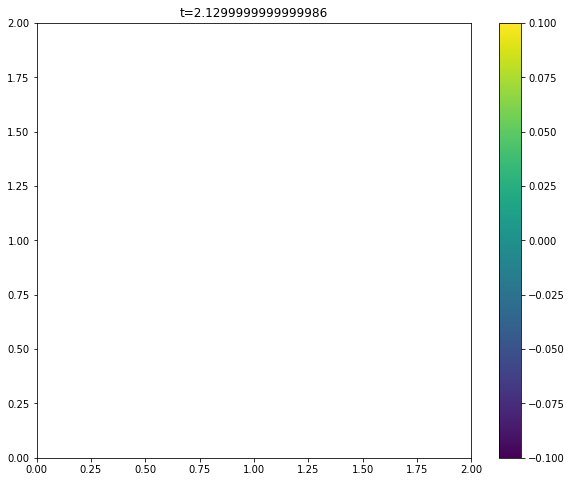

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


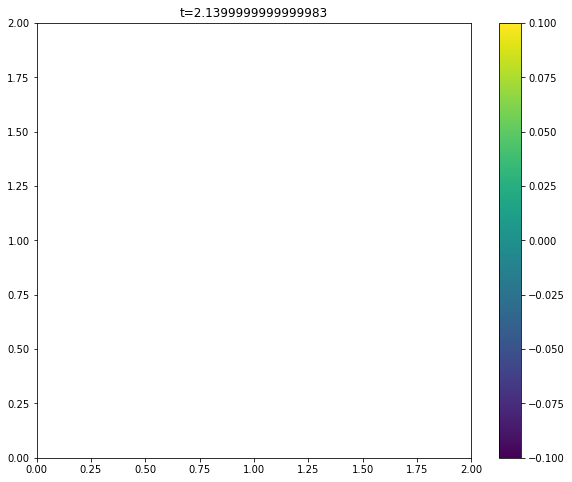

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


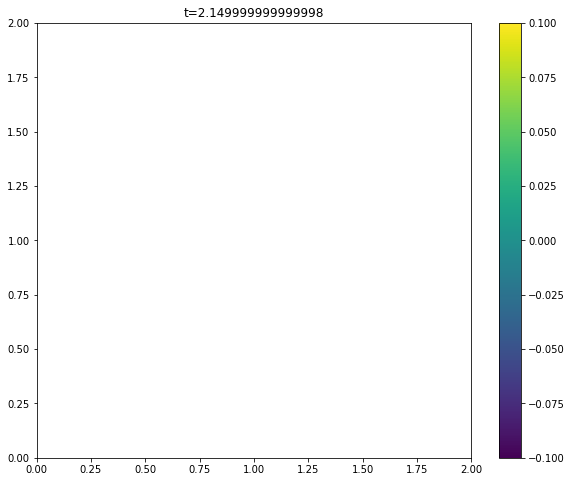

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


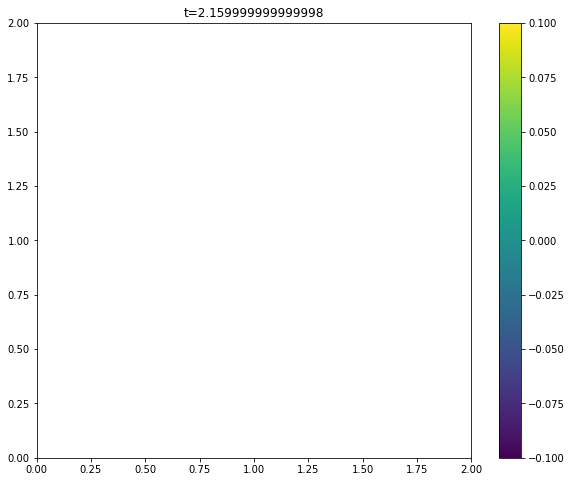

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


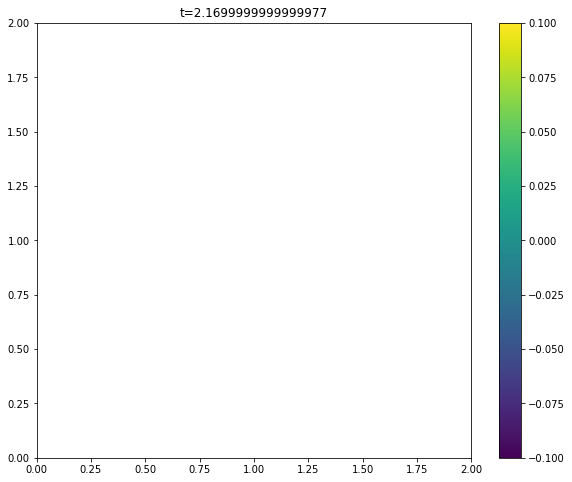

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


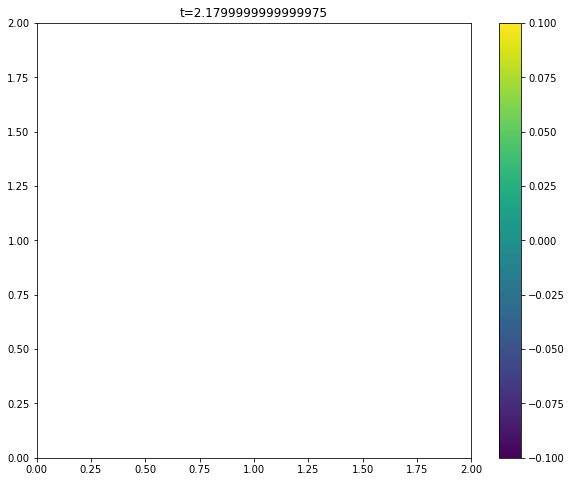

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


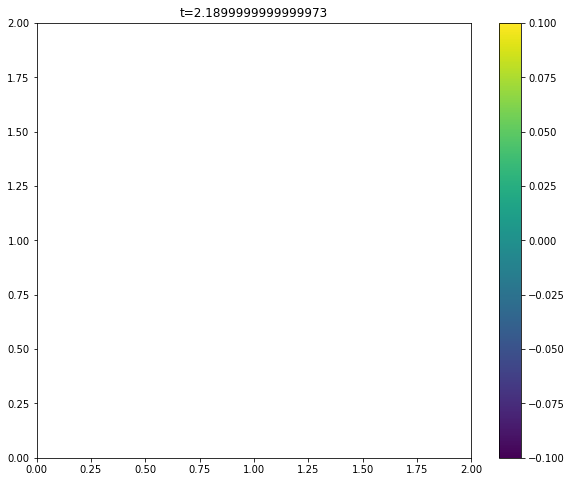

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


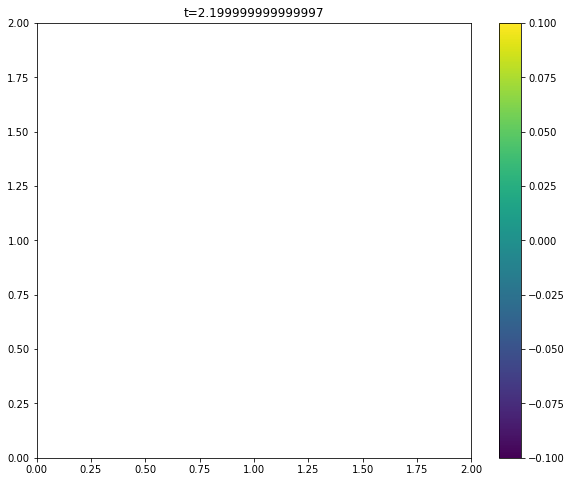

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


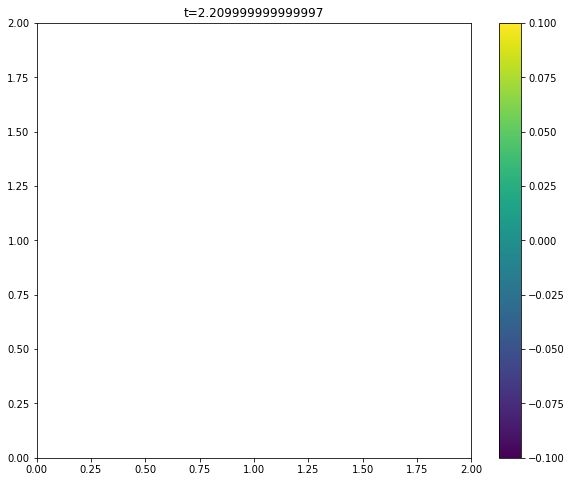

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


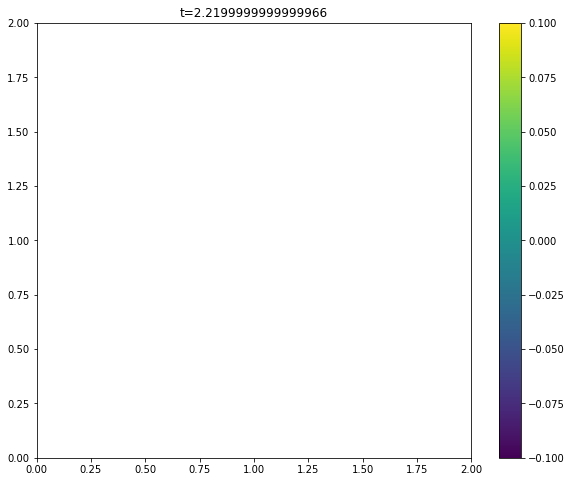

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


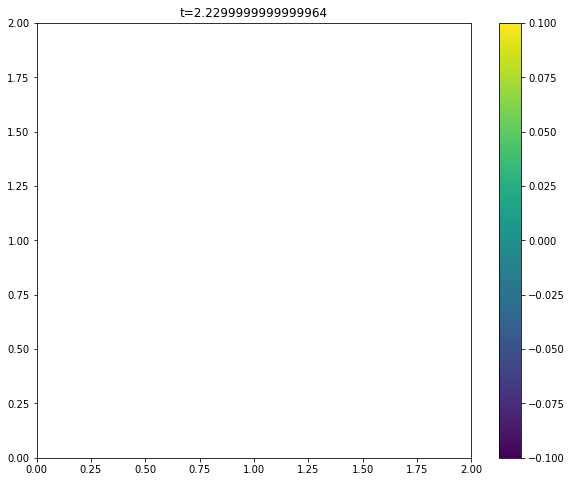

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


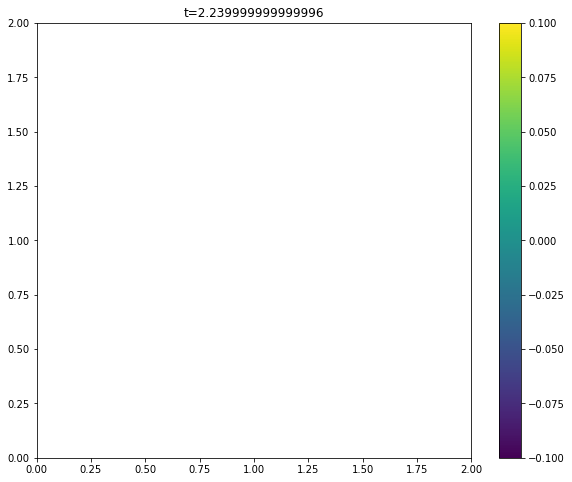

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


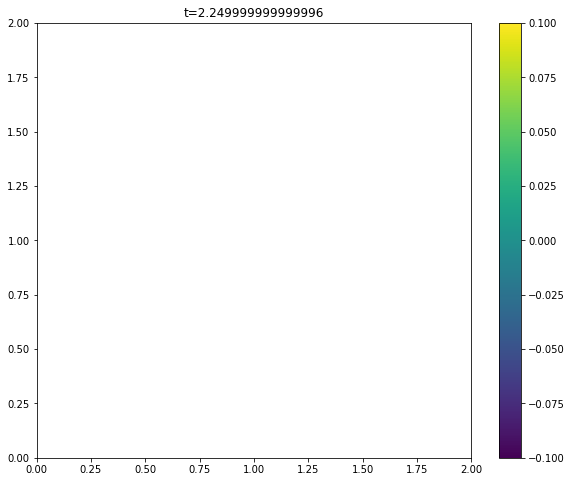

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


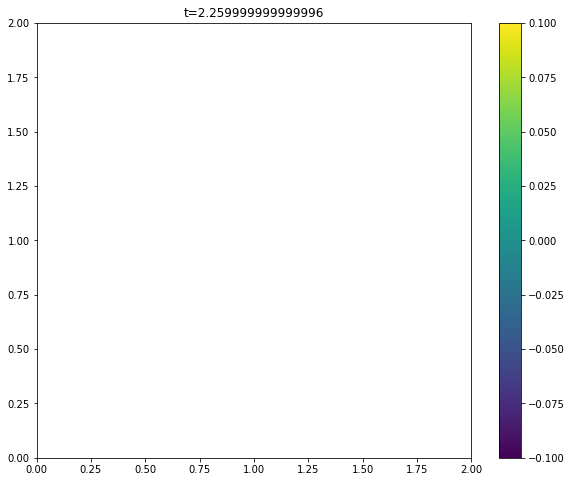

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


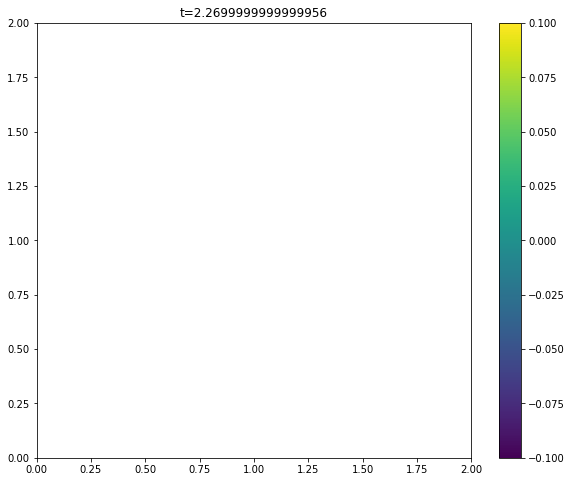

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


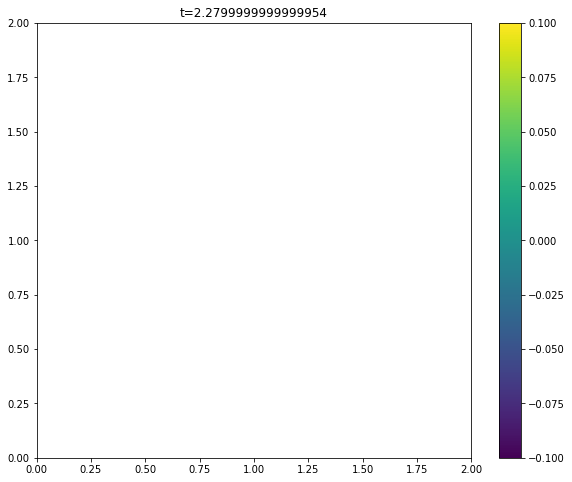

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


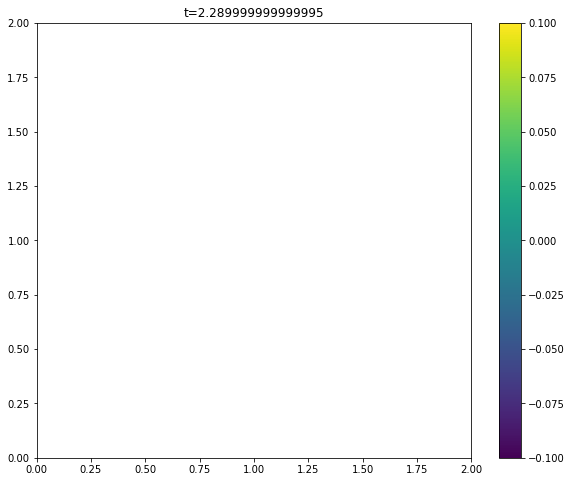

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


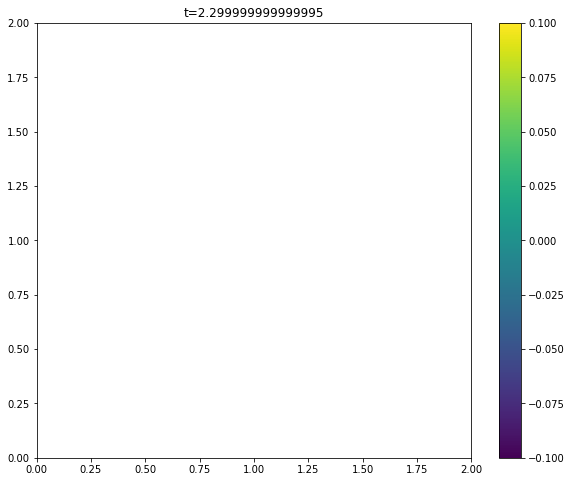

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


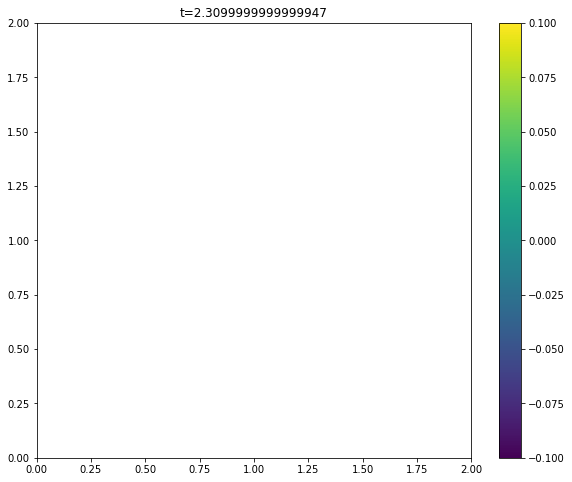

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


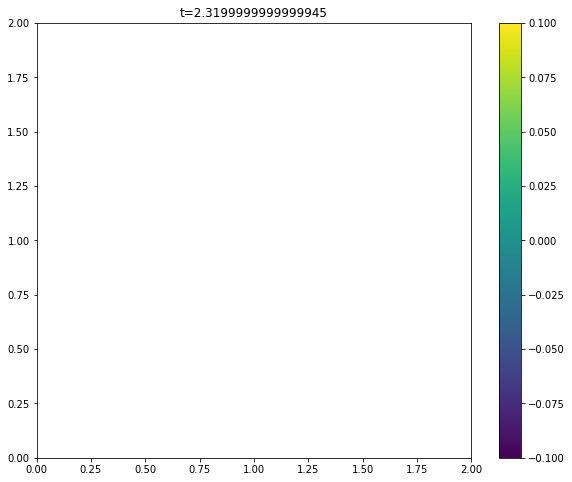

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


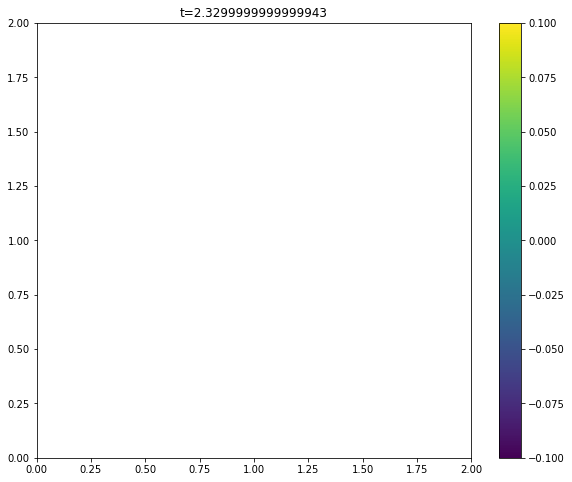

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


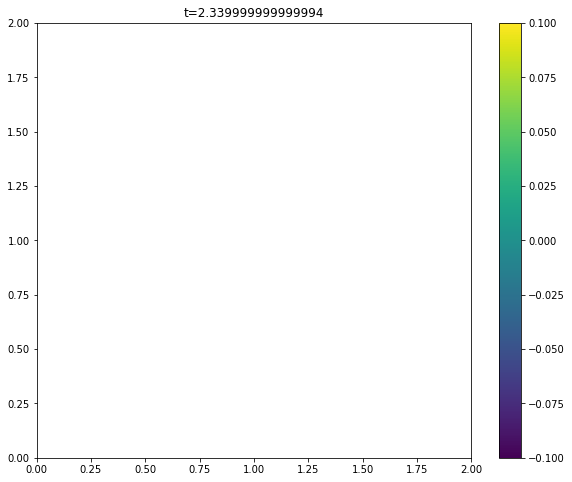

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


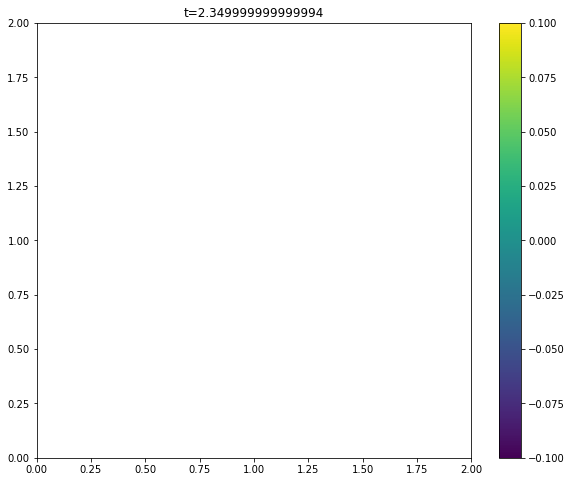

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


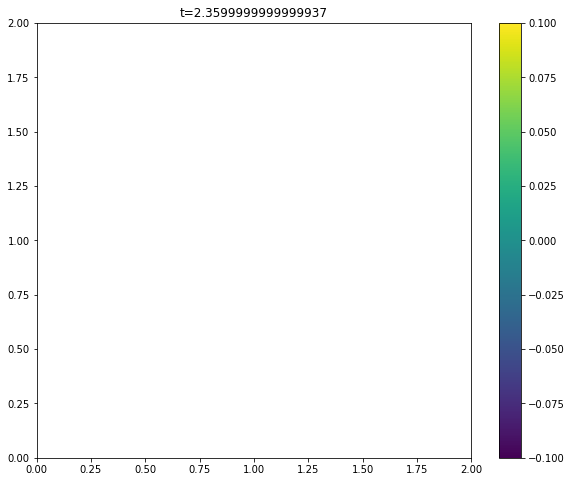

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


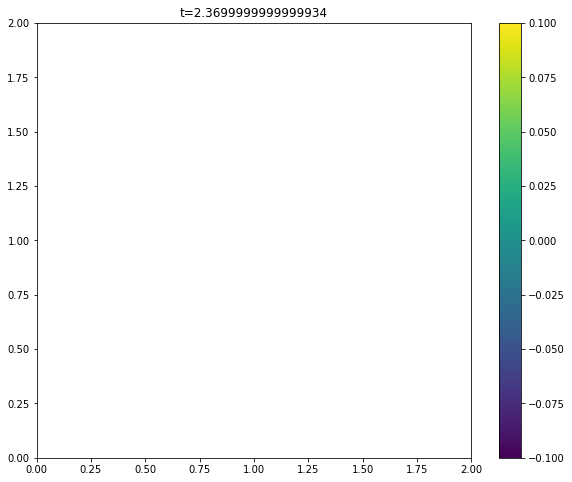

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


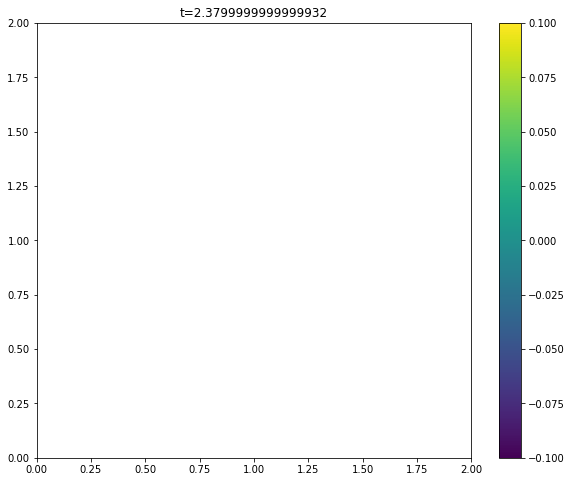

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


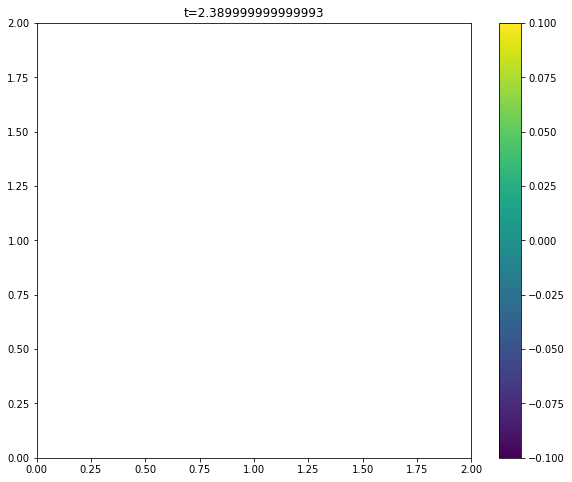

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


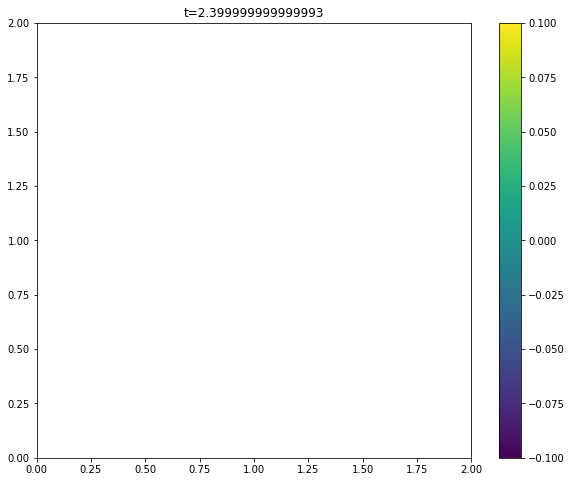

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


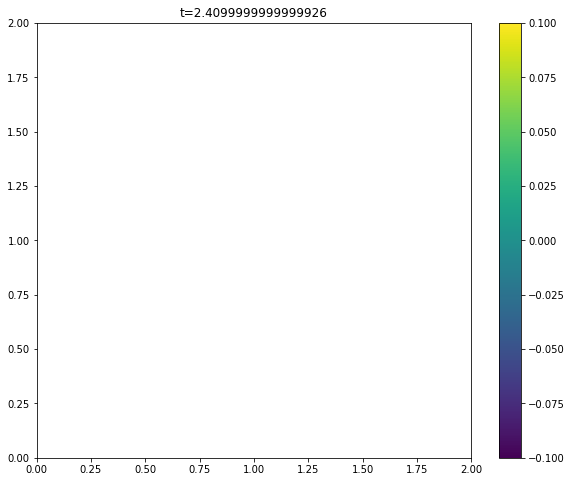

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


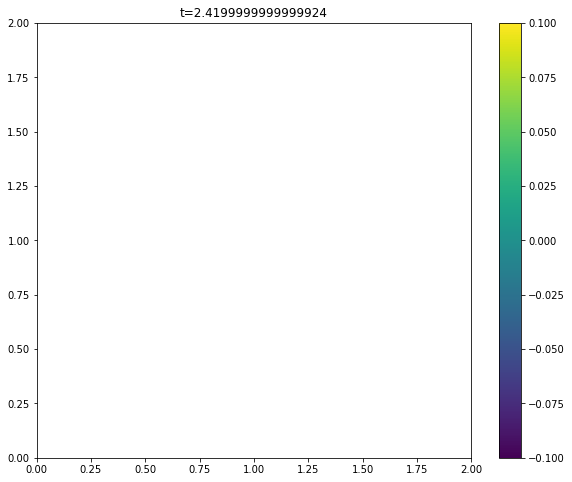

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


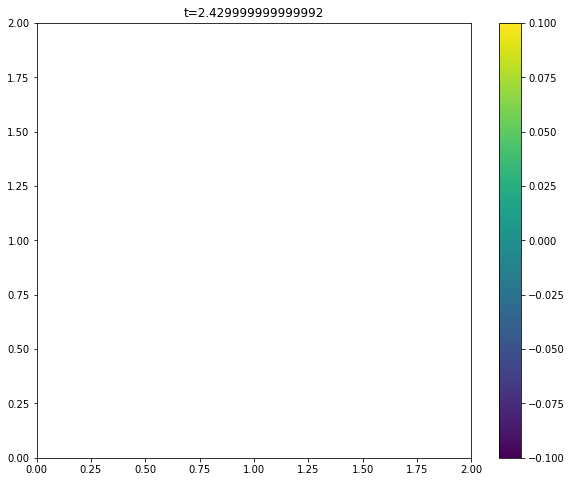

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


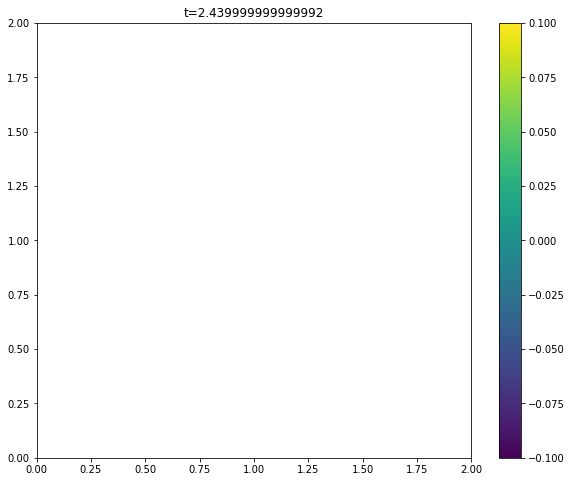

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


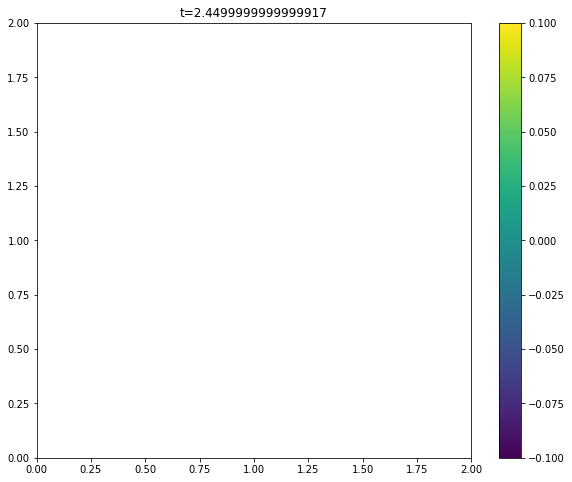

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


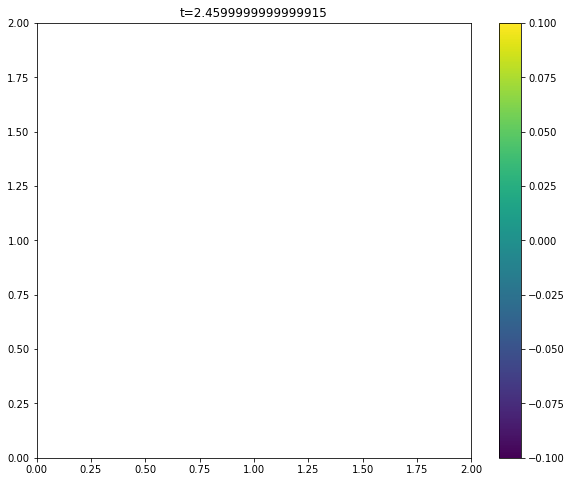

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


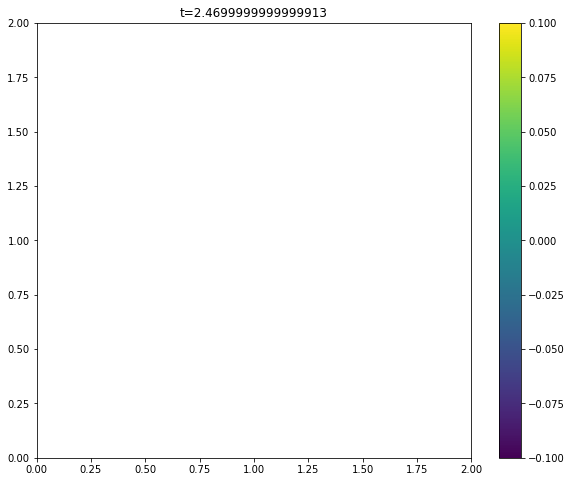

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


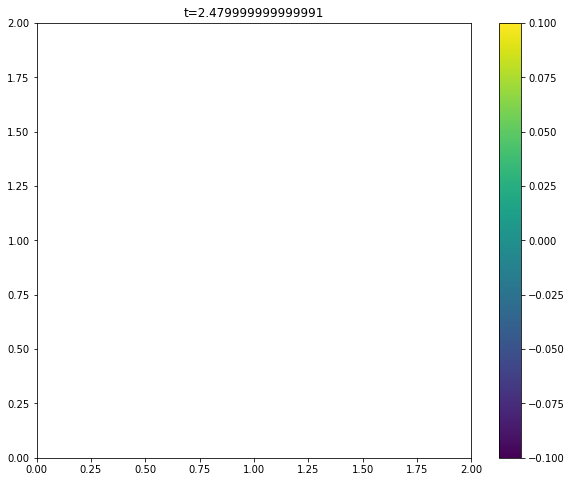

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


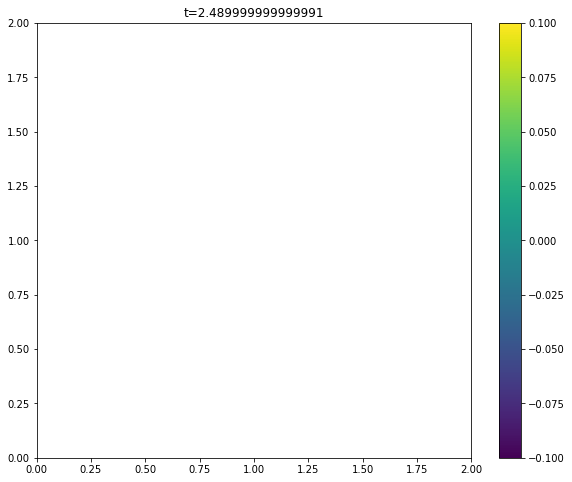

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


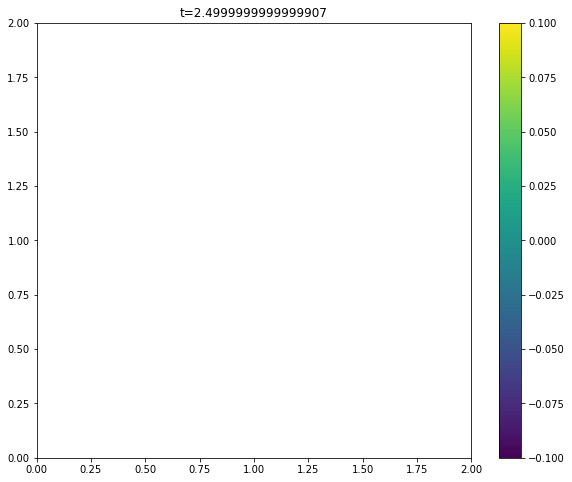

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


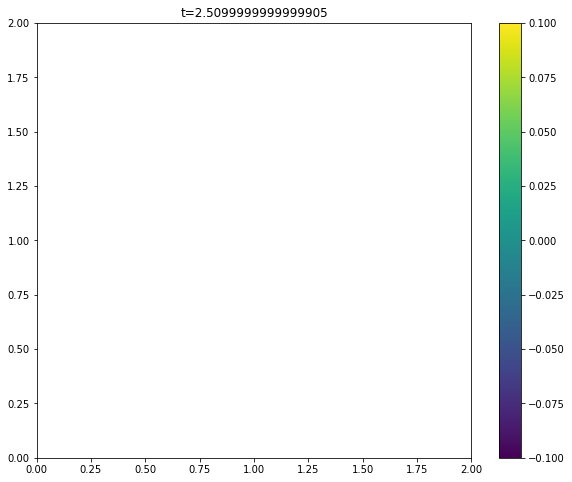

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


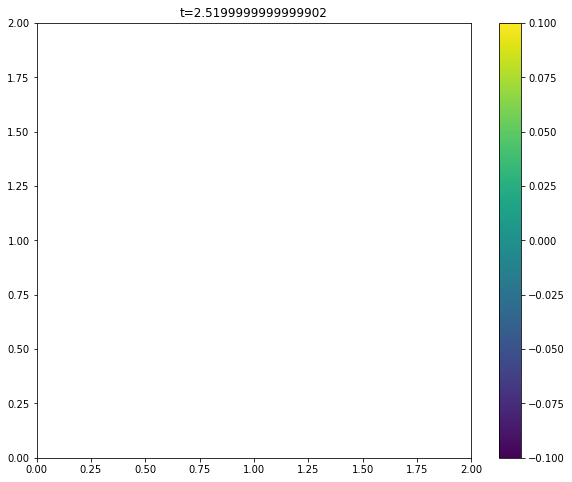

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


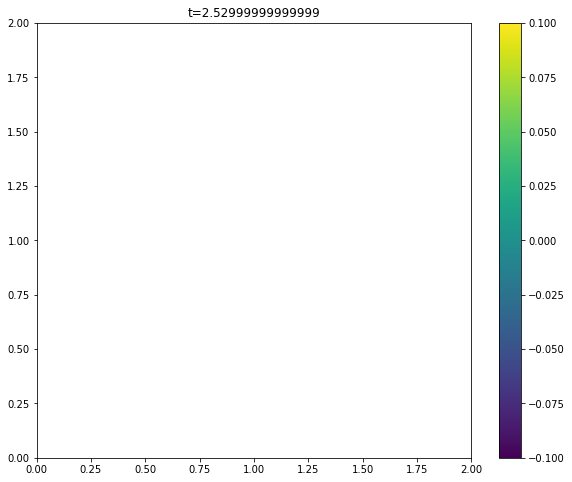

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


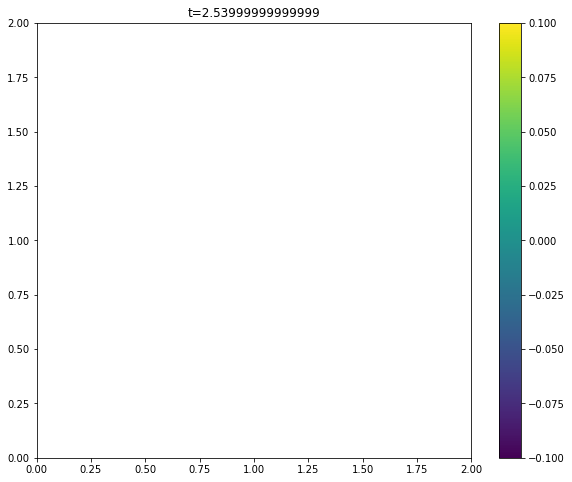

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


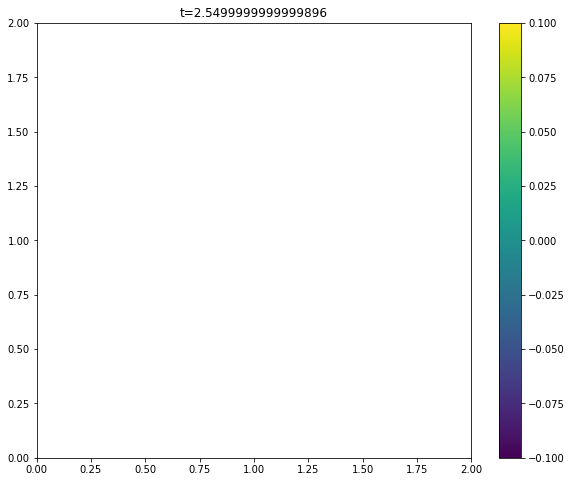

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


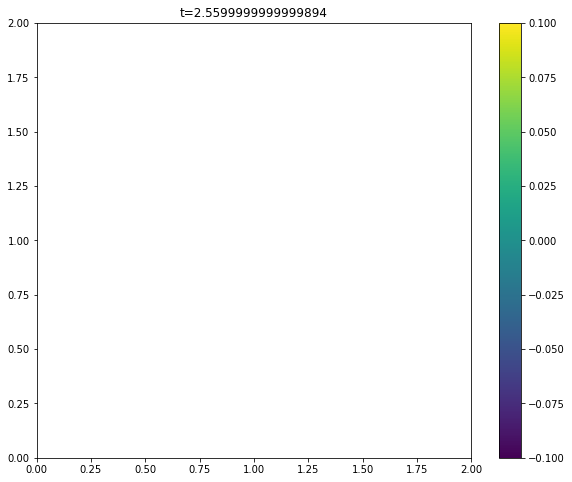

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


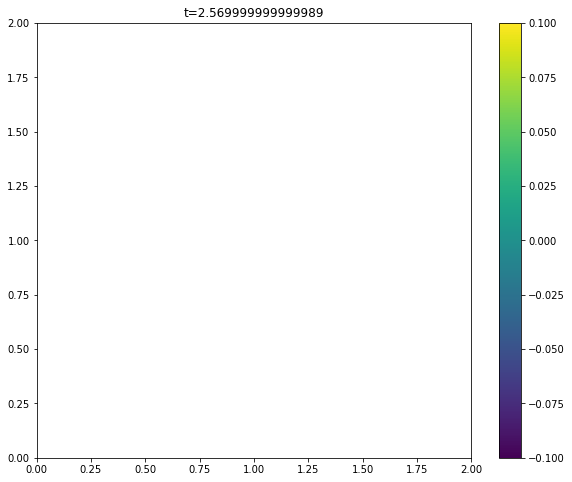

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


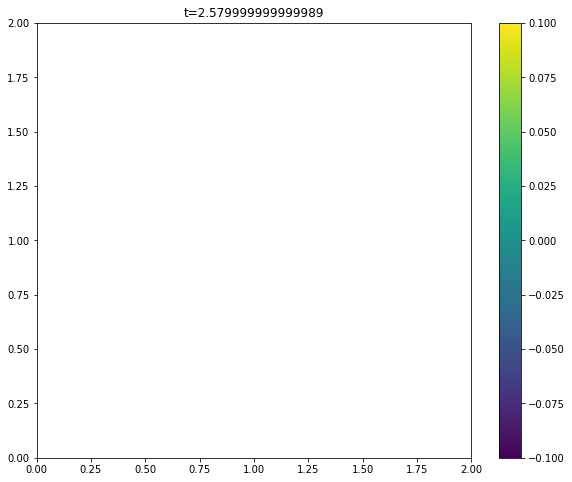

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


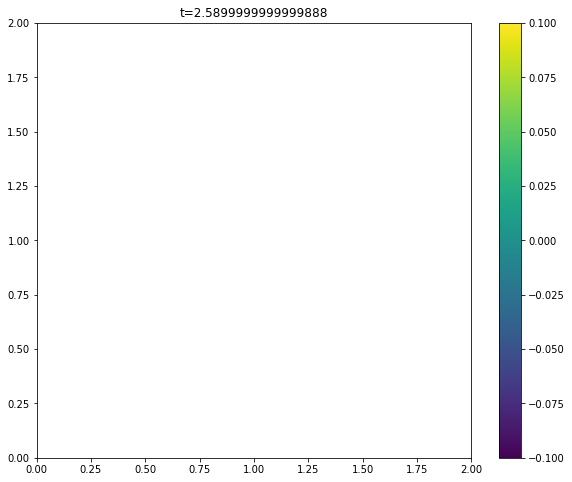

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


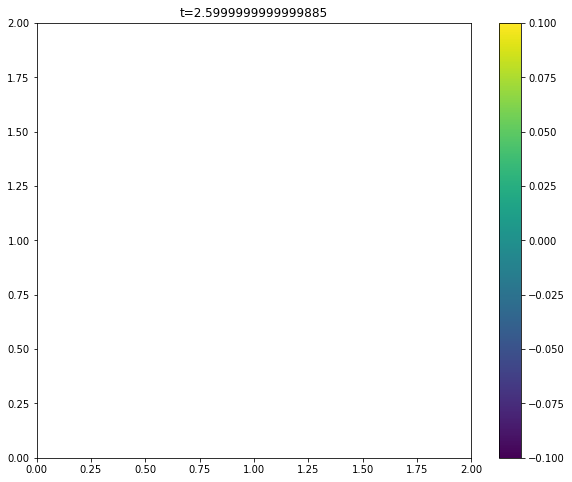

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


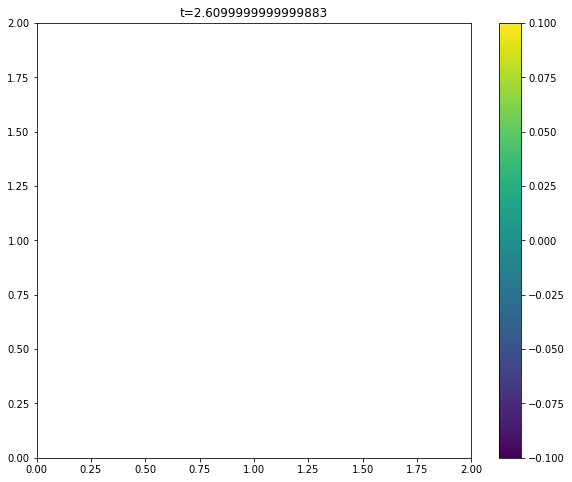

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


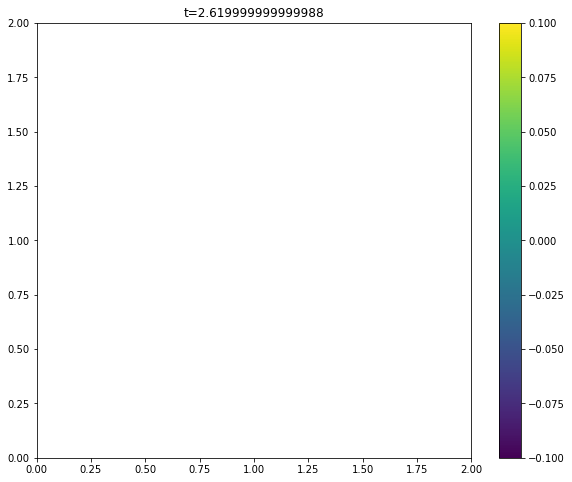

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


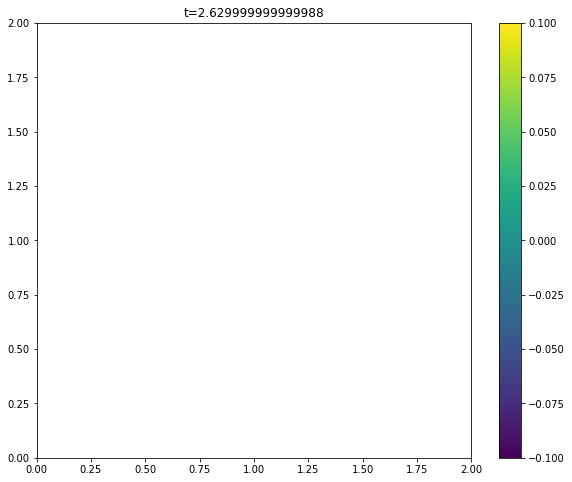

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


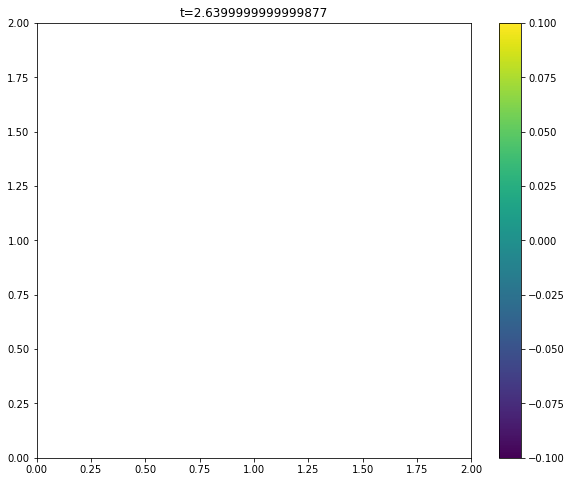

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


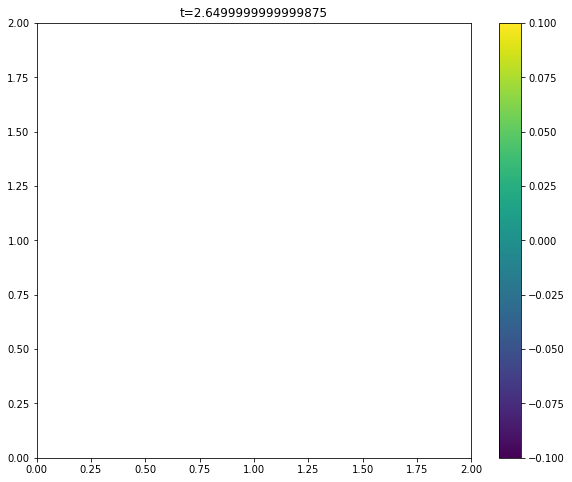

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


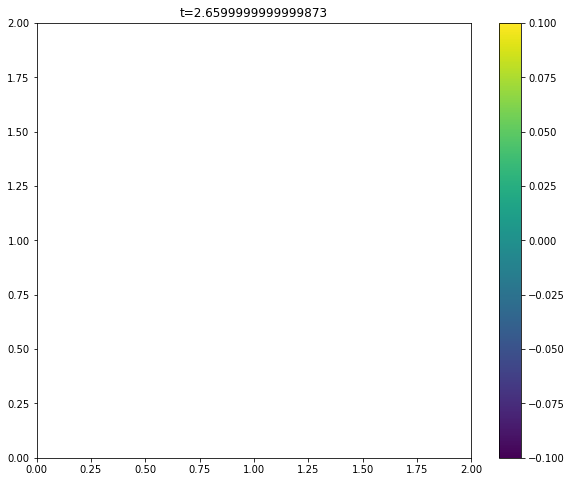

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


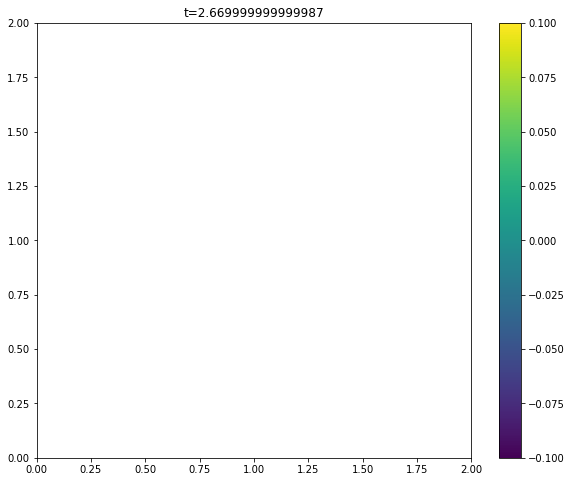

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


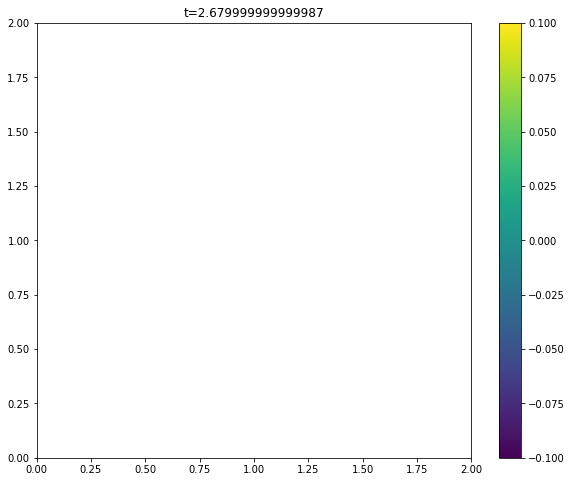

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


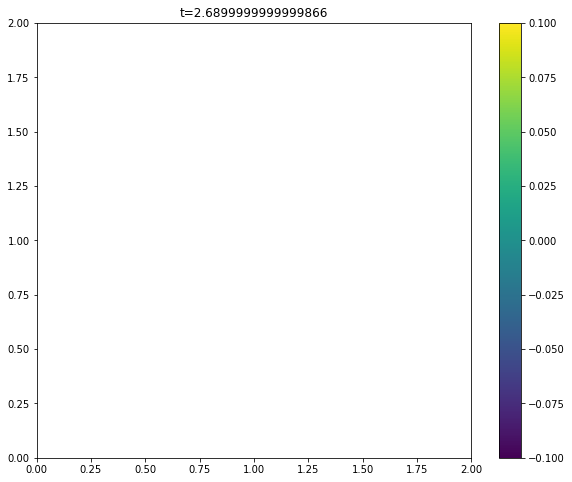

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


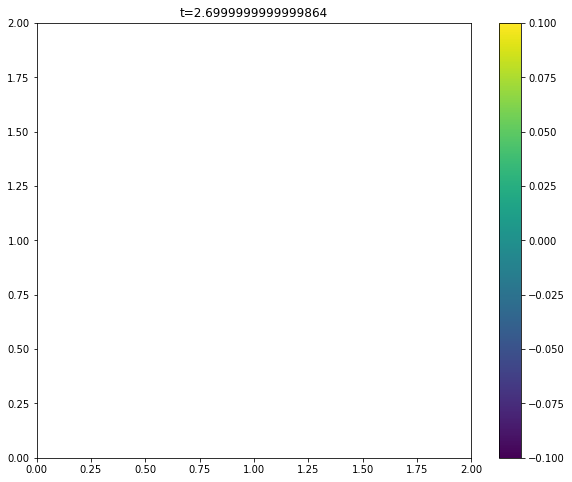

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


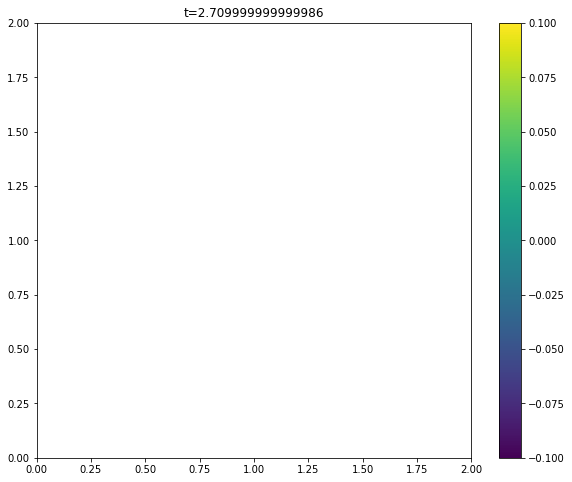

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


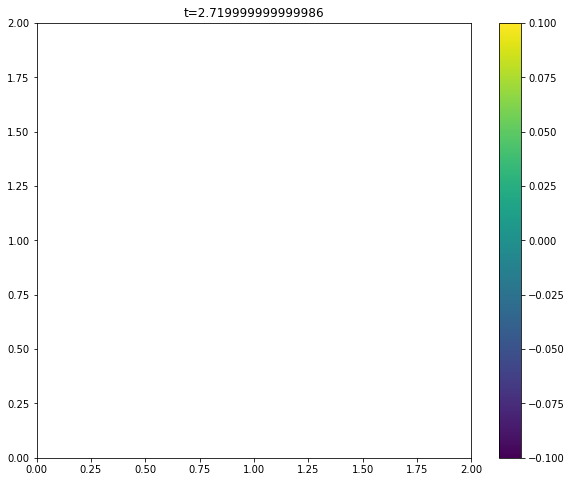

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


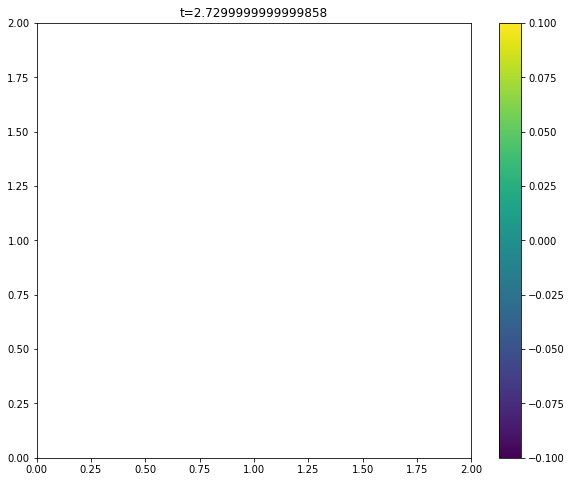

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


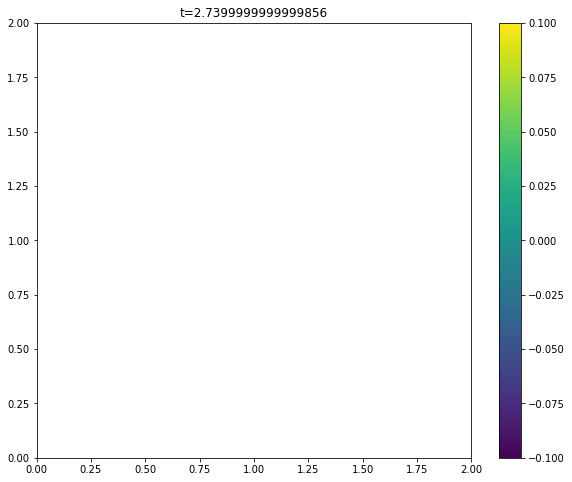

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


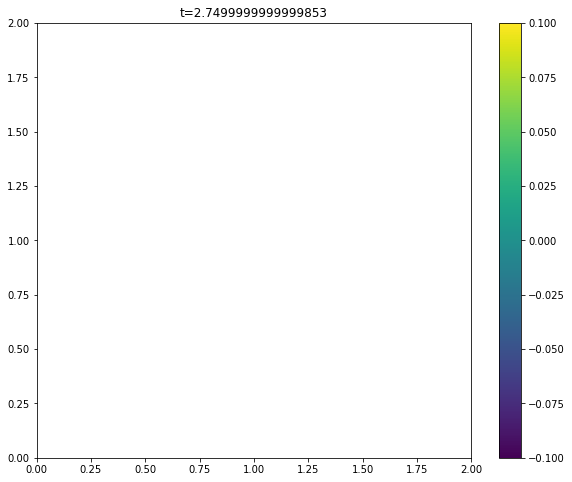

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


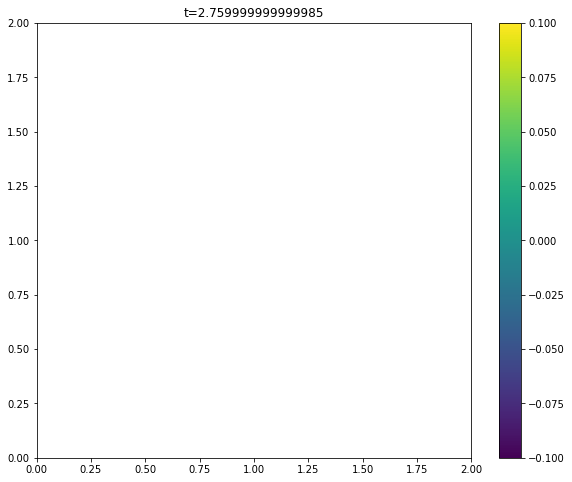

[[nan nan]
 [nan nan]]
Omega
[nan nan]
ax
[nan nan]


KeyboardInterrupt: 

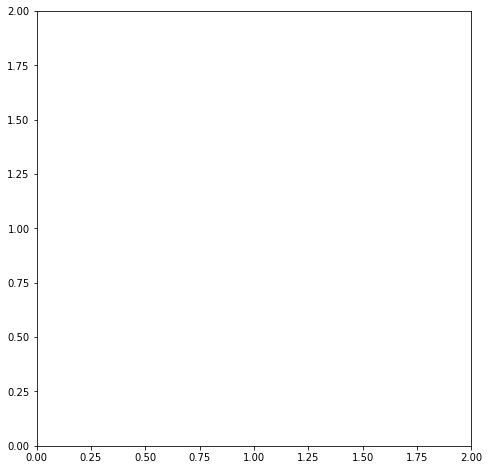

In [1]:
import numpy as np 
import matplotlib.pyplot as plt

from fluid import FLUID    #### Generic fluid solver
from pib2 import PIB2

#### Set the boundary points of solid to a circle of specified radius (float) and position (1x2 float)
def CIRCLE(Nb, RAD, POS):  
    theta = np.linspace(0, 2*np.pi, Nb)
    return np.array(POS)[:, np.newaxis] + RAD*np.array([np.cos(theta), np.sin(theta)])
    
    
#### Iterate fluids and immersed solids using built-in functions
def iterate(fluid, solids):
    dt = fluid.dt
    fluid.t += dt
    
    ff = np.zeros(np.shape(fluid.u)) ## Force density on fluid
    for solid in solids:
        solid.step_XX(fluid.u)
        ff += solid.ff # Force at midpoint
    uu=fluid.step_u(ff) # Step Fluid Velocity
    for solid in solids:
        solid.step_X(uu) # full step using midpoint velocity                   
    
#### Initialization
fluid = FLUID(L=2.)
plt.figure(figsize=(8, 8))
fluid.show_streamlines(cmap='autumn')
plt.title('Initial Velocity Profile')
plt.show()

circle = CIRCLE(100, 0.2, (0.5, 0.5))*fluid.L
solids = PIB2(circle, fluid.N, fluid.h, fluid.dt)

print(solids.YCM)
plt.scatter(solids.C[0], solids.C[1])
plt.show()
# print(solids.N)
# fluid.N *= 2
# print(solids.N)
# solids = IB2(100, fluid.N, fluid.h)
solids = [solids]

for i in range(300):
    iterate(fluid, solids)
    if i%1==0:
        
        plt.figure(figsize=(10, 8))
        fluid.show_vorticity()
        fluid.show_streamlines()
        for solid in solids:
            solid.show_X()
            plt.scatter(solid.Y[0], solid.Y[1])
#             plt.scatter(solid.XX[0], solid.XX[1])
        plt.title('t={}'.format(fluid.t))
        plt.show()
        print(solids[0].E)
        
print(np.shape(solids[0].X))

In [4]:
print(solids[0].dtheta)
print(np.shape(circle))

INNER = np.array([np.inner(circle[:,i], circle[:,i]) for i in range(circle.shape[1])])
print(INNER)
print(np.linalg.norm(circle, axis=0)**2)
# x1 = circle[:, 0]
# print(np.inner(circle, circle))
# print(np.inner(x1, x1))
# print(np.outer(x1, x1))
# print(np.inner(x1, x1)*np.eye(2) - np.outer(x1, x1))

0.06283185307179587
(2, 100)
[2.96       3.00912848 3.05483781 3.09694395 3.13527735 3.16968365
 3.20002431 3.22617716 3.24803689 3.26551548 3.27854255 3.28706564
 3.29105044 3.2904809  3.28535931 3.27570629 3.26156072 3.24297955
 3.22003761 3.19282727 3.16145809 3.1260564  3.08676474 3.04374133
 2.9971594  2.94720653 2.89408386 2.83800528 2.77919662 2.71789468
 2.65434628 2.58880733 2.52154173 2.45282032 2.38291983 2.31212172
 2.24071107 2.16897543 2.09720364 2.02568471 1.95470663 1.88455518
 1.81551286 1.74785766 1.68186202 1.61779167 1.5559046  1.49645001
 1.4396673  1.38578511 1.33502042 1.28757763 1.24364777 1.20340774
 1.16701958 1.13462979 1.10636881 1.08235042 1.06267136 1.04741084
 1.03663034 1.03037324 1.02866475 1.03151175 1.03890278 1.05080807
 1.06717968 1.08795169 1.11304046 1.14234497 1.17574722 1.21311271
 1.25429098 1.29911621 1.34740793 1.39897166 1.45359979 1.51107234
 1.57115789 1.63361451 1.69819069 1.76462641 1.83265417 1.90200003
 1.97238477 2.04352496 2.11513416

In [22]:
OUTER = np.array([np.outer(circle[:,i], circle[:,i]) for i in range(circle.shape[1])])
# print(OUTER)
print(np.sum(OUTER, axis=0))
print(np.inner(circle, circle))

[[108.88 100.4 ]
 [100.4  107.92]]
[[108.88 100.4 ]
 [100.4  107.92]]


## Some notes about notation

We translate the pibm described here https://math.nyu.edu/faculty/peskin/ib_lecture_notes/KimPeskin_rigid.pdf into python. One aspect of this is vectorizing the matrix operations described in the paper into an efficient numpy formulation. As an illustrative example, take Eq. 19, where we compute the moment of inertia of the rigid body:

$I_0 = \sum_{k=1}^{N_b}m_k(C_K^TC_KI_3 - C_kC_k^T)\Delta q\Delta r\Delta s$

In this case, $C_k$ and $m_k$ describe the coordinates (in rigid body COM frame) and the mass anof each rigid body point $k$; $\Delta q\Delta r\Delta s$ is a scalar factor associated with rigid body point spacing; and $I_3$ is the 3x3 identity matrix. In particular, we'd like to translate this quantity

$\sum_{k=1}^{N_b}C_K^TC_KI_2 - C_kC_k^T$

into python. (Note that we switch to $I_2$ because we're working in 2D). This can of course be computed using loops, but we show that these expressions can be equivalently expressed using inner and outer products:

(2, 100)


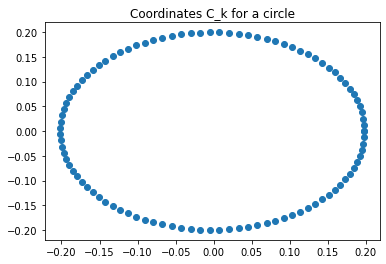

In [28]:
def CIRCLE(Nb, RAD, POS):  
    theta = np.linspace(0, 2*np.pi, Nb)
    return np.array(POS)[:, np.newaxis] + RAD*np.array([np.cos(theta), np.sin(theta)])

circle = CIRCLE(100, 0.2, (0.5, 0.5))
circle -= np.mean(circle, axis=1)[:, np.newaxis]
print(np.shape(circle))
plt.scatter(circle[0], circle[1])
plt.title('Coordinates C_k for a circle')
plt.show()

In [3]:
#### First, let's calculate the sum explicitly using loops:

print('Using Sums:')
TERM1 = [np.inner(circle[:,i], circle[:,i]) for i in range(circle.shape[1])]
TERM1 = sum([val*np.eye(2) for val in TERM1])
print('Sum of First Terms')
print(TERM1)
print()

TERM2 = [np.outer(circle[:,i], circle[:,i]) for i in range(circle.shape[1])]
TERM2 = sum(TERM2)
print('Sum of Second Terms')
print(TERM2)
print()

print('Total sum:')
print(TERM1 - TERM2)
print()
print()

#### Now, let's compute the equivalent, vectorized code. We note that the first term is simply the sum of |C_k|^2,
#### and the second term is a sum of outer products, which is equivalent to an inner product (or contraction) of 
####   the TENSOR C of all C_k's with itself:
print('Vectorized:')

TERM1 = sum(np.linalg.norm(circle, axis=0)**2)*np.eye(2)
print('Sum of first terms (i.e. norm):')
print(TERM1)
print()

TERM2 = np.inner(circle, circle)
print('Sum of second terms (i.e. inner product):')
print(TERM2)
print()

print('Total sum:')
print(TERM1 - TERM2)

Using Sums:
Sum of First Terms
[[216.8   0. ]
 [  0.  216.8]]

Sum of Second Terms
[[108.88 100.4 ]
 [100.4  107.92]]

Total sum:
[[ 107.92 -100.4 ]
 [-100.4   108.88]]


Vectorized:
Sum of first terms (i.e. norm):
[[216.8   0. ]
 [  0.  216.8]]

Sum of second terms (i.e. inner product):
[[108.88 100.4 ]
 [100.4  107.92]]

Total sum:
[[ 107.92 -100.4 ]
 [-100.4   108.88]]


In [5]:
import numpy as np

A = (10*np.random.random([3, 3])).astype(int)
B = (10*np.random.random([3, 3])).astype(int)
I3 = np.eye(3)
print(A)
print(B)
print(I3)

[[4 5 6]
 [8 3 3]
 [6 0 8]]
[[6 9 7]
 [8 1 2]
 [1 3 4]]
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]


In [17]:
print(np.matmul(A, B))
print()
print(A.dot(B))
print()
print(B.dot(A))
print()
print(A.transpose().dot(B.transpose()))
print()

[[70 59 62]
 [75 84 74]
 [44 78 74]]

[[70 59 62]
 [75 84 74]
 [44 78 74]]

[[138  57 119]
 [ 52  43  67]
 [ 52  14  47]]

[[138  52  52]
 [ 57  43  14]
 [119  67  47]]



In [16]:
print(A.dot(A.transpose()))
print()

[[ 77  65  72]
 [ 65  82  72]
 [ 72  72 100]]



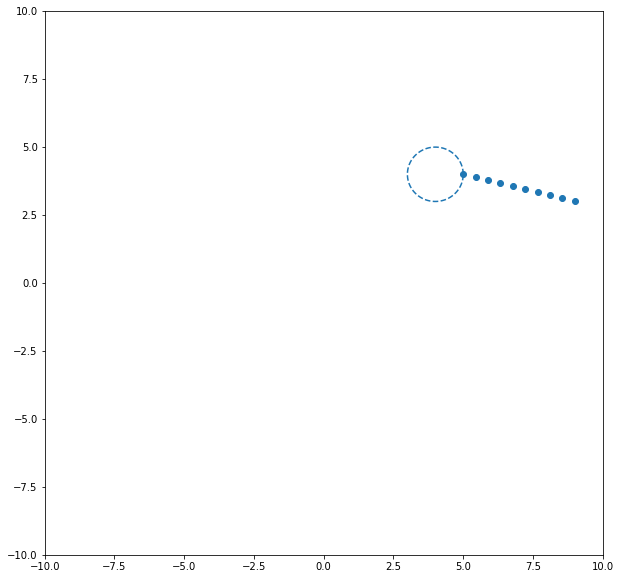

In [44]:
import matplotlib.pyplot as plt
import numpy as np

def rot(ax, theta, X): return np.cos(theta)*X + (1-np.cos(theta))*np.dot(ax, X)*ax + np.sin(theta)*np.cross(ax, X)


I2 = np.eye(2)

X = np.linspace(5, 9, 10)
Y = np.linspace(4, 3, 10)
R = np.vstack([X, Y])
RCM = np.array([4, 4])
theta = np.linspace(0, 2*np.pi, 100)

plt.figure(figsize=(10,10))
plt.plot(RCM[0]+np.cos(theta), RCM[1]+np.sin(theta), linestyle='--')
plt.scatter(R[0], R[1])
plt.xlim([-10, 10])
plt.ylim([-10, 10])
plt.show()



[1. 0.]
(2, 10)
[[5.         5.44444444 5.88888889 6.33333333 6.77777778 7.22222222
  7.66666667 8.11111111 8.55555556 9.        ]
 [4.         3.88888889 3.77777778 3.66666667 3.55555556 3.44444444
  3.33333333 3.22222222 3.11111111 3.        ]]


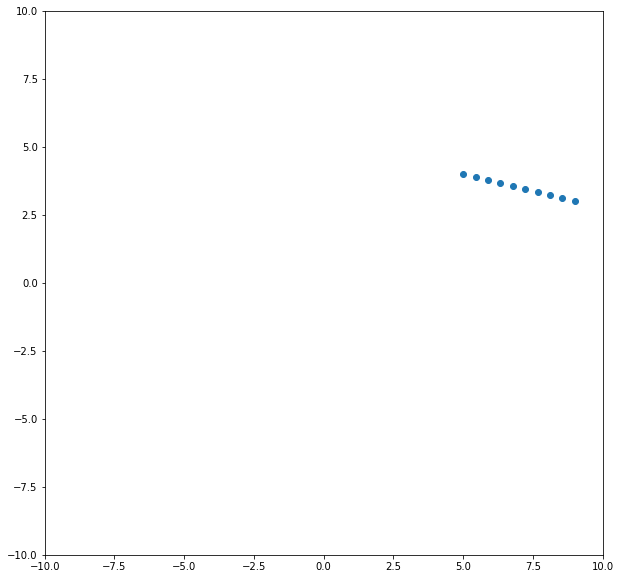

In [59]:
plt.figure(figsize=(10,10))
plt.plot(RCM[0]+np.cos(theta), RCM[1]+np.sin(theta), linestyle='--')
plt.scatter(R[0], R[1])
plt.xlim([-10, 10])
plt.ylim([-10, 10])



ax = R[:, 0]-RCM
print(ax)
theta = np.pi/4

Rr = [rot(ax, theta, R[:,i]) for i in range(R.shape[1])]
Rr = np.vstack(Rr).transpose()
Rr = [rot(ax, theta, Rr[:,i]) for i in range(Rr.shape[1])]
Rr = np.vstack(Rr).transpose()
print(np.shape(Rr))
print(R)
plt.scatter(Rr[0], Rr[1])
plt.show()




[1. 0.]
(2, 10)


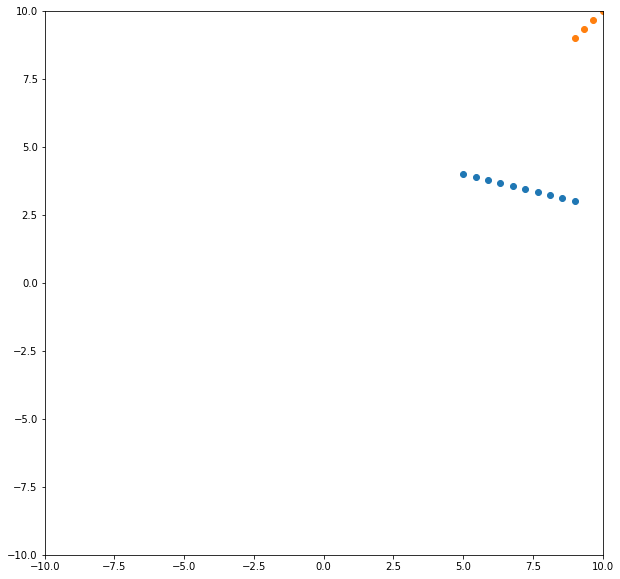

In [54]:
def rot(ax, theta, X): 
    out = np.cos(theta)*X 
    out += (1-np.cos(theta))*np.dot(ax, X) 
    out += np.sin(theta)*np.cross(ax, X, axisb=0)
    return out

plt.figure(figsize=(10,10))
plt.plot(RCM[0]+np.cos(theta), RCM[1]+np.sin(theta), linestyle='--')
plt.scatter(R[0], R[1])
plt.xlim([-10, 10])
plt.ylim([-10, 10])



ax = R[:, 0]-RCM
print(ax)
# theta = np.pi/4
theta=np.pi/2

print(np.shape(R))
Rr = rot(ax, theta, R)
# Rr = rot(ax, theta, Rr)
# Rr = rot(ax, theta, Rr)
# Rr = rot(ax, theta, Rr)

plt.scatter(Rr[0], Rr[1])
plt.show()
